**Preprocessing Women’s Clothing E-Commerce Reviews: Loading dataset from Google Drive, cleaning missing values, converting text to lowercase, and splitting 18,000 samples into training (14,000) and testing (4,000) sets with corresponding sentiment labels**

In [ ]:
# ==========================
# STEP 1: LOAD DATASET
# ==========================
import pandas as pd
import numpy as np

# Load the CSV (replace the file name if it's slightly different)
from google.colab import drive
drive.mount('/content/drive')

womendataset = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Womens Clothing E-Commerce Reviews.csv")

# Display original dimensions
print("Original dataset shape:", womendataset.shape)

# ==========================
# STEP 2: DATA CLEANING
# ==========================
# Keep only 'Review Text' and 'Recommended IND'
newwomendata = womendataset[['Review Text', 'Recommended IND']]

# Drop missing values
newwomendata.dropna(inplace=True)
print("After removing missing values:", newwomendata.shape)
print(newwomendata.head())

# Convert 'Review Text' to lowercase
newwomendata['Review Text'] = newwomendata['Review Text'].astype(str).str.lower()

# ==========================
# STEP 3: DATA SUBSETTING
# ==========================
# Use only the first 18,000 rows
sentiments = newwomendata['Recommended IND'].values[:18000]
reviews = newwomendata['Review Text'].values[:18000]

# Split into training (14,000) and testing (4,000)
reviews_trg = reviews[:14000]
reviews_test = reviews[14000:]
sentiments_trg = sentiments[:14000]
sentiments_test = sentiments[14000:]

# ==========================
# STEP 4: PRINT DIMENSIONS
# ==========================
print("Training Reviews:", reviews_trg.shape)
print("Testing Reviews:", reviews_test.shape)
print("Training Sentiments:", sentiments_trg.shape)
print("Testing Sentiments:", sentiments_test.shape)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Original dataset shape: (23486, 11)
After removing missing values: (22641, 2)
                                         Review Text  Recommended IND
0  Absolutely wonderful - silky and sexy and comf...                1
1  Love this dress!  it's sooo pretty.  i happene...                1
2  I had such high hopes for this dress and reall...                0
3  I love, love, love this jumpsuit. it's fun, fl...                1
4  This shirt is very flattering to all due to th...                1
Training Reviews: (14000,)
Testing Reviews: (4000,)
Training Sentiments: (14000,)
Testing Sentiments: (4000,)


/tmp/ipython-input-711621654.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newwomendata.dropna(inplace=True)
/tmp/ipython-input-711621654.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newwomendata['Review Text'] = newwomendata['Review Text'].astype(str).str.lower()


**Without Pretrained Model**

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('punkt_tab')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [ ]:
#Importing necessary libraries.
import re
import nltk
import numpy as np

#Creating a function for performing stemming.
ps = nltk.porter.PorterStemmer()
def func_stemming(text, stemmer=ps):
  text = ' '.join([stemmer.stem(word) for word in text.split()])
  return text

#Creating a functiom for removing special characters.
def func_special_characters(text, remove_digits=False):
  pattern = r'[^a-zA-Z0-9\s]' if not remove_digits else r'[^a-zA-Z\s]'
  text = re.sub(pattern, '', text)
  return text

#Creating a list of English stop words from the corpus.
stop_words = nltk.corpus.stopwords.words('english')

#Removing words like 'no' and 'not' from the list of English stop words.
stop_words.remove('no')
stop_words.remove('not')

#Creating a function for removing stop words.
def func_stopwords(text, stopwords=None):
  tokens = nltk.word_tokenize(text)
  tokens = [token.strip() for token in tokens]
  filtered_tokens = [token for token in tokens if token not in stopwords]
  filtered_text = ' '.join(filtered_tokens) # Changed to join with space to preserve word separation
  return filtered_text

#Creating text preprocessing function.
def func_text_process(document):
  #Converting to lowercase.
  document = document.lower()

  #Removing extra newlines, tabs, and carriage returns individually
  document = document.replace('\n', ' ').replace('\t', ' ').replace('\r', ' ')


  #Remove special characters and/or digits.
  document = func_special_characters(document, remove_digits=True)

  #Stemming of text data using the function.
  document = func_stemming(document)

  #Removing stop words using the function.
  document = func_stopwords(document, stopwords=stop_words)

  #Removing extra whitespace
  document = re.sub(' +', ' ', document)
  document = document.strip()
  return document

#Vectorizing the document.
text_process = np.vectorize(func_text_process)

#Calling the text processing function for training and test datasets.
process_train_reviews = text_process(reviews_trg)
process_test_reviews = text_process(reviews_test)

#Importing libraries for feature Extraction: Coun tVectorizer, TFIDF Vectorizer.
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

#Using Count Vectorizer on train and test datasets.
cv = CountVectorizer(binary=False, min_df=5, max_df=1.0, ngram_range=(1,2))
cv_train_features = cv.fit_transform(process_train_reviews)
cv_test_features = cv.transform(process_test_reviews)
print('CV model: Train features:', cv_train_features.shape, 'Test features:', cv_test_features.shape)

#Building TFIDF features with TFIDF Vectorizer on train and test datasets.
tv = TfidfVectorizer(use_idf=True, min_df=5, max_df=1.0, ngram_range=(1,2), sublinear_tf=True)
tv_train_features = tv.fit_transform(process_train_reviews)
tv_test_features = tv.transform(process_test_reviews)
print('TFIDF model: Train features:',tv_train_features.shape, 'Test features:', tv_test_features.shape)

CV model: Train features: (14000, 16697) Test features: (4000, 16697)
TFIDF model: Train features: (14000, 16697) Test features: (4000, 16697)


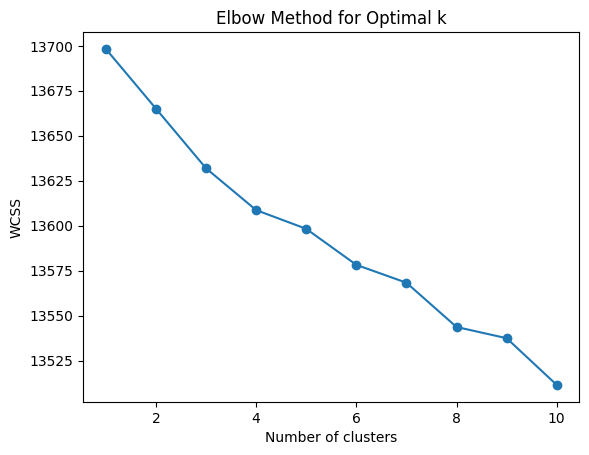

In [ ]:
#Importing necessary libraries.
from sklearn.cluster import KMeans
from collections import Counter
import matplotlib.pyplot as plt

#Determining optimum value of k using elbow method.
from sklearn.cluster import KMeans
list1=[]
for i in range(1,11):
  kmeans=KMeans(n_clusters=i, random_state=42)
  kmeans.fit(tv_train_features)
  list1.append(kmeans.inertia_) #inertia=WCSS

#Creating a plot.
plt.plot(range(1,11), list1, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

**Bert Algorithm**

In [ ]:
!pip install transformers

The function is created successfully


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Converting documents to features: 100%|██████████| 4000/4000 [00:12<00:00, 320.51it/s]


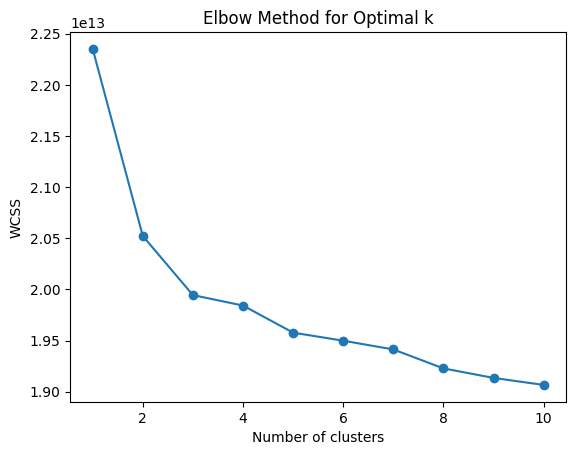

Number of reviews in each cluster:
 Counter({np.int32(0): 7772, np.int32(1): 6228})


In [ ]:
#Importing necessary libraries
import transformers
from tensorflow.keras.preprocessing import sequence
from sklearn.cluster import KMeans
from collections import Counter
import matplotlib.pyplot as plt
import tqdm

# Creating a function for tokenization
def func_tokenizer(tokenizer, docs):
    features = []
    for doc in tqdm.tqdm(docs, desc="Converting documents to features"):
        tokens = tokenizer.tokenize(doc)
        ids = tokenizer.convert_tokens_to_ids(tokens)
        features.append(ids)
    return features

print("The function is created successfully")

#Initializing a Bert Tokenizer.
bert_tokenizer = transformers.BertTokenizer.from_pretrained('bert-base-uncased')

#Calling the function to tokenize the data.
bert_trg_features = func_tokenizer(bert_tokenizer, reviews_trg)
bert_test_features = func_tokenizer(bert_tokenizer, reviews_test)

#Converting to a sequence.
bert_trg = sequence.pad_sequences(bert_trg_features, maxlen=500)
bert_test = sequence.pad_sequences(bert_test_features, maxlen=500)

#Determining optimum value of k using elbow method.
from sklearn.cluster import KMeans
list1=[]
for i in range(1,11):
  kmeans=KMeans(n_clusters=i, random_state=42)
  kmeans.fit(bert_trg)
  list1.append(kmeans.inertia_)

#Creating a plot.
plt.plot(range(1,11), list1, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

#Doing k-means clustering for optimum value of k.
kmeans = KMeans(n_clusters=2, max_iter=100, random_state=42).fit(bert_trg)

#Displaying number of movies in each cluster.
print("Number of reviews in each cluster:\n", Counter(kmeans.labels_))

**"Clustering Customer Reviews Using Transformer-based Tokenizers with K-Mean (GPT-2, RoBERTa, XLM, DistilBERT)"**

In [ ]:
!pip install sacremoses

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.5/897.5 kB 11.7 MB/s eta 0:00:00



==================== Processing gpt2 ====================


tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

Converting documents to features: 100%|██████████| 4000/4000 [00:07<00:00, 565.10it/s]


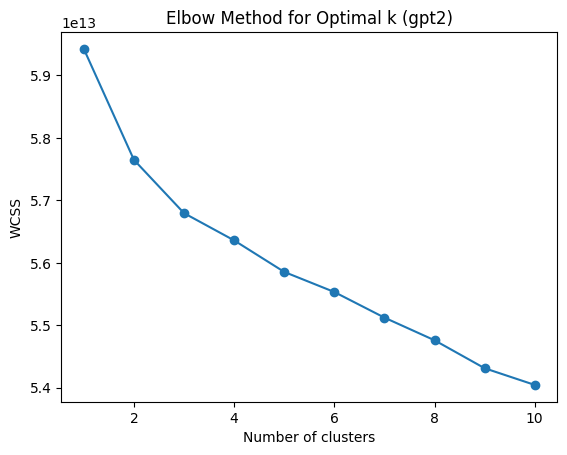

Number of reviews in each cluster for gpt2:
 Counter({np.int32(0): 8087, np.int32(1): 5913})

==================== Processing roberta-base ====================


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

Converting documents to features: 100%|██████████| 4000/4000 [00:02<00:00, 1916.55it/s]


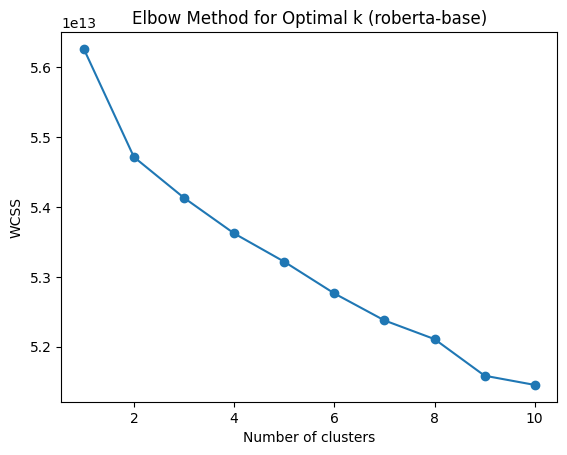

Number of reviews in each cluster for roberta-base:
 Counter({np.int32(0): 9217, np.int32(1): 4783})

==================== Processing xlm-mlm-en-2048 ====================


tokenizer_config.json:   0%|          | 0.00/65.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/646k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/487k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/840 [00:00<?, ?B/s]

Converting documents to features: 100%|██████████| 4000/4000 [00:09<00:00, 439.85it/s]


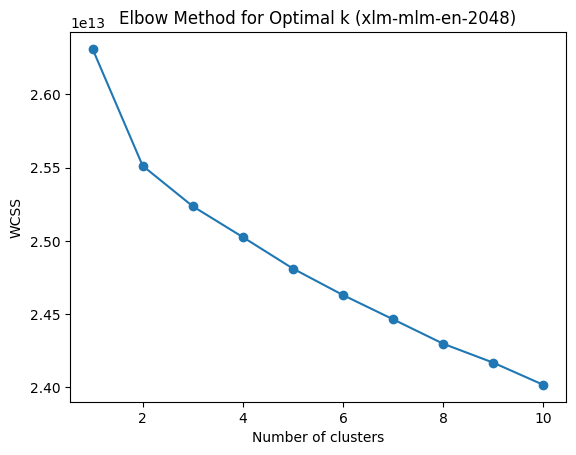

Number of reviews in each cluster for xlm-mlm-en-2048:
 Counter({np.int32(1): 8007, np.int32(0): 5993})

==================== Processing distilbert-base-uncased ====================


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

Converting documents to features: 100%|██████████| 4000/4000 [00:06<00:00, 640.00it/s]


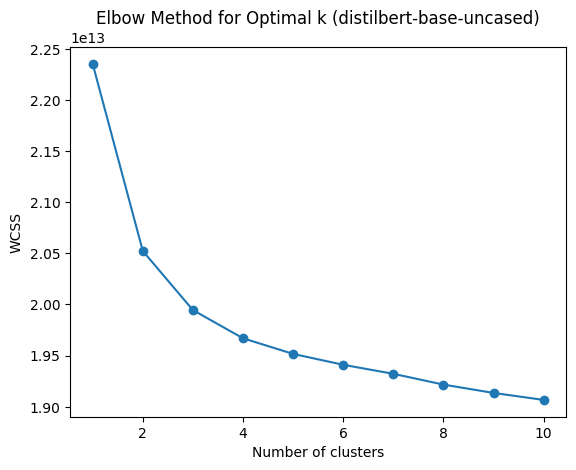

Number of reviews in each cluster for distilbert-base-uncased:
 Counter({np.int32(0): 7772, np.int32(1): 6228})


In [ ]:
# ==============================
# IMPORT LIBRARIES
# ==============================
import transformers
from tensorflow.keras.preprocessing import sequence
from sklearn.cluster import KMeans
from collections import Counter
import matplotlib.pyplot as plt
import tqdm

# ==============================
# TOKENIZATION FUNCTION
# ==============================
def func_tokenizer(tokenizer, docs):
    features = []
    for doc in tqdm.tqdm(docs, desc="Converting documents to features"):
        tokens = tokenizer.tokenize(doc)
        ids = tokenizer.convert_tokens_to_ids(tokens)
        features.append(ids)
    return features

# ==============================
# CLUSTERING FUNCTION
# ==============================
def perform_kmeans_clustering(model_name, tokenizer_class, reviews_trg, reviews_test, maxlen=500, k_range=10, optimal_k=2):
    print(f"\n{'='*20} Processing {model_name} {'='*20}")

    # Load the tokenizer
    tokenizer = tokenizer_class.from_pretrained(model_name)

    # Tokenize
    trg_features = func_tokenizer(tokenizer, reviews_trg)
    test_features = func_tokenizer(tokenizer, reviews_test)

    # Pad sequences
    trg_padded = sequence.pad_sequences(trg_features, maxlen=maxlen)
    test_padded = sequence.pad_sequences(test_features, maxlen=maxlen)

    # Determine optimum k using elbow method
    inertia_list = []
    for i in range(1, k_range + 1):
        kmeans = KMeans(n_clusters=i, random_state=42, n_init=10)
        kmeans.fit(trg_padded)
        inertia_list.append(kmeans.inertia_)

    # Plot elbow graph
    plt.plot(range(1, k_range + 1), inertia_list, marker='o')
    plt.title(f'Elbow Method for Optimal k ({model_name})')
    plt.xlabel('Number of clusters')
    plt.ylabel('WCSS')
    plt.show()

    # Perform KMeans clustering with chosen k
    kmeans = KMeans(n_clusters=optimal_k, max_iter=100, random_state=42, n_init=10).fit(trg_padded)

    # Display cluster sizes
    print(f"Number of reviews in each cluster for {model_name}:\n", Counter(kmeans.labels_))

# ==============================
# EXECUTE FOR MULTIPLE MODELS
# ==============================
# Ensure reviews_trg and reviews_test are defined from your previous preprocessing steps.

# GPT-2
perform_kmeans_clustering('gpt2', transformers.GPT2Tokenizer, reviews_trg, reviews_test)

# RoBERTa
perform_kmeans_clustering('roberta-base', transformers.RobertaTokenizer, reviews_trg, reviews_test)

# XLM
perform_kmeans_clustering('xlm-mlm-en-2048', transformers.XLMTokenizer, reviews_trg, reviews_test)

# DistilBERT
perform_kmeans_clustering('distilbert-base-uncased', transformers.DistilBertTokenizer, reviews_trg, reviews_test)


**"Document Clustering using Tokenizers from T5, XLNet, and OpenAI GPT with K-Means"**


==================== Processing t5-base ====================


spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.39M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.21k [00:00<?, ?B/s]

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
Converting documents to features: 100%|██████████| 4000/4000 [00:03<00:00, 1067.23it/s]


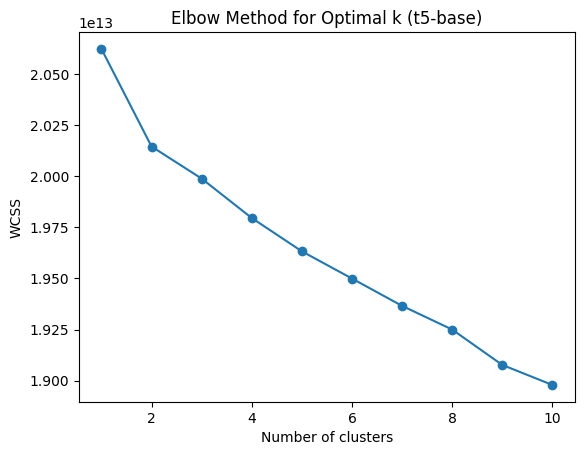

Number of reviews in each cluster for t5-base:
 Counter({np.int32(0): 8225, np.int32(1): 5775})

==================== Processing xlnet-base-cased ====================


spiece.model:   0%|          | 0.00/798k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.38M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/760 [00:00<?, ?B/s]

Converting documents to features: 100%|██████████| 4000/4000 [00:01<00:00, 2865.78it/s]


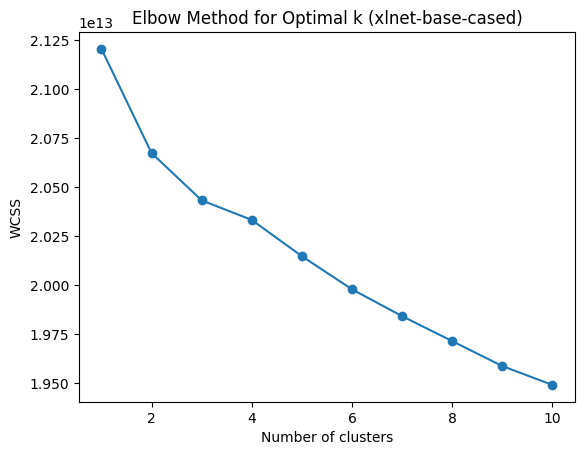

Number of reviews in each cluster for xlnet-base-cased:
 Counter({np.int32(0): 8156, np.int32(1): 5844})

==================== Processing openai-gpt ====================


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/816k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/458k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.27M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/656 [00:00<?, ?B/s]

ftfy or spacy is not installed using BERT BasicTokenizer instead of SpaCy & ftfy.
Converting documents to features: 100%|██████████| 4000/4000 [00:05<00:00, 712.37it/s]


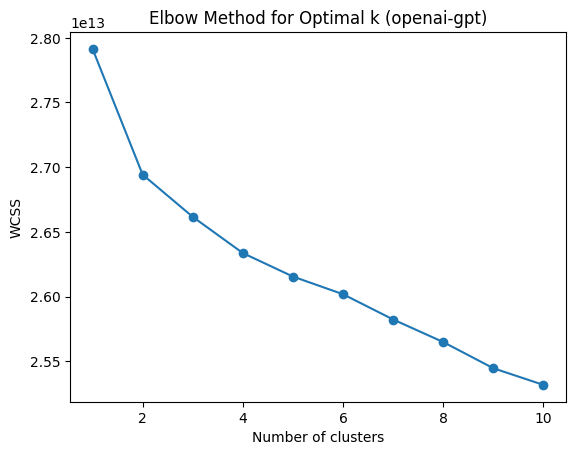

Number of reviews in each cluster for openai-gpt:
 Counter({np.int32(1): 8022, np.int32(0): 5978})


In [ ]:
# ==============================
# IMPORT LIBRARIES
# ==============================
import transformers
from tensorflow.keras.preprocessing import sequence
from sklearn.cluster import KMeans
from collections import Counter
import matplotlib.pyplot as plt
import tqdm

# ==============================
# TOKENIZATION FUNCTION
# ==============================
def func_tokenizer(tokenizer, docs):
    features = []
    for doc in tqdm.tqdm(docs, desc="Converting documents to features"):
        tokens = tokenizer.tokenize(doc)
        ids = tokenizer.convert_tokens_to_ids(tokens)
        features.append(ids)
    return features

# ==============================
# CLUSTERING FUNCTION
# ==============================
def perform_kmeans_clustering(model_name, tokenizer_class, reviews_trg, reviews_test, maxlen=500, k_range=10, optimal_k=2):
    print(f"\n{'='*20} Processing {model_name} {'='*20}")

    # Load tokenizer
    tokenizer = tokenizer_class.from_pretrained(model_name)

    # Tokenize
    trg_features = func_tokenizer(tokenizer, reviews_trg)
    test_features = func_tokenizer(tokenizer, reviews_test)

    # Pad sequences
    trg_padded = sequence.pad_sequences(trg_features, maxlen=maxlen)
    test_padded = sequence.pad_sequences(test_features, maxlen=maxlen)

    # Determine optimum k using elbow method
    inertia_list = []
    for i in range(1, k_range + 1):
        kmeans = KMeans(n_clusters=i, random_state=42, n_init=10)
        kmeans.fit(trg_padded)
        inertia_list.append(kmeans.inertia_)

    # Plot elbow graph
    plt.plot(range(1, k_range + 1), inertia_list, marker='o')
    plt.title(f'Elbow Method for Optimal k ({model_name})')
    plt.xlabel('Number of clusters')
    plt.ylabel('WCSS')
    plt.show()

    # Perform KMeans clustering with chosen k
    kmeans = KMeans(n_clusters=optimal_k, max_iter=100, random_state=42, n_init=10).fit(trg_padded)

    # Display cluster sizes
    print(f"Number of reviews in each cluster for {model_name}:\n", Counter(kmeans.labels_))

# ==============================
# EXECUTE FOR MULTIPLE MODELS
# ==============================
# Ensure you already have reviews_trg and reviews_test from your preprocessing.

# T5
perform_kmeans_clustering('t5-base', transformers.T5Tokenizer, reviews_trg, reviews_test)

# XLNet
perform_kmeans_clustering('xlnet-base-cased', transformers.XLNetTokenizer, reviews_trg, reviews_test)

# OpenAI GPT (GPT-1)
perform_kmeans_clustering('openai-gpt', transformers.OpenAIGPTTokenizer, reviews_trg, reviews_test)

**"Comprehensive Multi-Model & Multi-Clustering Pipeline with Visualization for Customer Review Analysis"**

Uses multiple transformer-based tokenizers (BERT, GPT-2, RoBERTa, XLNet, etc.),

Applies various clustering algorithms (KMeans, MiniBatchKMeans, Agglomerative, Spectral, DBSCAN), and

Provides dimensionality reduction (PCA, t-SNE) visualizations for analysis.

Using 5000 reviews for clustering.

Processing: bert-base-uncased


Tokenizing: 100%|██████████| 5000/5000 [00:07<00:00, 702.86it/s]


Padded feature shape for bert-base-uncased: (5000, 128)


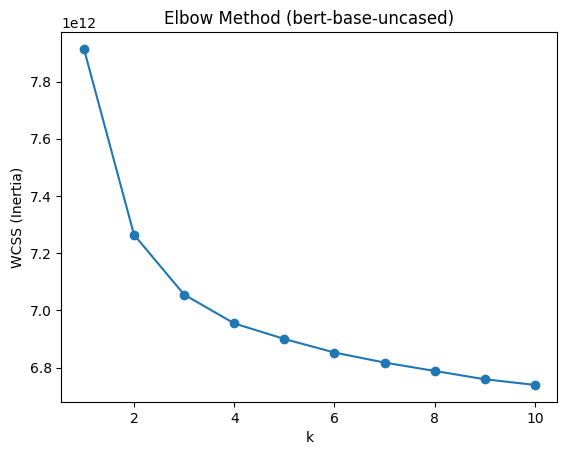

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


bert-base-uncased — KMeans cluster sizes: Counter({np.int32(1): 2876, np.int32(0): 2124})
bert-base-uncased — MiniBatchKMeans cluster sizes: Counter({np.int32(1): 2555, np.int32(0): 2445})
bert-base-uncased — Agglomerative cluster sizes: Counter({np.int64(0): 3402, np.int64(1): 1598})
bert-base-uncased — Spectral cluster sizes: Counter({np.int32(0): 4439, np.int32(1): 561})
bert-base-uncased — DBSCAN cluster sizes: Counter({np.int64(-1): 5000})


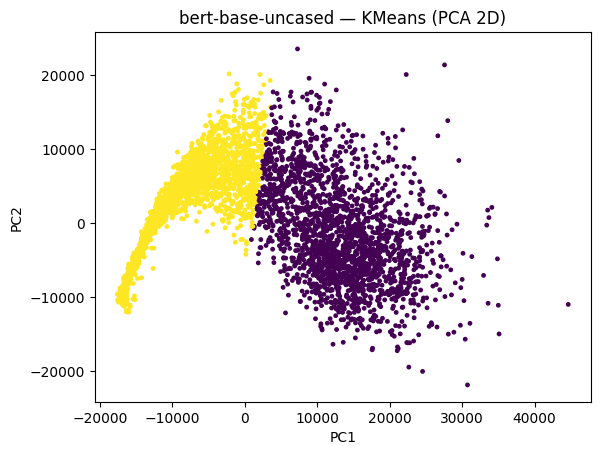

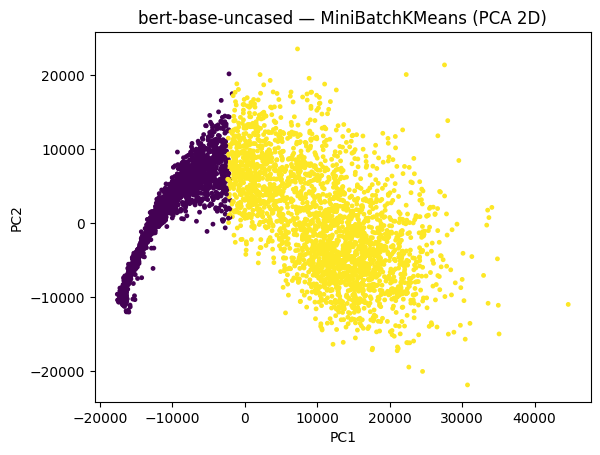

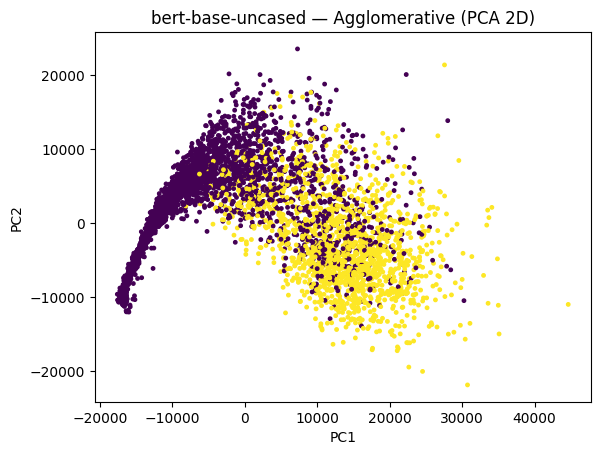

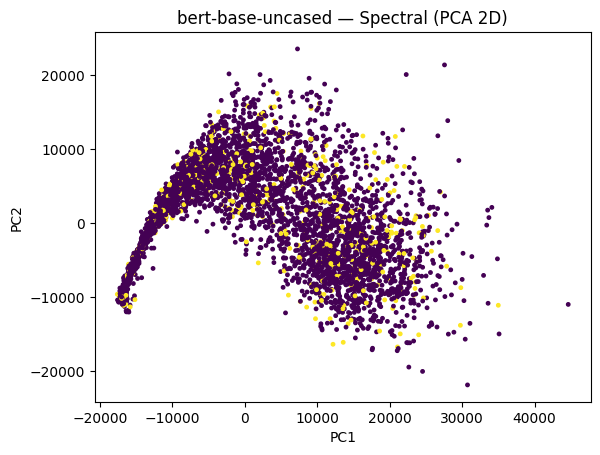

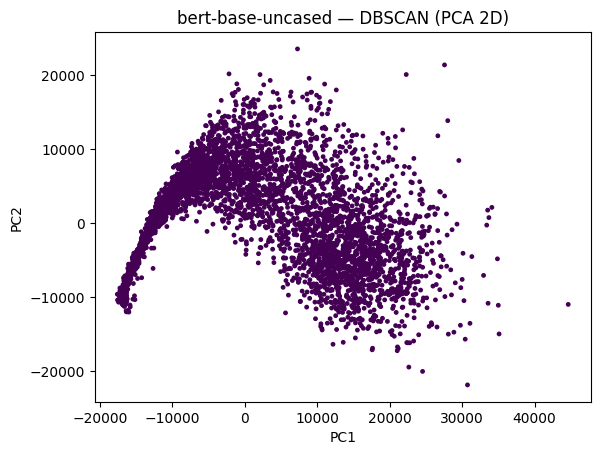

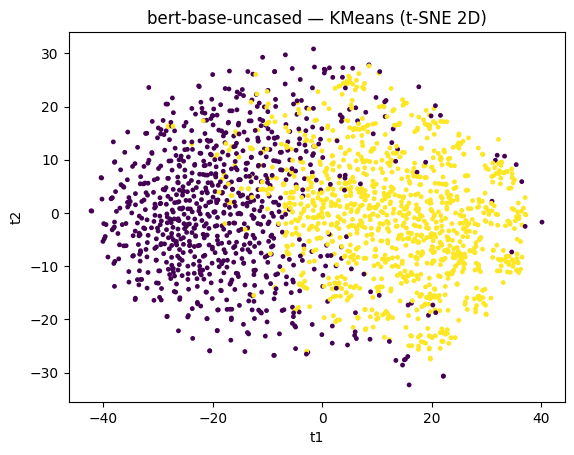

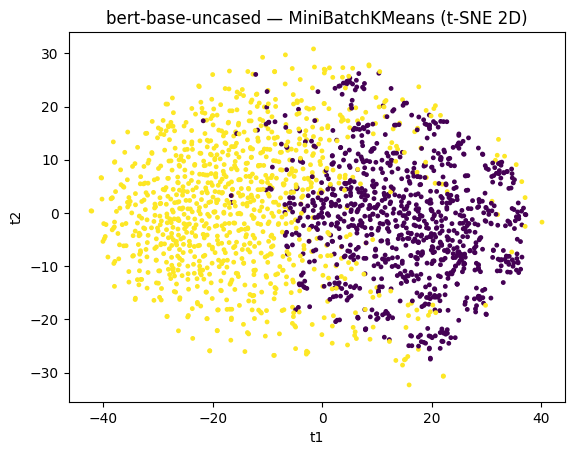

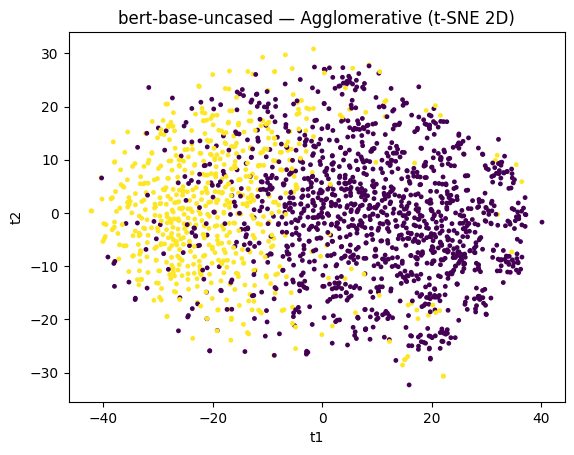

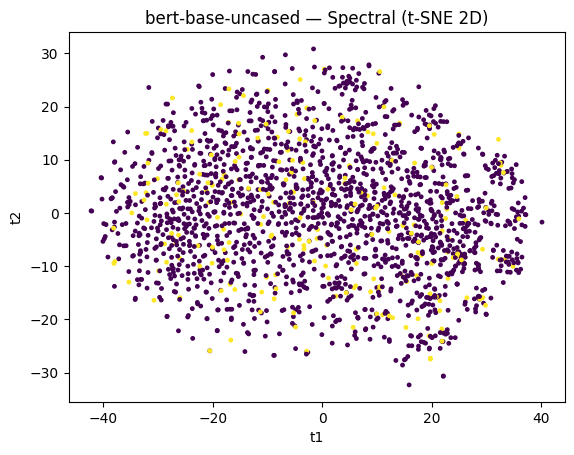

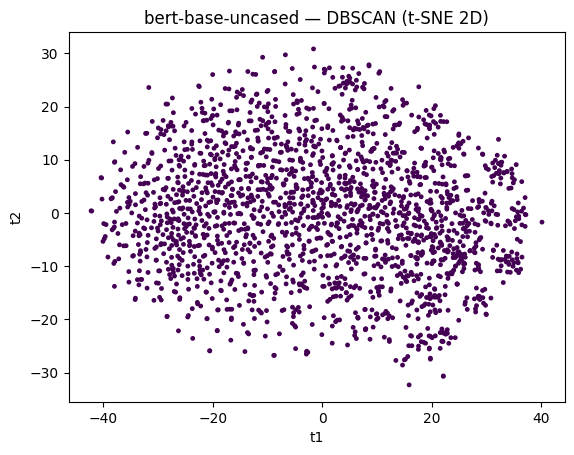


Processing: gpt2


Tokenizing: 100%|██████████| 5000/5000 [00:04<00:00, 1130.64it/s]


Padded feature shape for gpt2: (5000, 128)


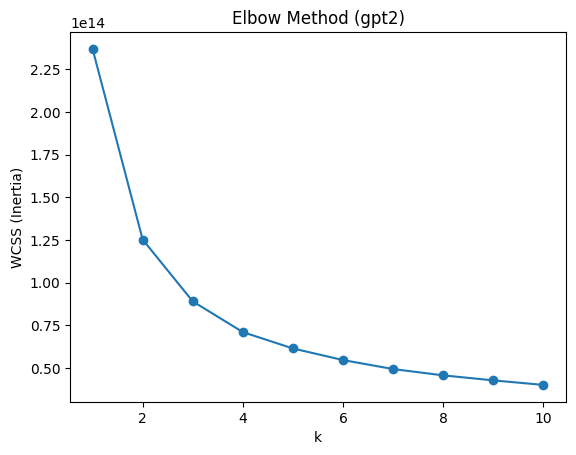

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


gpt2 — KMeans cluster sizes: Counter({np.int32(0): 2782, np.int32(1): 2218})
gpt2 — MiniBatchKMeans cluster sizes: Counter({np.int32(1): 2856, np.int32(0): 2144})
gpt2 — Agglomerative cluster sizes: Counter({np.int64(0): 2710, np.int64(1): 2290})
gpt2 — Spectral cluster sizes: Counter({np.int32(0): 4688, np.int32(1): 312})
gpt2 — DBSCAN cluster sizes: Counter({np.int64(-1): 5000})


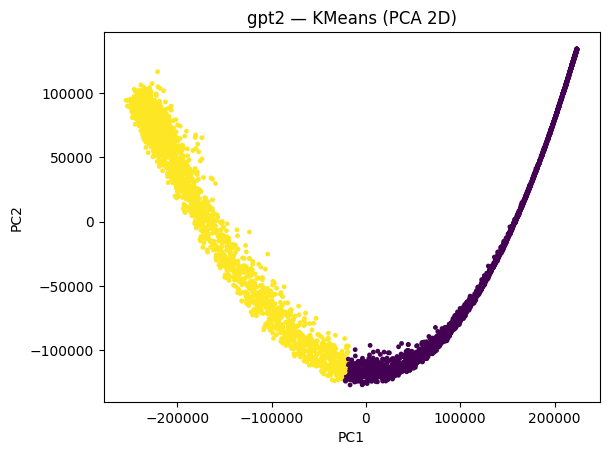

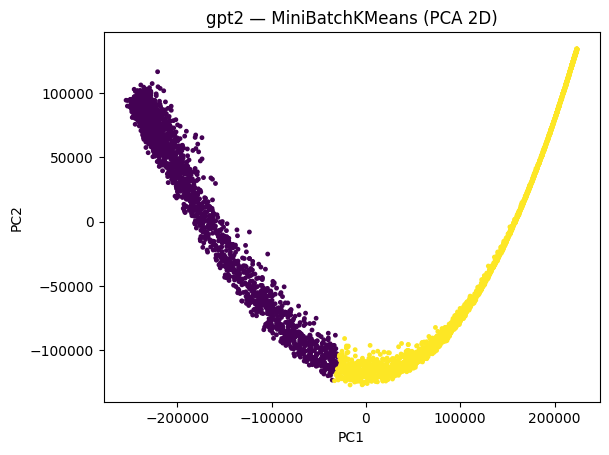

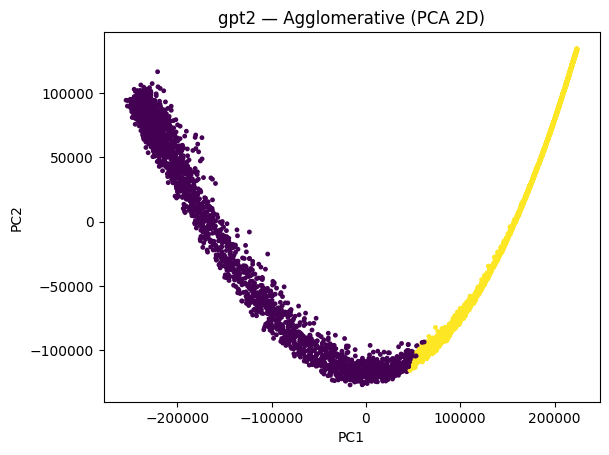

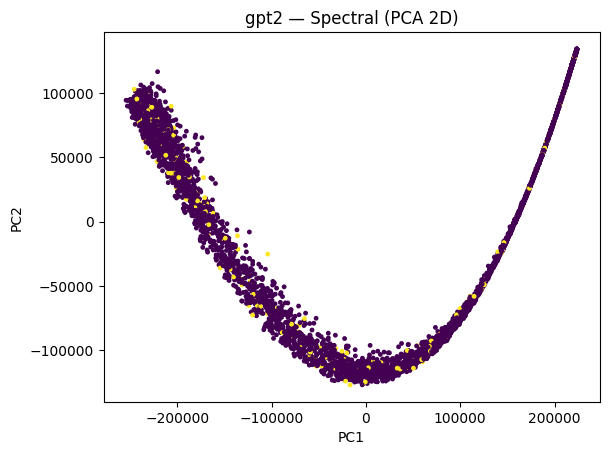

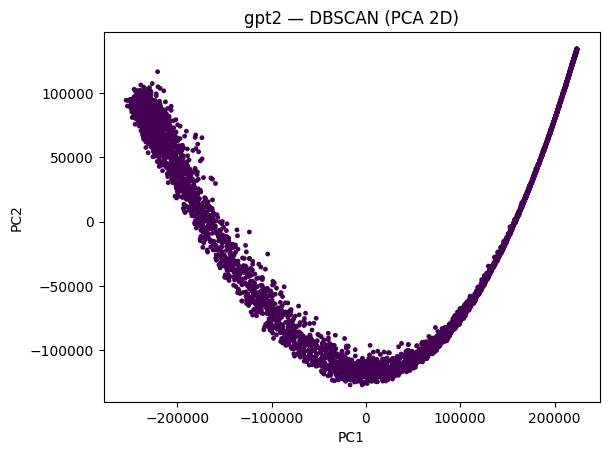

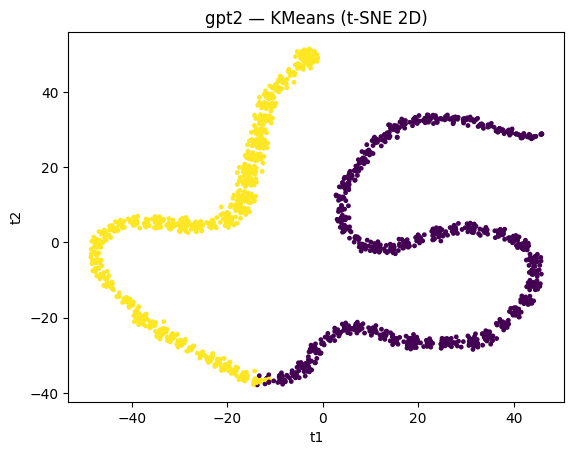

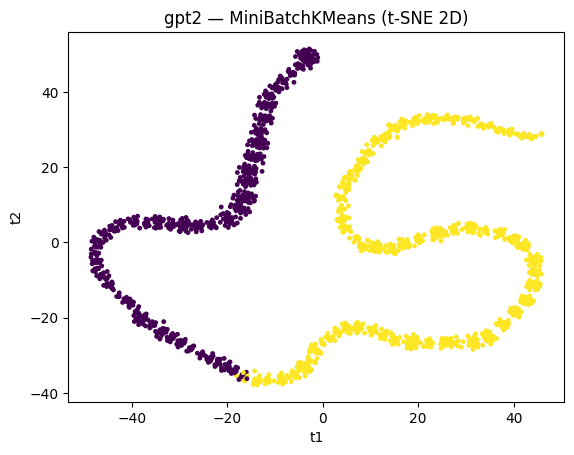

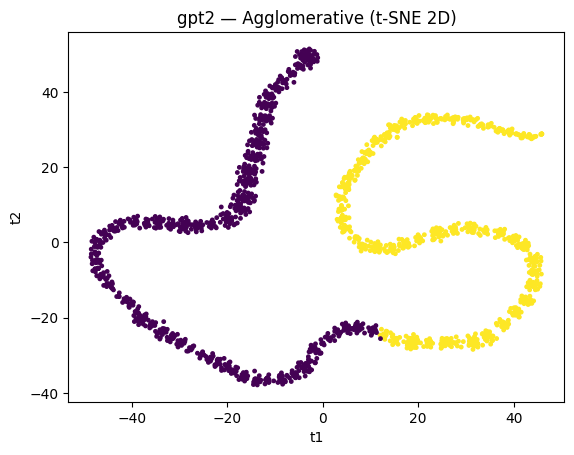

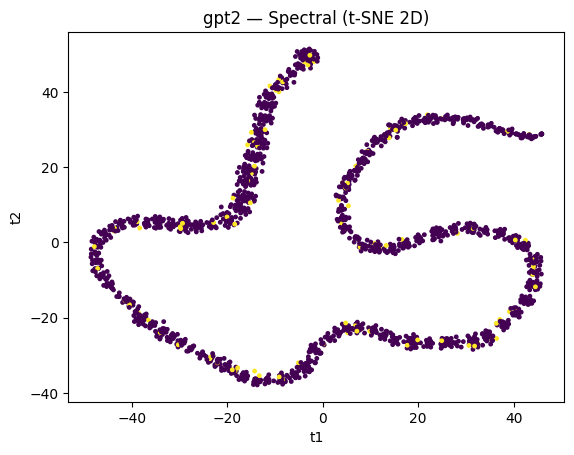

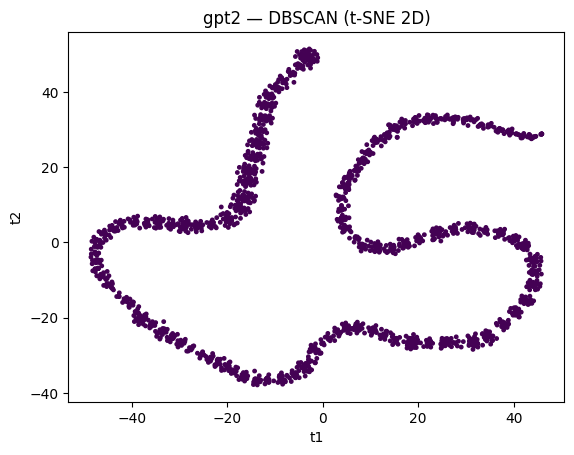


Processing: roberta-base


Tokenizing: 100%|██████████| 5000/5000 [00:03<00:00, 1417.81it/s]


Padded feature shape for roberta-base: (5000, 128)


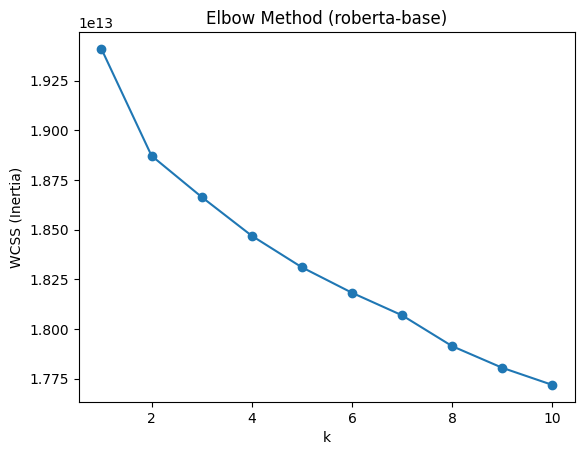

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


roberta-base — KMeans cluster sizes: Counter({np.int32(0): 3291, np.int32(1): 1709})
roberta-base — MiniBatchKMeans cluster sizes: Counter({np.int32(0): 4989, np.int32(1): 11})
roberta-base — Agglomerative cluster sizes: Counter({np.int64(0): 3860, np.int64(1): 1140})
roberta-base — Spectral cluster sizes: Counter({np.int32(0): 4943, np.int32(1): 57})
roberta-base — DBSCAN cluster sizes: Counter({np.int64(-1): 5000})


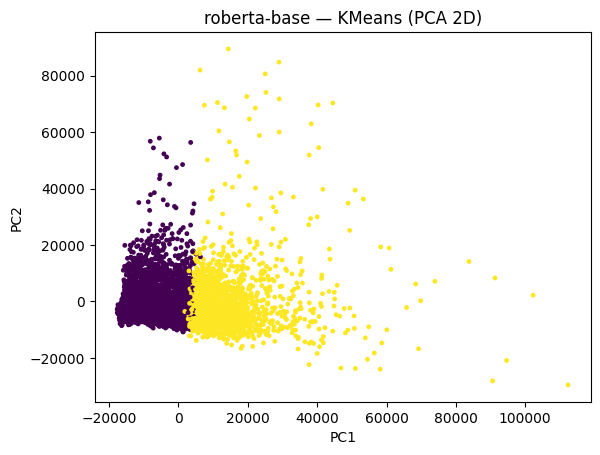

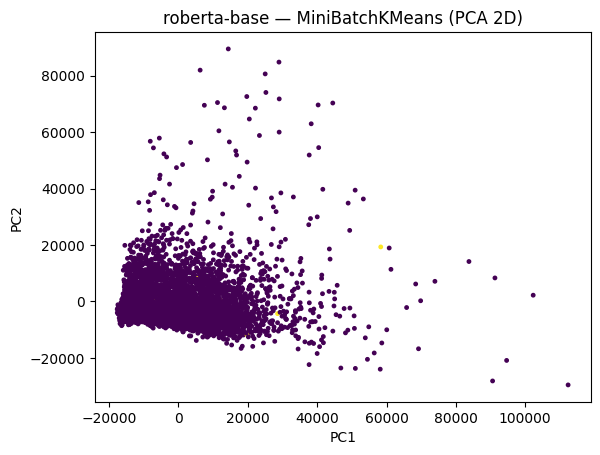

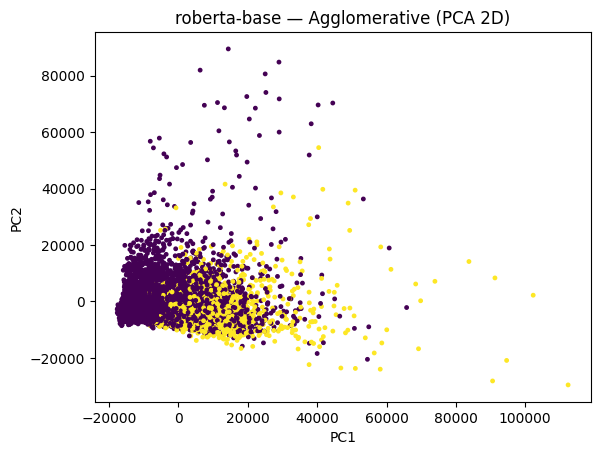

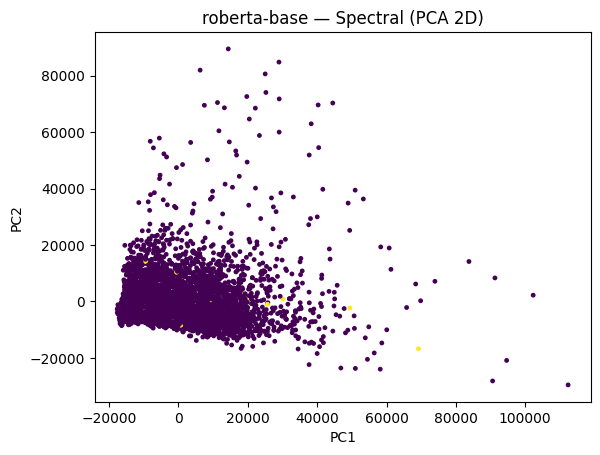

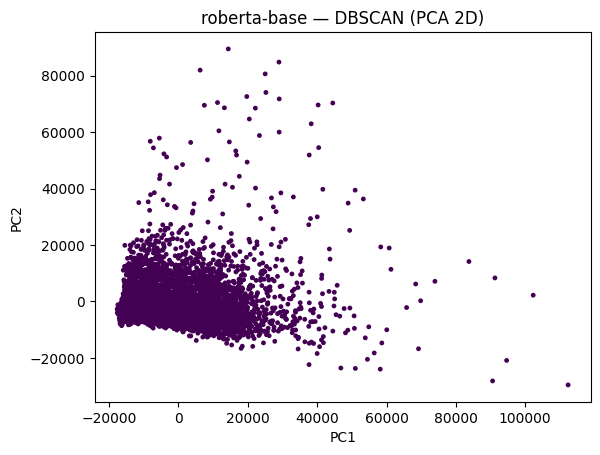

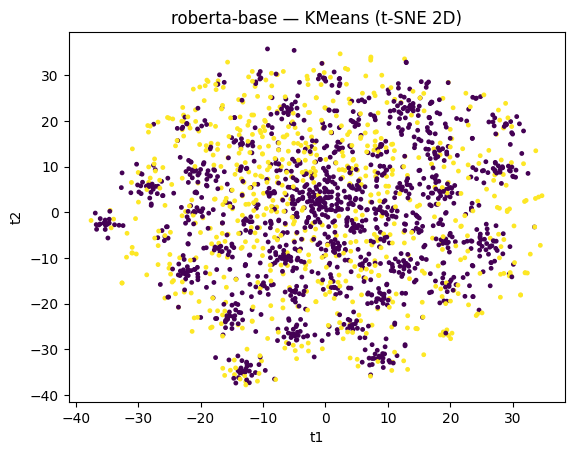

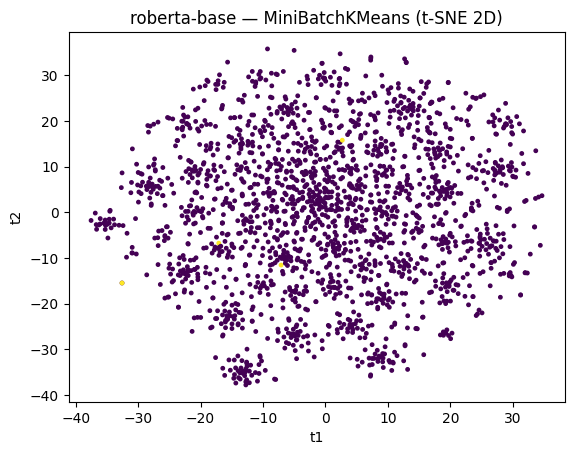

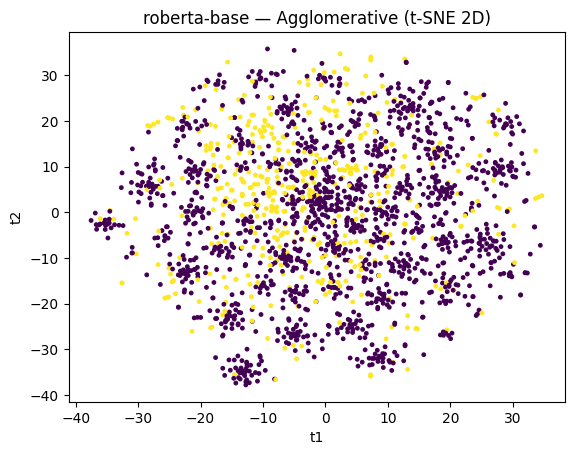

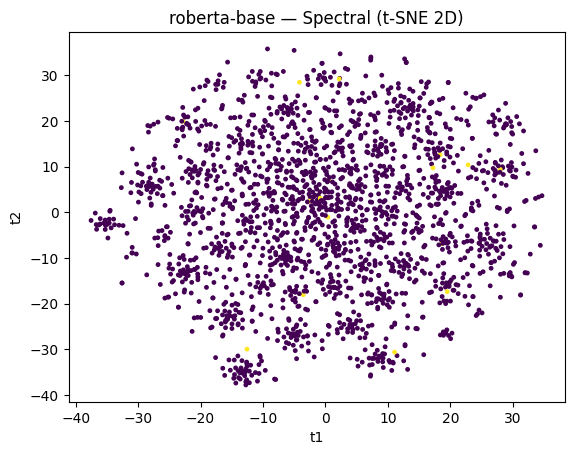

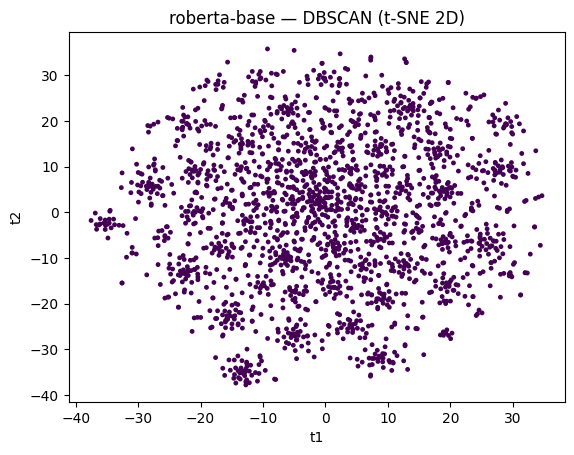


Processing: xlm-mlm-en-2048


Tokenizing: 100%|██████████| 5000/5000 [00:16<00:00, 300.35it/s]


Padded feature shape for xlm-mlm-en-2048: (5000, 128)


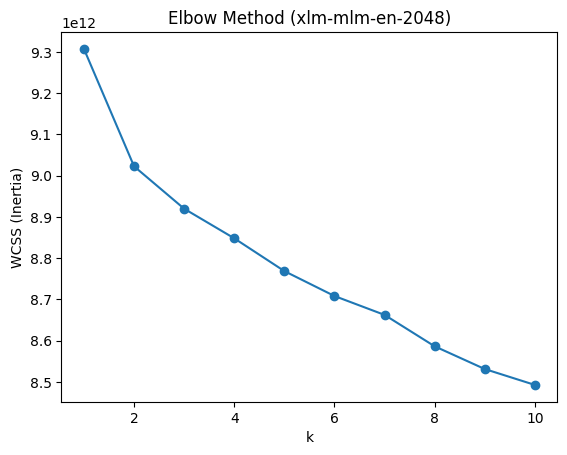

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


xlm-mlm-en-2048 — KMeans cluster sizes: Counter({np.int32(0): 2913, np.int32(1): 2087})
xlm-mlm-en-2048 — MiniBatchKMeans cluster sizes: Counter({np.int32(1): 4956, np.int32(0): 44})
xlm-mlm-en-2048 — Agglomerative cluster sizes: Counter({np.int64(1): 2958, np.int64(0): 2042})
xlm-mlm-en-2048 — Spectral cluster sizes: Counter({np.int32(0): 4959, np.int32(1): 41})
xlm-mlm-en-2048 — DBSCAN cluster sizes: Counter({np.int64(-1): 5000})


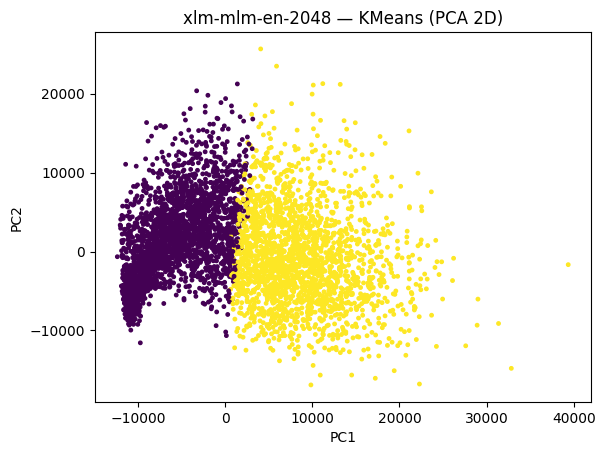

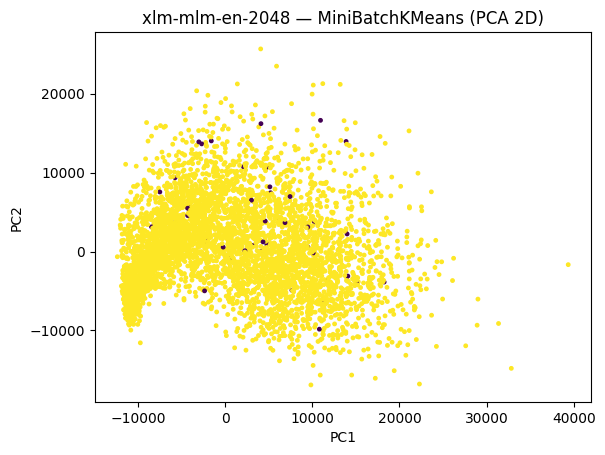

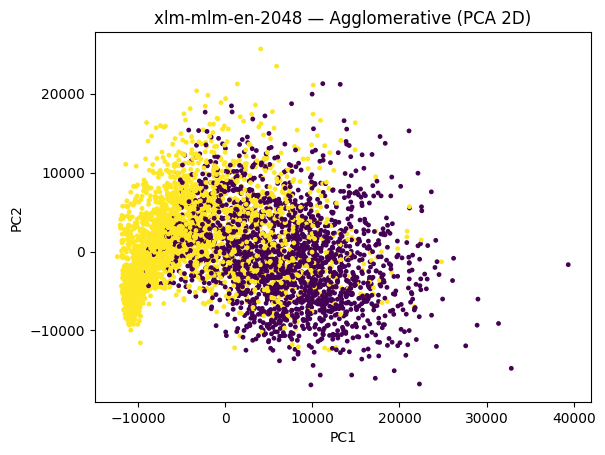

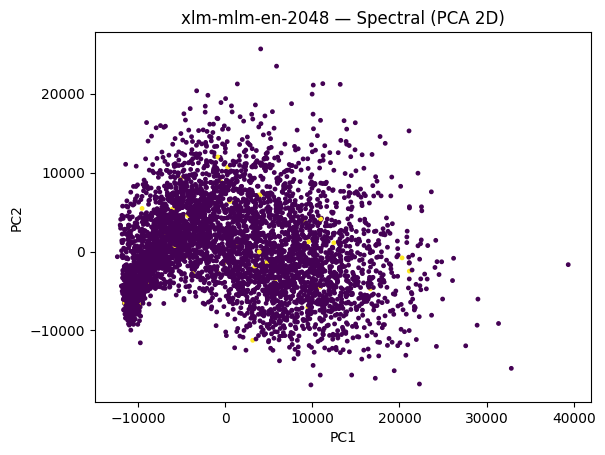

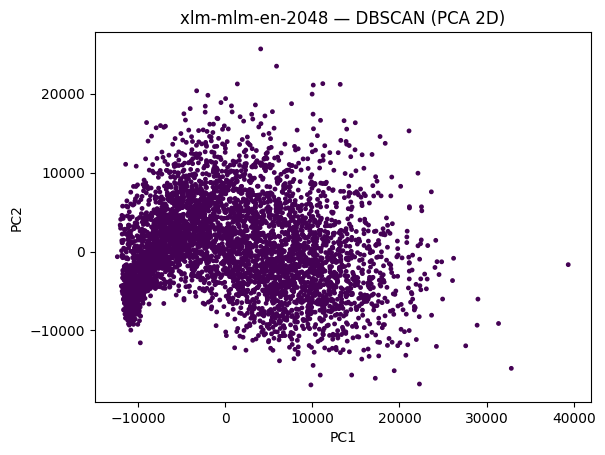

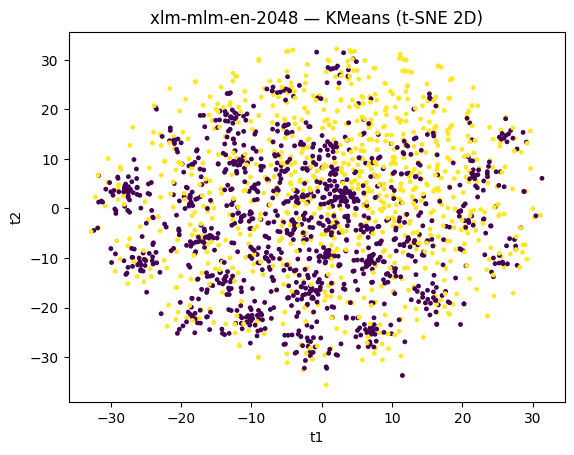

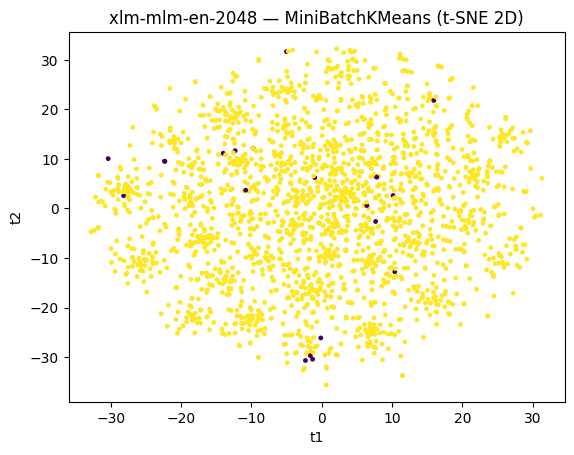

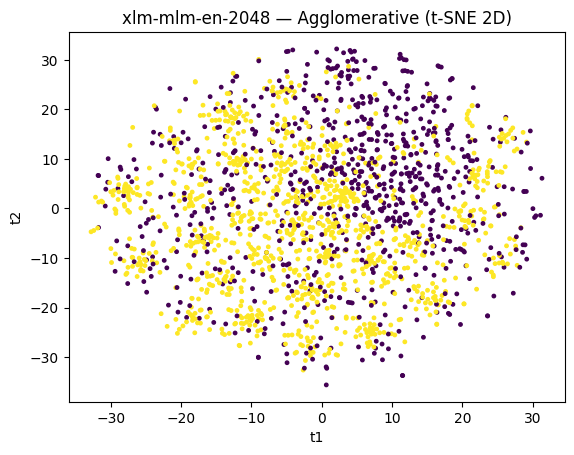

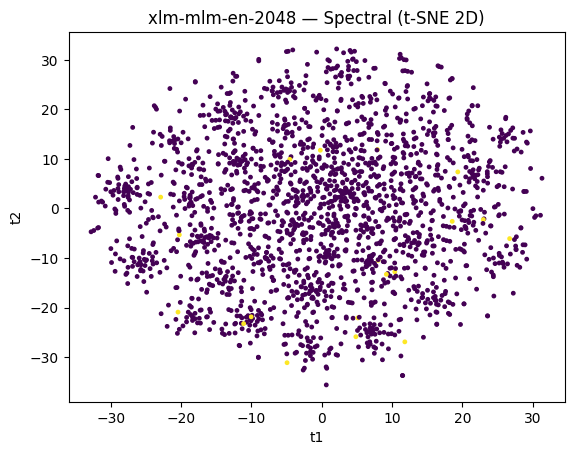

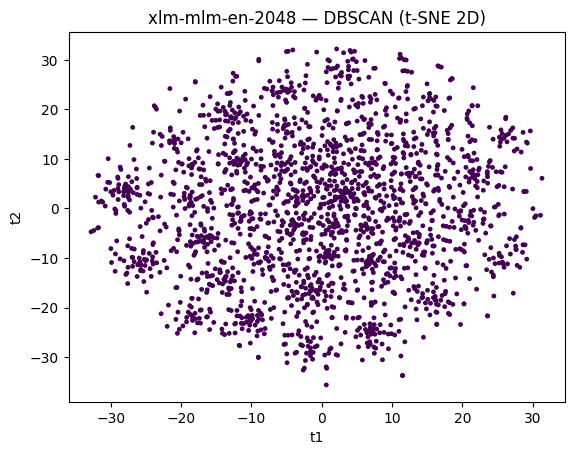


Processing: distilbert-base-uncased


Tokenizing: 100%|██████████| 5000/5000 [00:09<00:00, 509.42it/s]


Padded feature shape for distilbert-base-uncased: (5000, 128)


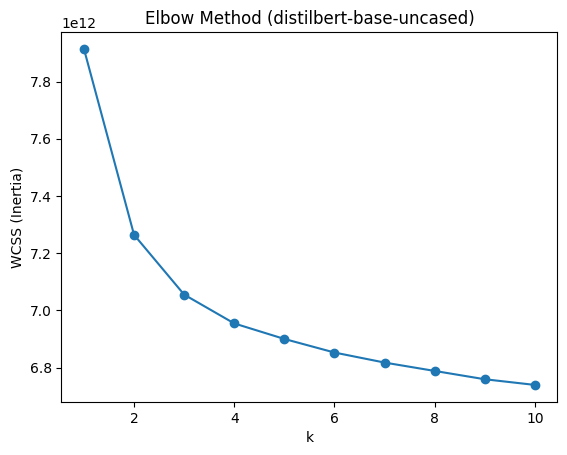

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


distilbert-base-uncased — KMeans cluster sizes: Counter({np.int32(1): 2876, np.int32(0): 2124})
distilbert-base-uncased — MiniBatchKMeans cluster sizes: Counter({np.int32(1): 2555, np.int32(0): 2445})
distilbert-base-uncased — Agglomerative cluster sizes: Counter({np.int64(0): 3402, np.int64(1): 1598})
distilbert-base-uncased — Spectral cluster sizes: Counter({np.int32(0): 4787, np.int32(1): 213})
distilbert-base-uncased — DBSCAN cluster sizes: Counter({np.int64(-1): 5000})


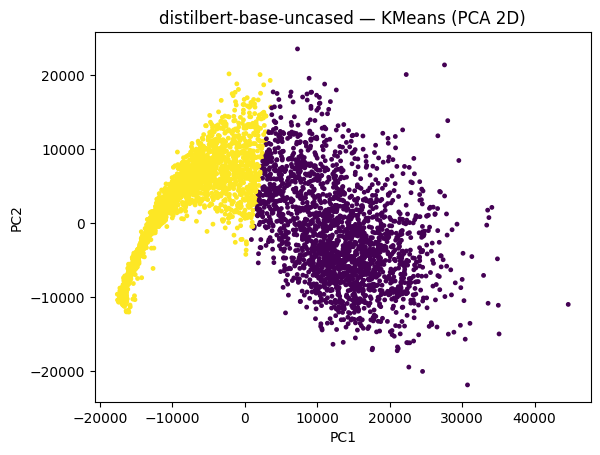

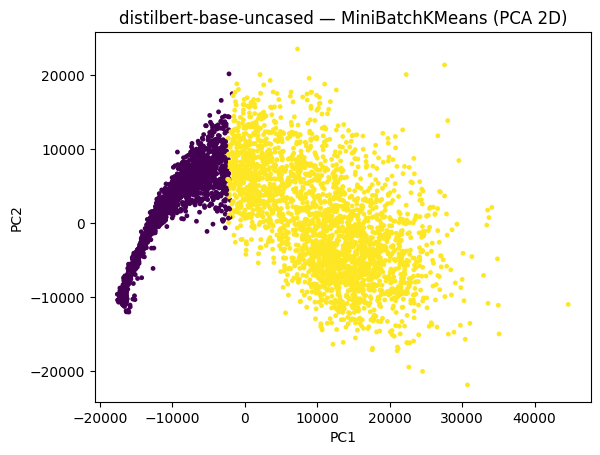

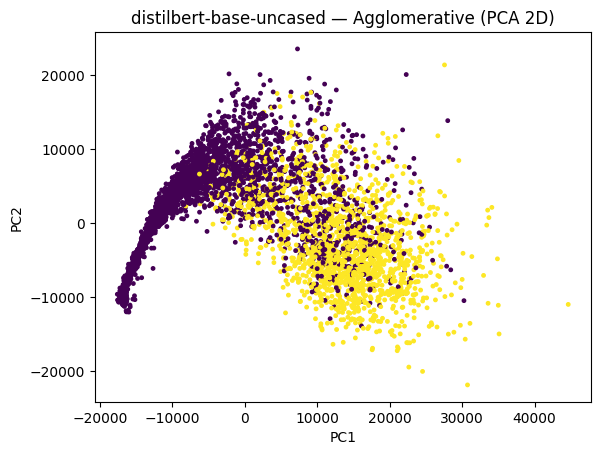

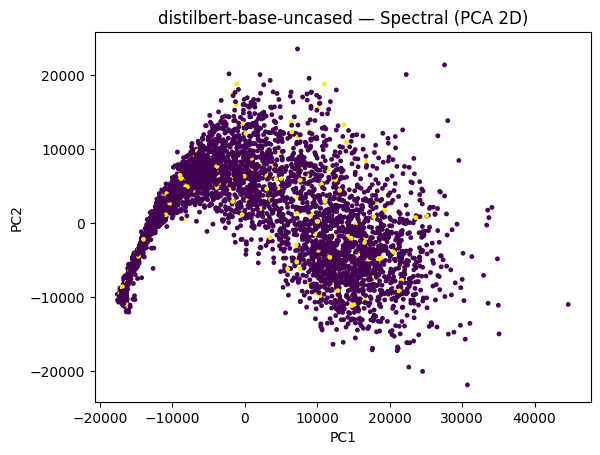

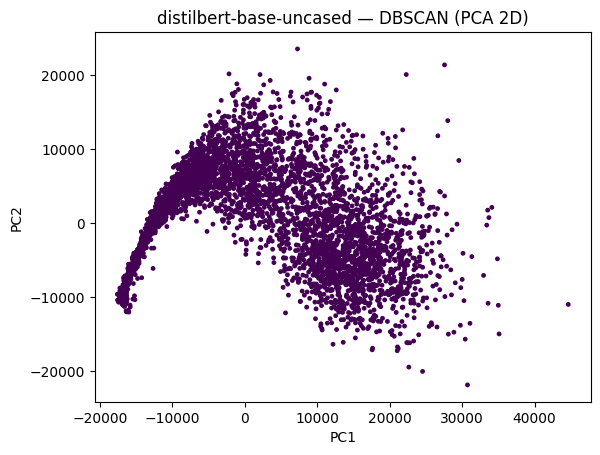

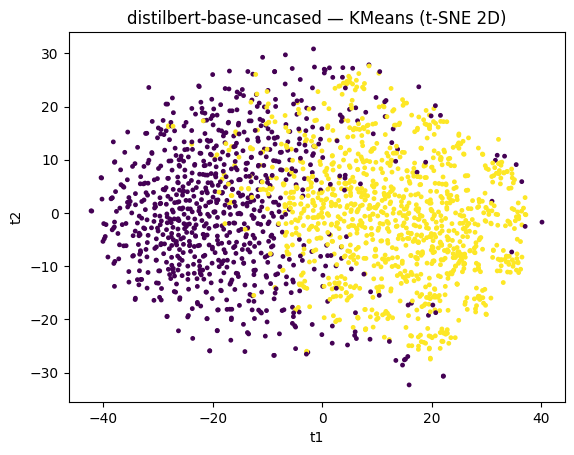

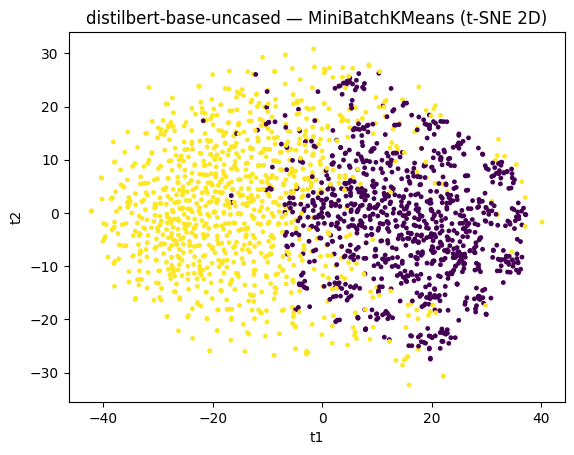

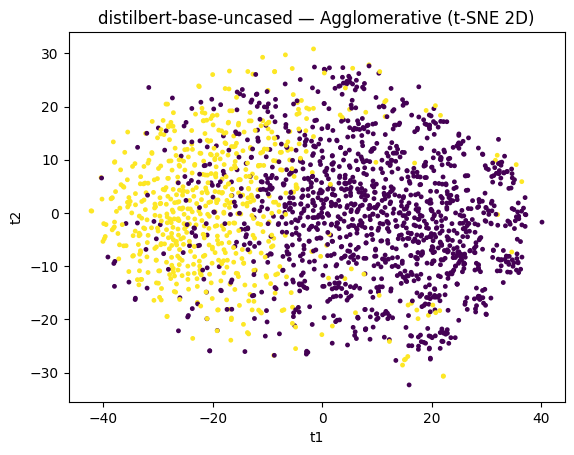

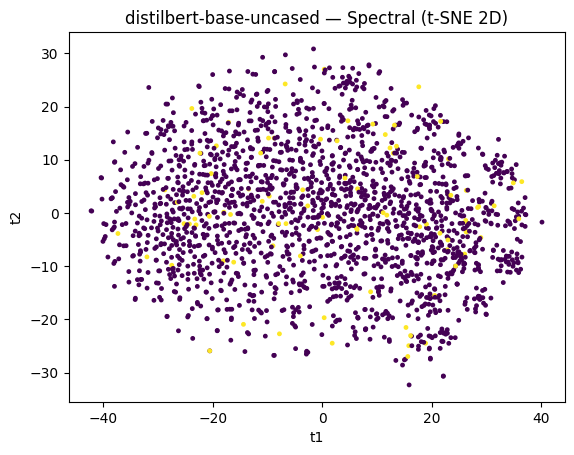

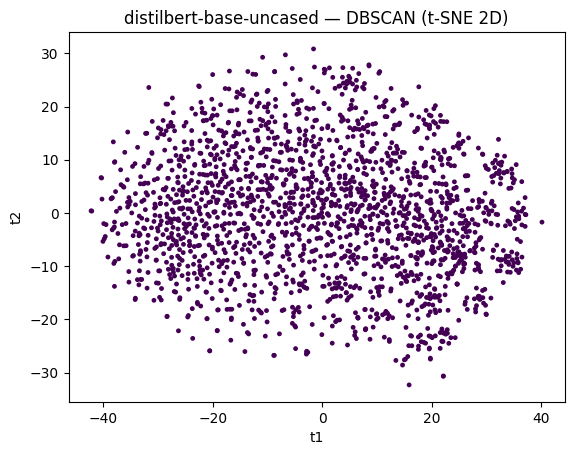


Processing: t5-base


Tokenizing: 100%|██████████| 5000/5000 [00:02<00:00, 1860.38it/s]


Padded feature shape for t5-base: (5000, 128)


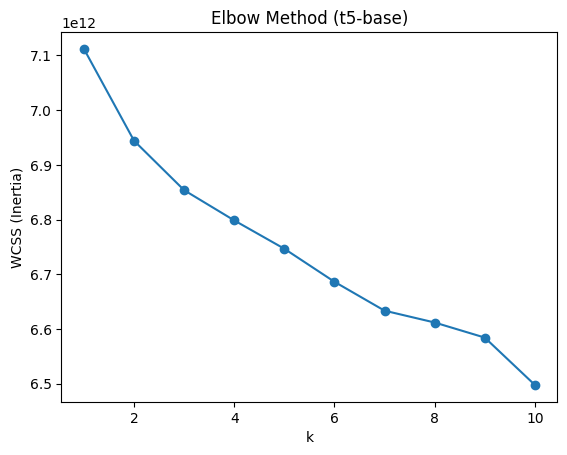

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


t5-base — KMeans cluster sizes: Counter({np.int32(0): 2982, np.int32(1): 2018})
t5-base — MiniBatchKMeans cluster sizes: Counter({np.int32(0): 4952, np.int32(1): 48})
t5-base — Agglomerative cluster sizes: Counter({np.int64(0): 2900, np.int64(1): 2100})
t5-base — Spectral cluster sizes: Counter({np.int32(1): 4737, np.int32(0): 263})
t5-base — DBSCAN cluster sizes: Counter({np.int64(-1): 5000})


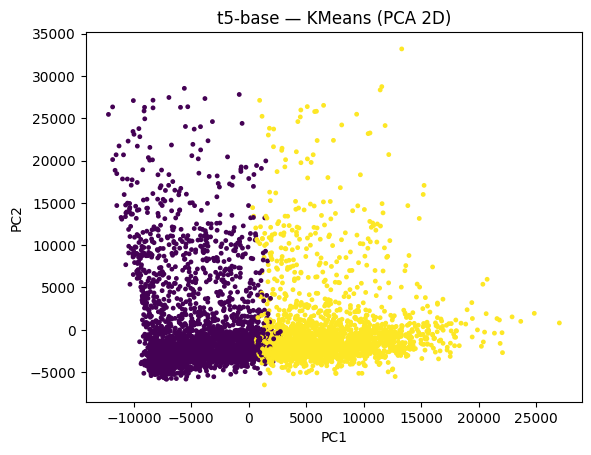

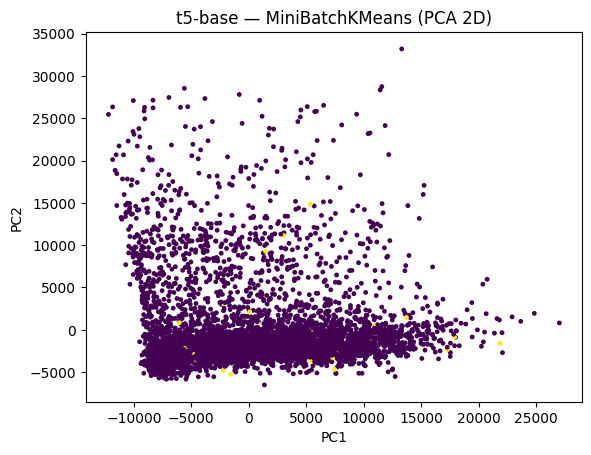

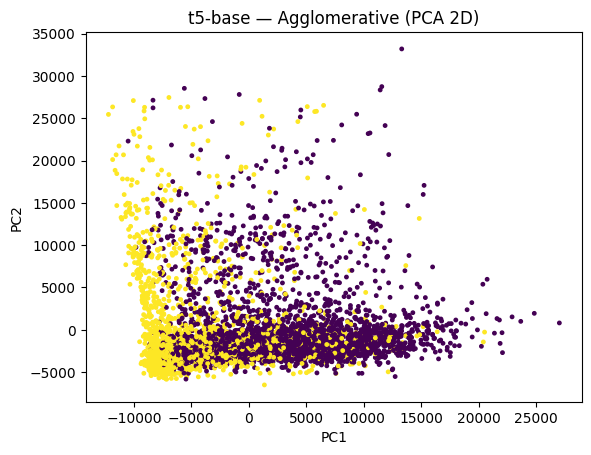

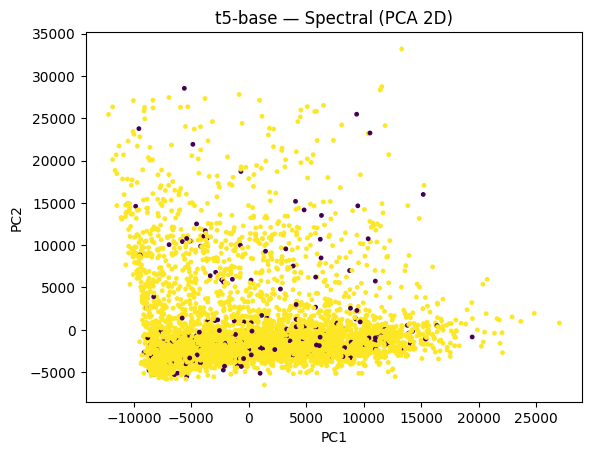

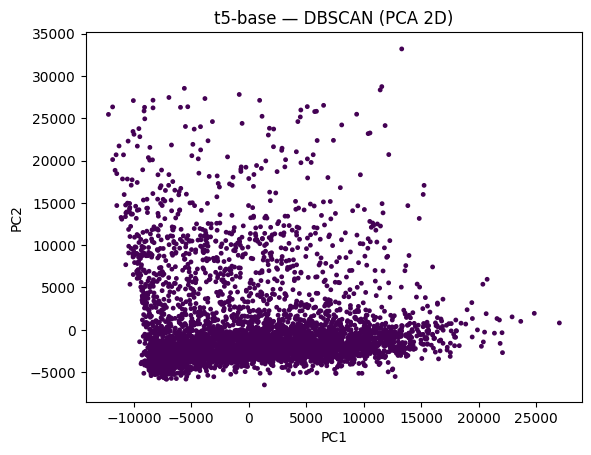

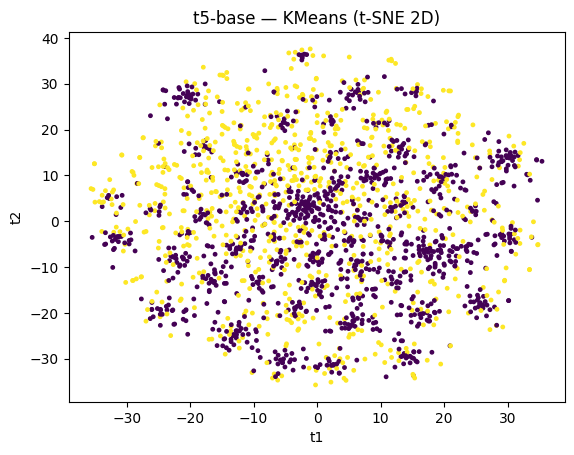

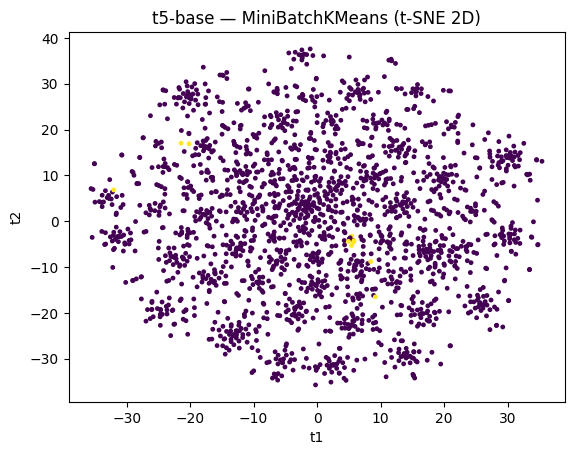

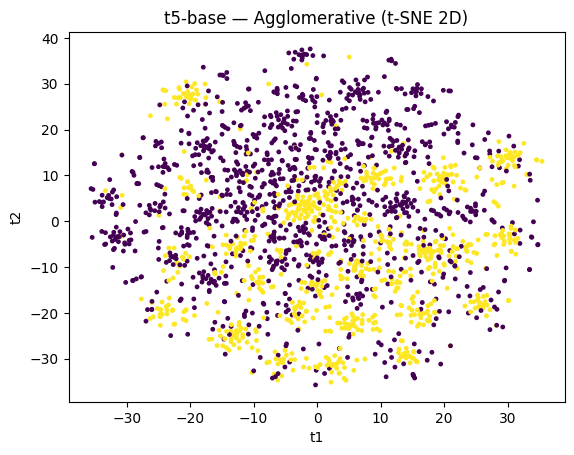

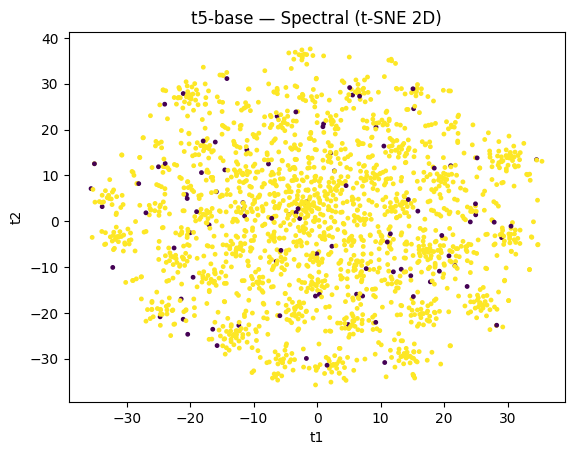

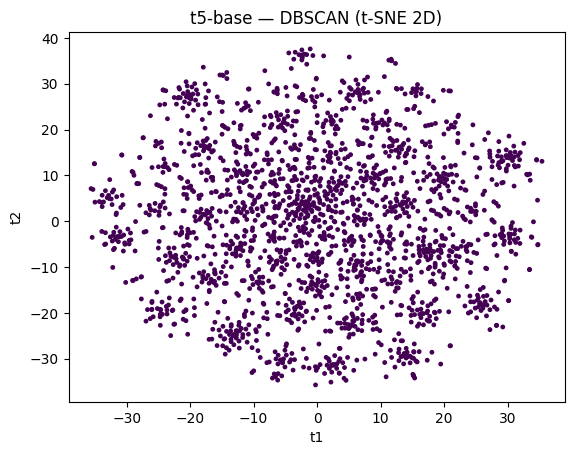


Processing: ctrl


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/4.61M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/2.26M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/635 [00:00<?, ?B/s]

Tokenizing: 100%|██████████| 5000/5000 [00:04<00:00, 1077.33it/s]


Padded feature shape for ctrl: (5000, 128)


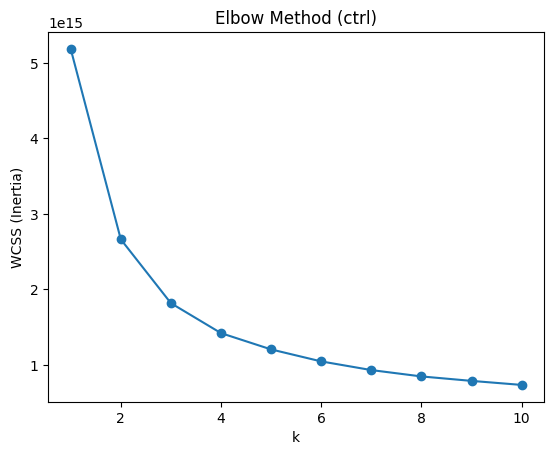

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


ctrl — KMeans cluster sizes: Counter({np.int32(1): 2790, np.int32(0): 2210})
ctrl — MiniBatchKMeans cluster sizes: Counter({np.int32(1): 2856, np.int32(0): 2144})
ctrl — Agglomerative cluster sizes: Counter({np.int64(0): 2565, np.int64(1): 2435})
ctrl — Spectral cluster sizes: Counter({np.int32(0): 4733, np.int32(1): 267})
ctrl — DBSCAN cluster sizes: Counter({np.int64(-1): 5000})


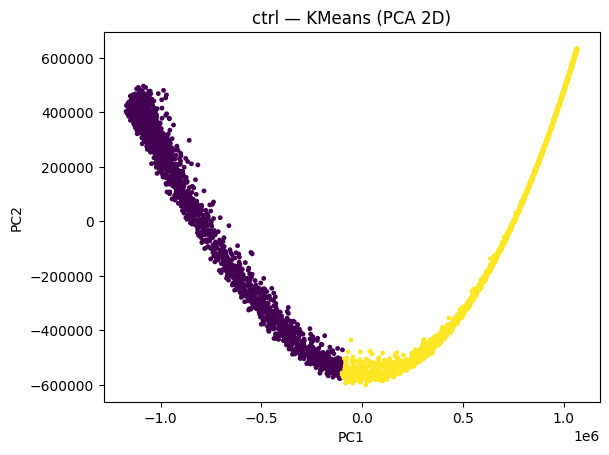

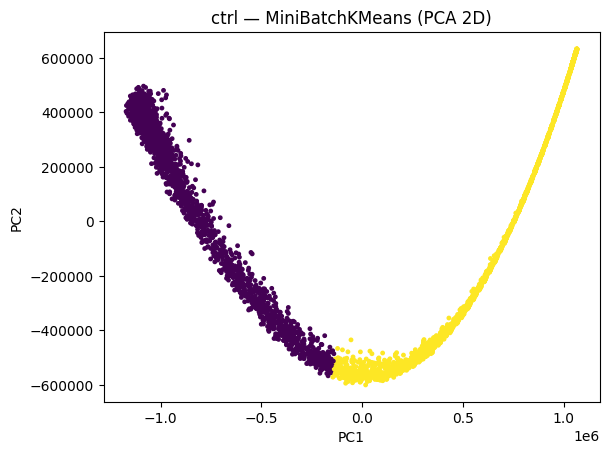

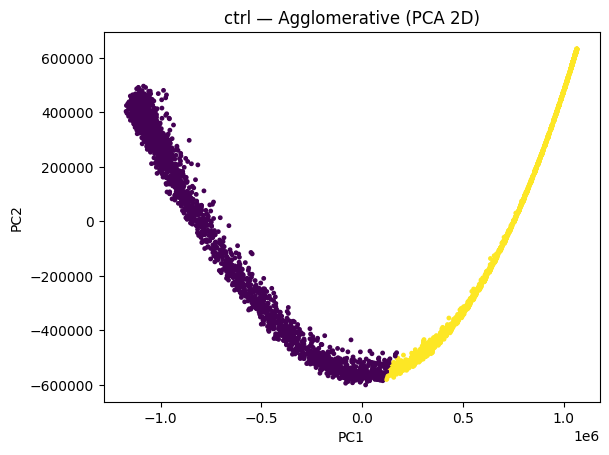

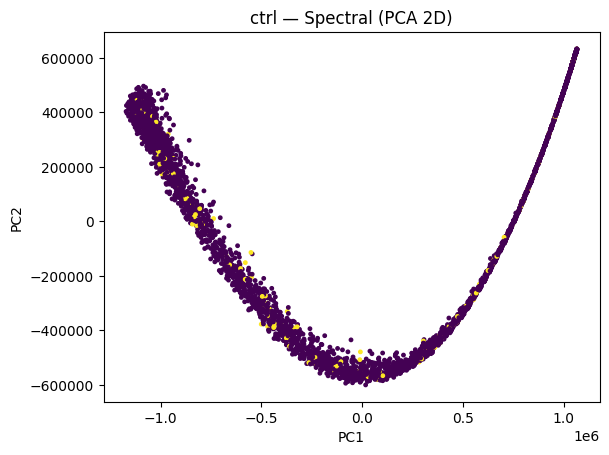

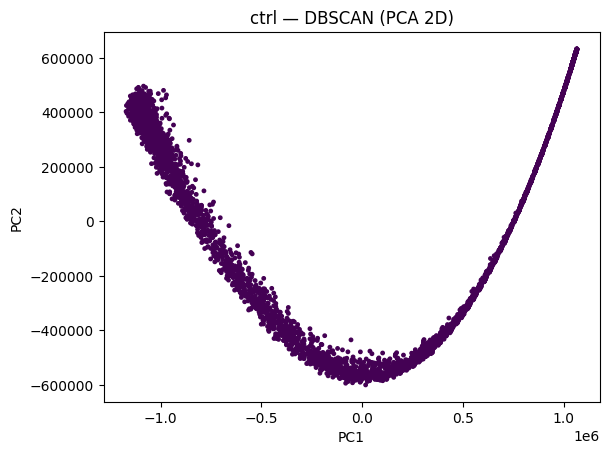

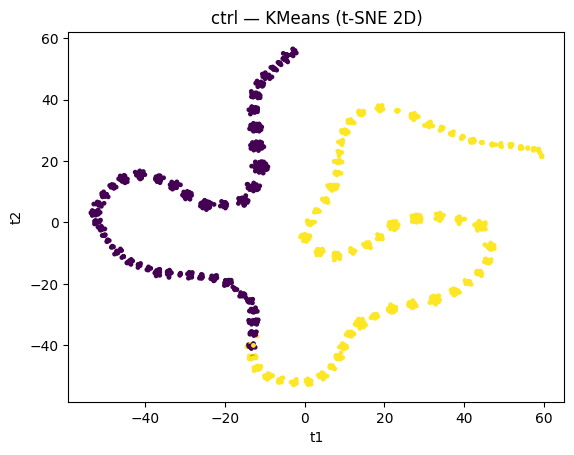

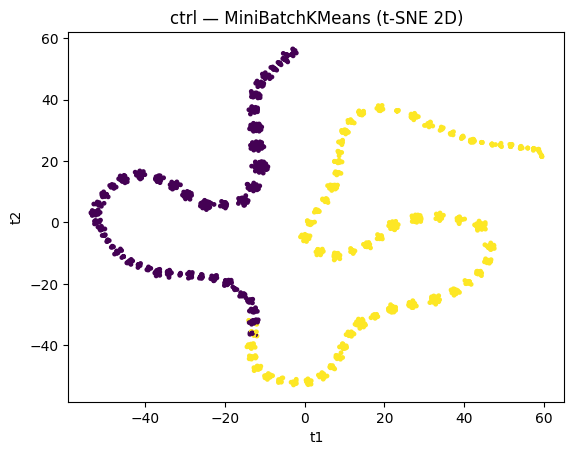

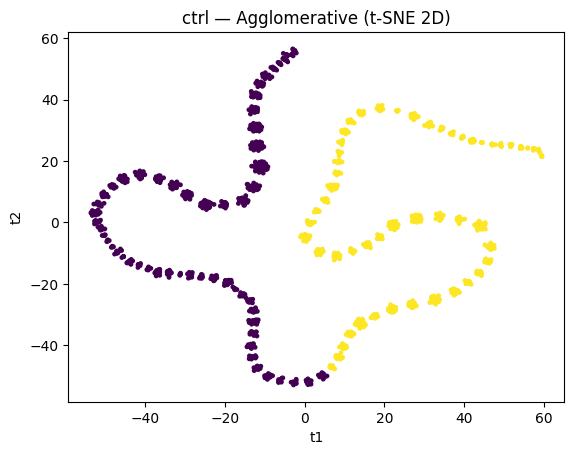

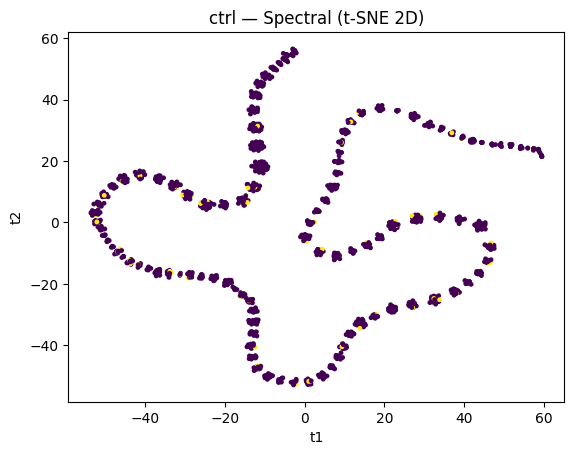

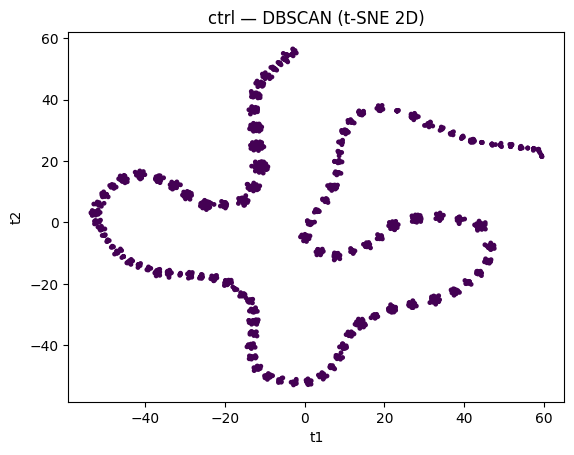


Processing: xlnet-base-cased


Tokenizing: 100%|██████████| 5000/5000 [00:03<00:00, 1649.45it/s]


Padded feature shape for xlnet-base-cased: (5000, 128)


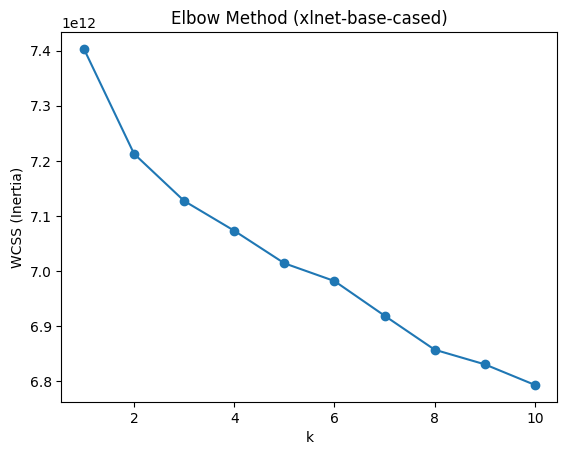

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


xlnet-base-cased — KMeans cluster sizes: Counter({np.int32(1): 3023, np.int32(0): 1977})
xlnet-base-cased — MiniBatchKMeans cluster sizes: Counter({np.int32(1): 4986, np.int32(0): 14})
xlnet-base-cased — Agglomerative cluster sizes: Counter({np.int64(0): 3743, np.int64(1): 1257})
xlnet-base-cased — Spectral cluster sizes: Counter({np.int32(0): 4908, np.int32(1): 92})
xlnet-base-cased — DBSCAN cluster sizes: Counter({np.int64(-1): 5000})


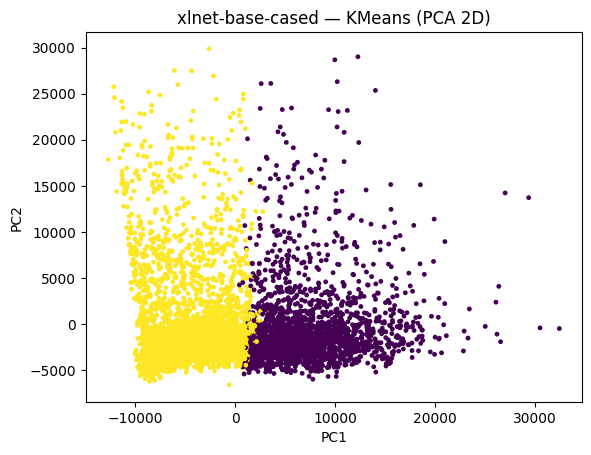

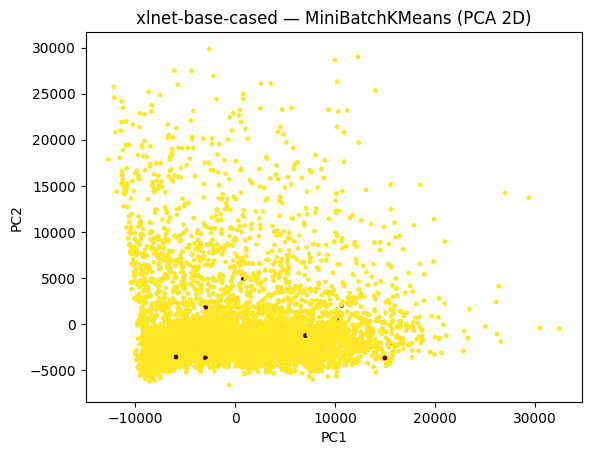

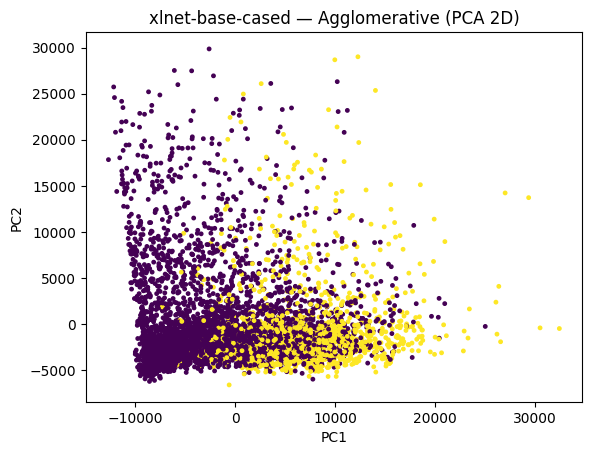

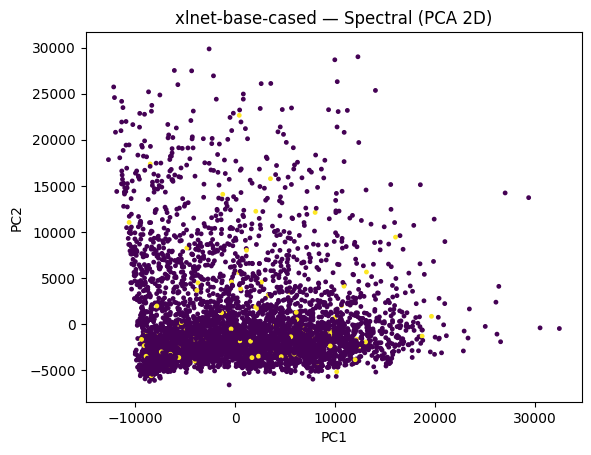

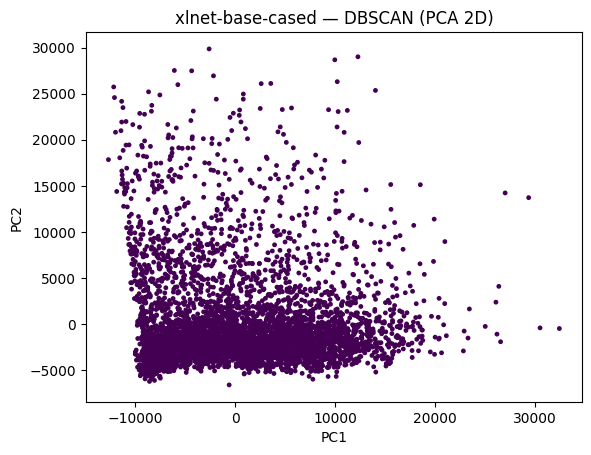

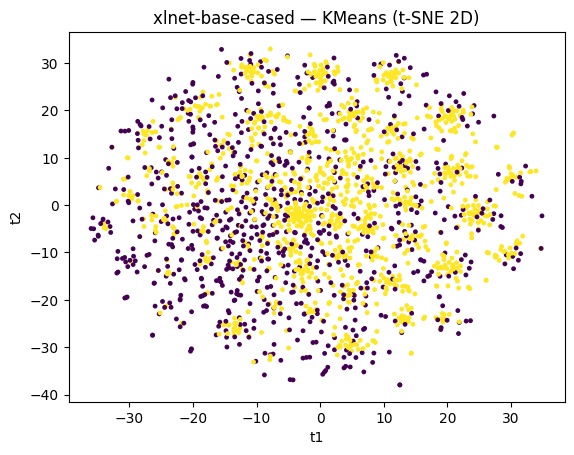

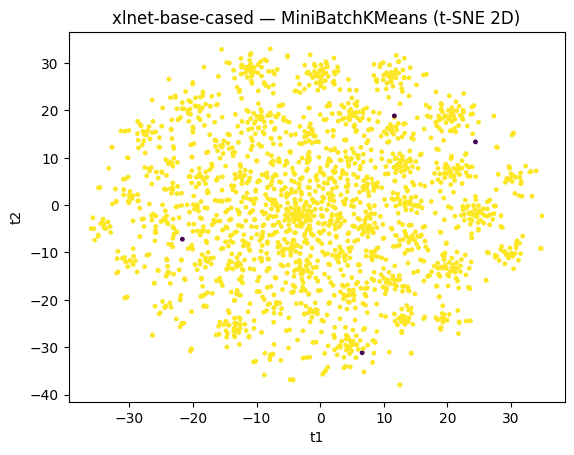

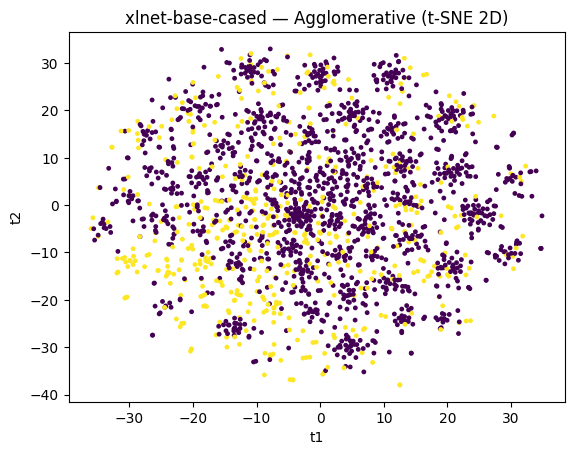

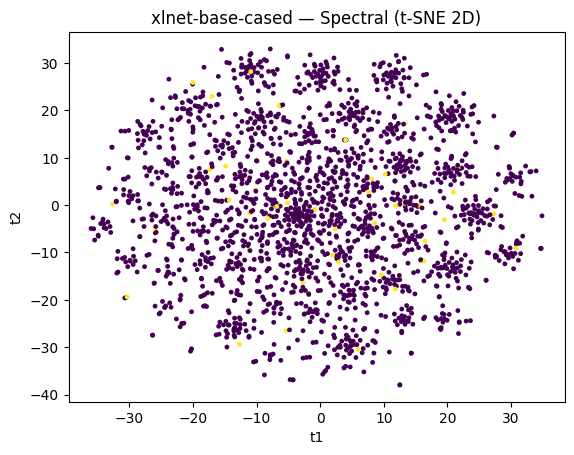

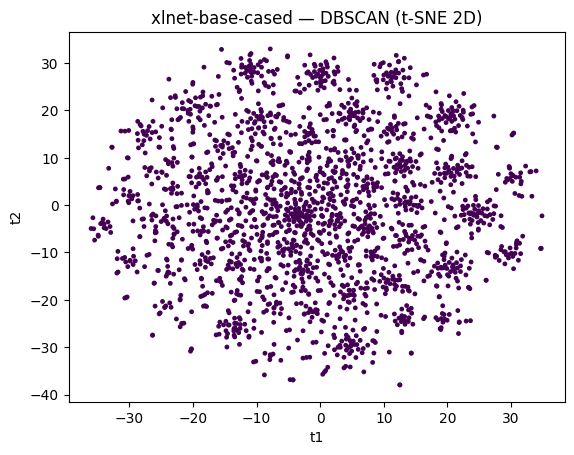

ftfy or spacy is not installed using BERT BasicTokenizer instead of SpaCy & ftfy.



Processing: openai-gpt


Tokenizing: 100%|██████████| 5000/5000 [00:10<00:00, 488.38it/s]


Padded feature shape for openai-gpt: (5000, 128)


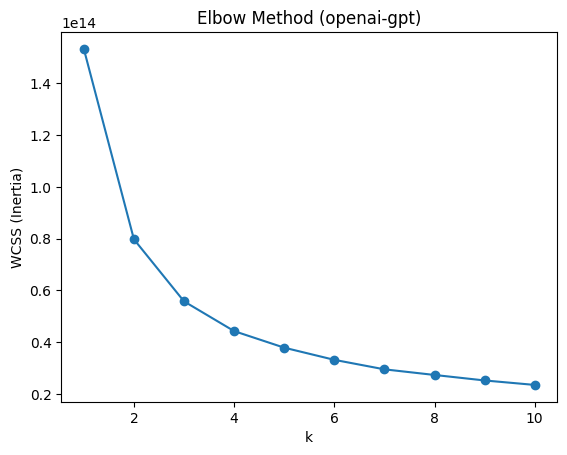

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


openai-gpt — KMeans cluster sizes: Counter({np.int32(0): 2792, np.int32(1): 2208})
openai-gpt — MiniBatchKMeans cluster sizes: Counter({np.int32(0): 2812, np.int32(1): 2188})
openai-gpt — Agglomerative cluster sizes: Counter({np.int64(0): 3099, np.int64(1): 1901})
openai-gpt — Spectral cluster sizes: Counter({np.int32(0): 4693, np.int32(1): 307})
openai-gpt — DBSCAN cluster sizes: Counter({np.int64(-1): 5000})


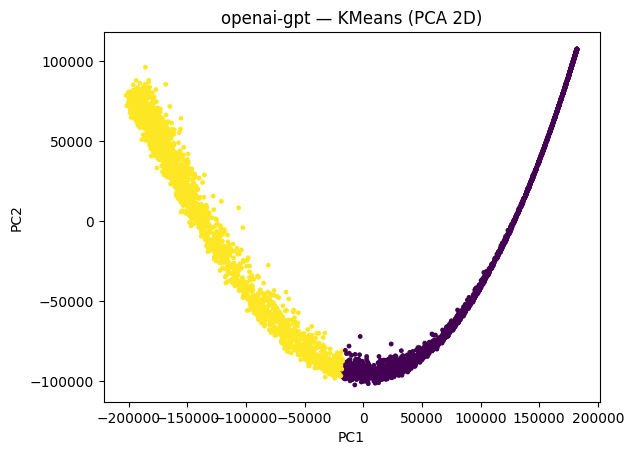

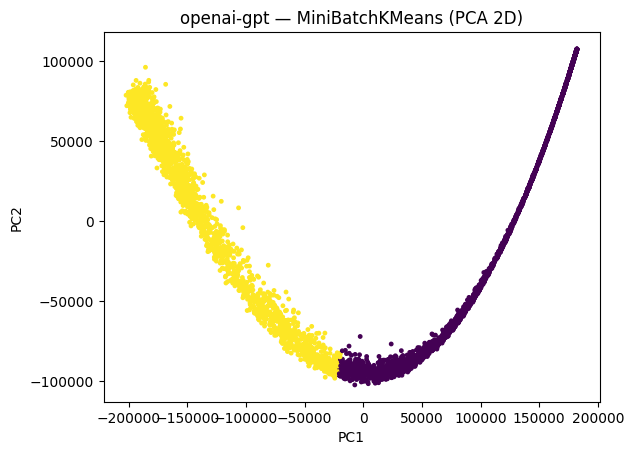

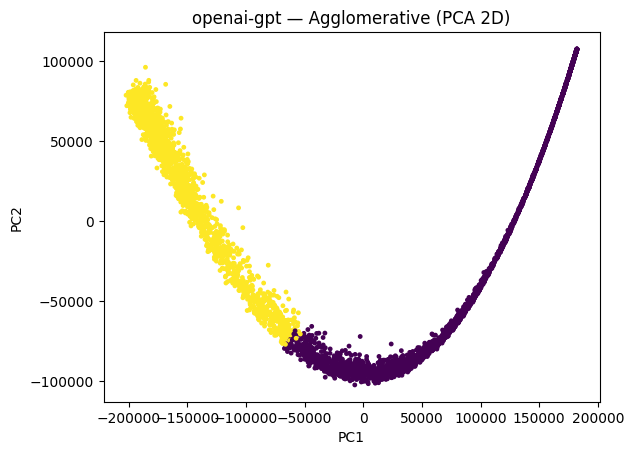

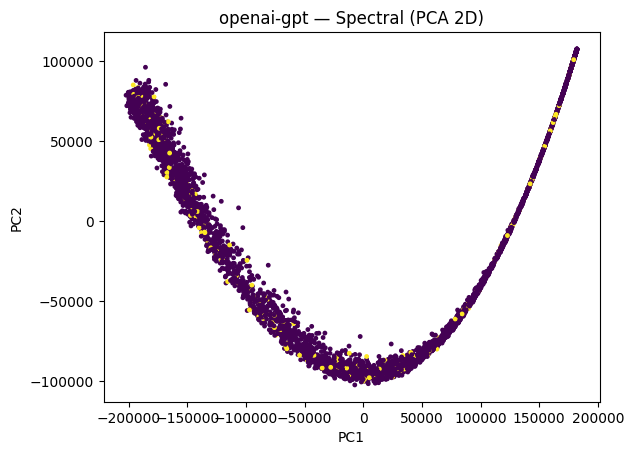

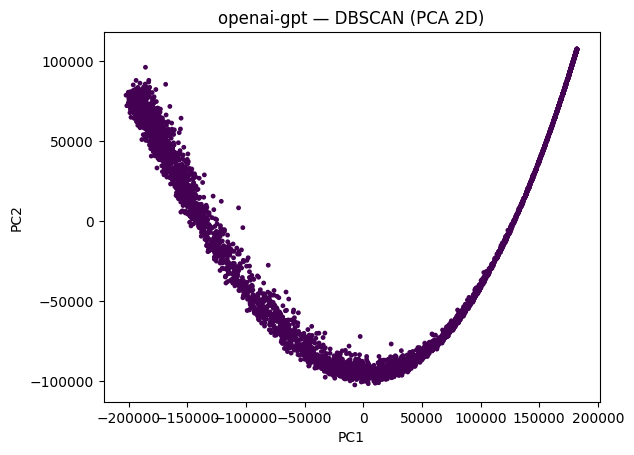

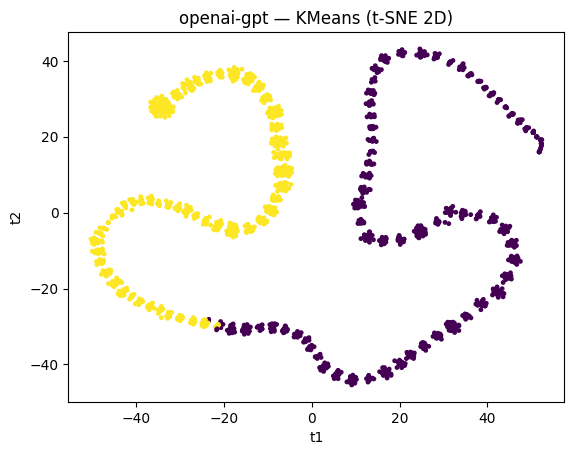

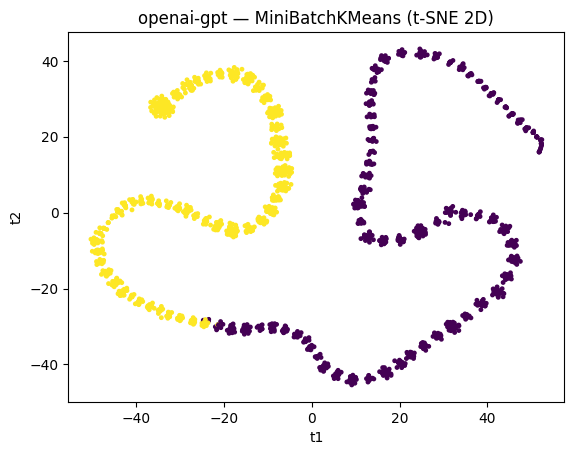

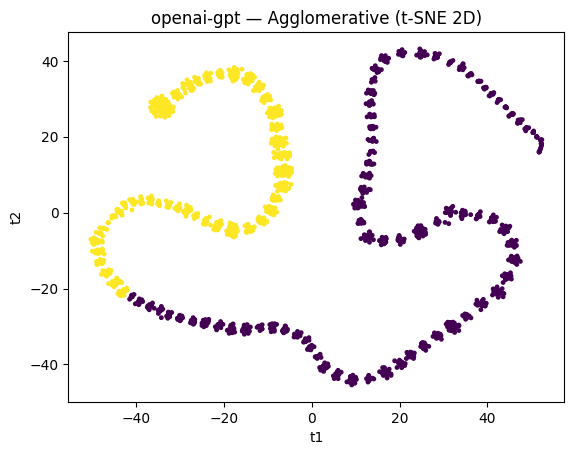

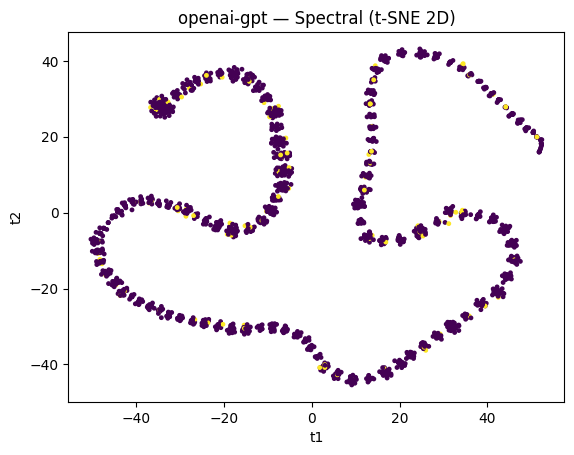

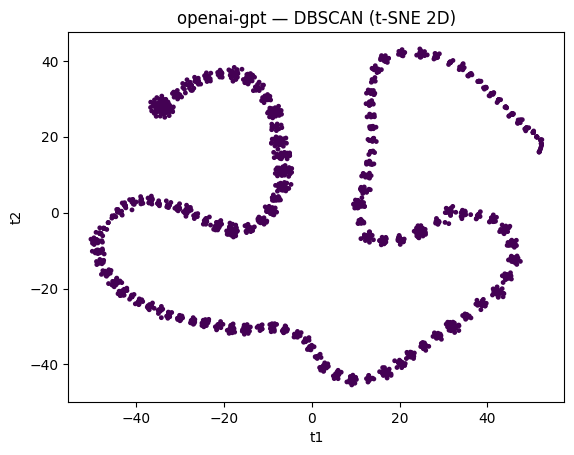


All models processed.


In [ ]:
# ==============================
# MULTI-MODEL, MULTI-CLUSTERING + VISUALIZATION PIPELINE
# ==============================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

from sklearn.cluster import KMeans, MiniBatchKMeans, AgglomerativeClustering, SpectralClustering, DBSCAN
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from tensorflow.keras.preprocessing import sequence
import transformers
import tqdm

# ------------------------------
# 0) CONFIG
# ------------------------------
SEED = 42
np.random.seed(SEED)

# How much to process/plot (tune to your GPU/CPU)
SAMPLE_SIZE = 5000     # how many reviews to cluster (max from reviews_trg)
MAXLEN = 128           # sequence length for padding (use 256/512 if you can afford it)
N_CLUSTERS = 2         # target clusters (you can change this)
TSNE_SAMPLE = 2000     # how many points to visualize with t-SNE (tsne is heavy)
TSNE_PERPLEXITY = 30   # must be < TSNE_SAMPLE
K_RANGE = 10           # for elbow curve (optional; we’ll show for KMeans)

# ------------------------------
# 1) INPUT: reviews_trg must exist
# ------------------------------
try:
    _ = len(reviews_trg)
except NameError:
    raise RuntimeError(
        "reviews_trg not found. Make sure you've prepared reviews_trg (array/Series of strings) before running this cell."
    )

# Clean & sample reviews
reviews_array = np.array([str(x) for x in reviews_trg])
if len(reviews_array) > SAMPLE_SIZE:
    idx = np.random.RandomState(SEED).choice(len(reviews_array), SAMPLE_SIZE, replace=False)
    reviews_array = reviews_array[idx]

print(f"Using {len(reviews_array)} reviews for clustering.")

# ------------------------------
# 2) TOKENIZER UTILS
# ------------------------------
def load_tokenizer(model_name, tok_cls):
    tok = tok_cls.from_pretrained(model_name)
    # Ensure pad token exists (GPT-2, OpenAI GPT, CTRL may lack a pad token)
    if tok.pad_token is None:
        try:
            tok.add_special_tokens({'pad_token': '[PAD]'})
        except Exception:
            # Some tokenizers might not support add_special_tokens. Fallback to assigning EOS or unk.
            if getattr(tok, "eos_token", None) is not None:
                tok.pad_token = tok.eos_token
            else:
                tok.pad_token = tok.unk_token if tok.unk_token is not None else '[PAD]'
        # Ensure pad_token_id is set
        if tok.pad_token_id is None and tok.pad_token is not None:
            tok.pad_token_id = tok.convert_tokens_to_ids(tok.pad_token)
    return tok

def tokenize_to_ids(tokenizer, docs):
    feats = []
    for doc in tqdm.tqdm(docs, desc="Tokenizing"):
        # simple, fast: tokenize -> ids (no special tokens)
        tokens = tokenizer.tokenize(doc)
        ids = tokenizer.convert_tokens_to_ids(tokens)
        feats.append(ids if ids is not None else [])
    return feats

def pad_ids(features, pad_id, maxlen=128):
    return sequence.pad_sequences(features, maxlen=maxlen, value=pad_id, truncating='post', padding='pre')

# ------------------------------
# 3) CLUSTERING & VIS
# ------------------------------
def elbow_plot(X, model_name, k_range=10):
    inertias = []
    for k in range(1, k_range + 1):
        km = KMeans(n_clusters=k, random_state=SEED, n_init=10)
        km.fit(X)
        inertias.append(km.inertia_)
    plt.figure()
    plt.plot(range(1, k_range + 1), inertias, marker='o')
    plt.title(f'Elbow Method ({model_name})')
    plt.xlabel('k')
    plt.ylabel('WCSS (Inertia)')
    plt.show()

def run_all_clustering(X, n_clusters=2):
    results = {}

    # KMeans
    km = KMeans(n_clusters=n_clusters, random_state=SEED, n_init=10).fit(X)
    results['KMeans'] = km.labels_

    # MiniBatchKMeans
    mbkm = MiniBatchKMeans(n_clusters=n_clusters, random_state=SEED, n_init=10, batch_size=2048).fit(X)
    results['MiniBatchKMeans'] = mbkm.labels_

    # Agglomerative
    ag = AgglomerativeClustering(n_clusters=n_clusters).fit(X)
    results['Agglomerative'] = ag.labels_

    # Spectral (can be slow; uses affinity='rbf' by default; assign_labels='kmeans' is robust)
    sp = SpectralClustering(n_clusters=n_clusters, assign_labels='kmeans', random_state=SEED).fit(X)
    results['Spectral'] = sp.labels_

    # DBSCAN (labels may include -1 for noise; eps needs tuning)
    db = DBSCAN(eps=3, min_samples=10).fit(X)
    results['DBSCAN'] = db.labels_

    return results

def visualize_clusters(X, labels_dict, model_name, tsne_sample=2000, perplexity=30):
    # PCA
    pca = PCA(n_components=2, random_state=SEED)
    X_pca = pca.fit_transform(X)

    for name, y in labels_dict.items():
        plt.figure()
        plt.scatter(X_pca[:,0], X_pca[:,1], c=y, s=6)
        plt.title(f'{model_name} — {name} (PCA 2D)')
        plt.xlabel('PC1')
        plt.ylabel('PC2')
        plt.show()

    # t-SNE (subset for speed)
    if len(X) > tsne_sample:
        sub_idx = np.random.RandomState(SEED).choice(len(X), tsne_sample, replace=False)
        X_small = X[sub_idx]
        labels_small = {k: np.array(v)[sub_idx] for k, v in labels_dict.items()}
    else:
        X_small = X
        labels_small = labels_dict

    tsne = TSNE(n_components=2, random_state=SEED, perplexity=min(perplexity, len(X_small)-1))
    X_tsne = tsne.fit_transform(X_small)

    for name, y in labels_small.items():
        plt.figure()
        plt.scatter(X_tsne[:,0], X_tsne[:,1], c=y, s=6)
        plt.title(f'{model_name} — {name} (t-SNE 2D)')
        plt.xlabel('t1')
        plt.ylabel('t2')
        plt.show()

# ------------------------------
# 4) MODELS TO RUN
# ------------------------------
MODELS = [
    # name, tokenizer class
    ('bert-base-uncased',        transformers.BertTokenizer),
    ('gpt2',                     transformers.GPT2Tokenizer),
    ('roberta-base',             transformers.RobertaTokenizer),
    ('xlm-mlm-en-2048',          transformers.XLMTokenizer),
    ('distilbert-base-uncased',  transformers.DistilBertTokenizer),
    ('t5-base',                  transformers.T5Tokenizer),
    ('ctrl',                     transformers.CTRLTokenizer),         # CTRL tokenizer
    ('xlnet-base-cased',         transformers.XLNetTokenizer),
    ('openai-gpt',               transformers.OpenAIGPTTokenizer),
]

# ------------------------------
# 5) RUN PIPELINE
# ------------------------------
for model_name, tok_cls in MODELS:
    print("\n" + "="*80)
    print(f"Processing: {model_name}")
    print("="*80)

    # Load tokenizer with a pad token guarantee
    tok = load_tokenizer(model_name, tok_cls)

    # Tokenize & pad
    ids = tokenize_to_ids(tok, reviews_array)
    X = pad_ids(ids, pad_id=tok.pad_token_id or 0, maxlen=MAXLEN)

    print(f"Padded feature shape for {model_name}: {X.shape}")

    # Optional: elbow plot for KMeans
    elbow_plot(X, model_name, k_range=K_RANGE)

    # Run multiple clustering methods
    labels_dict = run_all_clustering(X, n_clusters=N_CLUSTERS)

    # Report cluster sizes
    for method, lbls in labels_dict.items():
        print(f"{model_name} — {method} cluster sizes:", Counter(lbls))

    # Visualize via PCA & t-SNE
    visualize_clusters(X, labels_dict, model_name, tsne_sample=TSNE_SAMPLE, perplexity=TSNE_PERPLEXITY)

print("\nAll models processed.")


**Comprehensive Multi-Model Clustering and UMAP Visualization for Sentiment-Aware E-Commerce Reviews**

This pipeline performs end-to-end clustering and evaluation of e-commerce product reviews using multiple transformer-based language models (BERT, GPT-2, RoBERTa, XLNet, T5, etc.). It extracts text embeddings, applies diverse clustering methods (KMeans, Agglomerative, DBSCAN), and evaluates performance using Silhouette, Calinski–Harabasz, and Davies–Bouldin scores, alongside confusion matrix alignment with ground-truth sentiment labels. UMAP is used for low-dimensional visualization of cluster distributions.



=== Processing with BERT ===


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


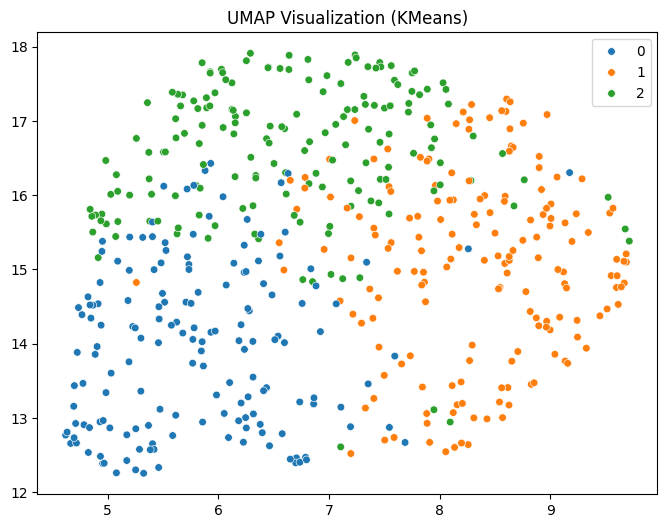


=== BERT + KMeans ===
Silhouette Score: 0.037897080183029175
Calinski–Harabasz Score: 27.492420196533203
Davies–Bouldin Score: 3.733794535353003


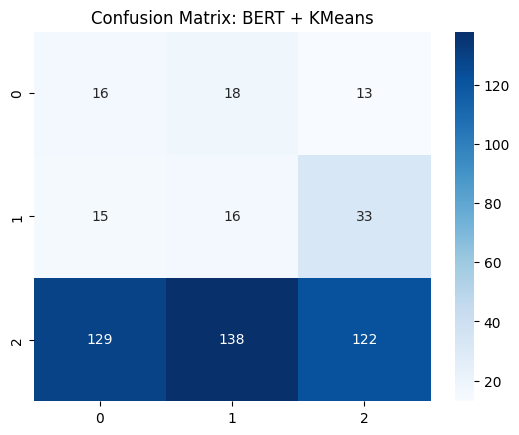

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


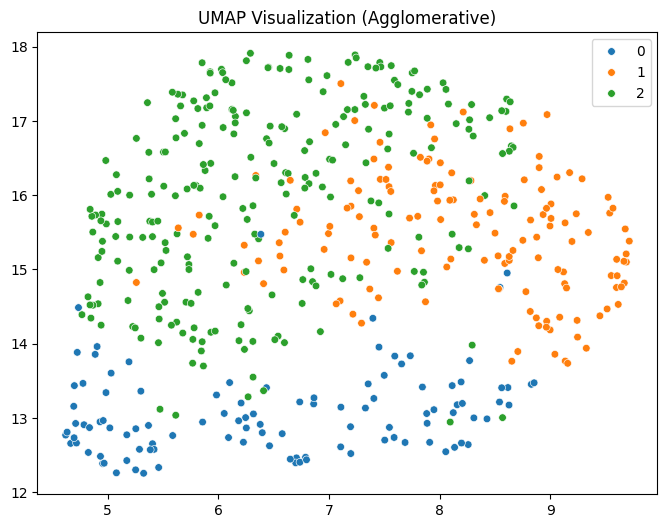


=== BERT + Agglomerative ===
Silhouette Score: 0.04101671278476715
Calinski–Harabasz Score: 21.22210121154785
Davies–Bouldin Score: 4.090467313394491


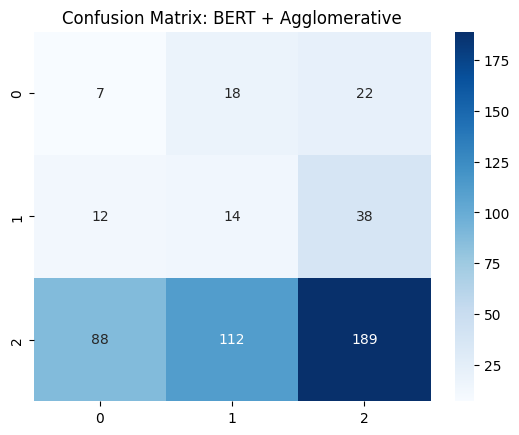

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


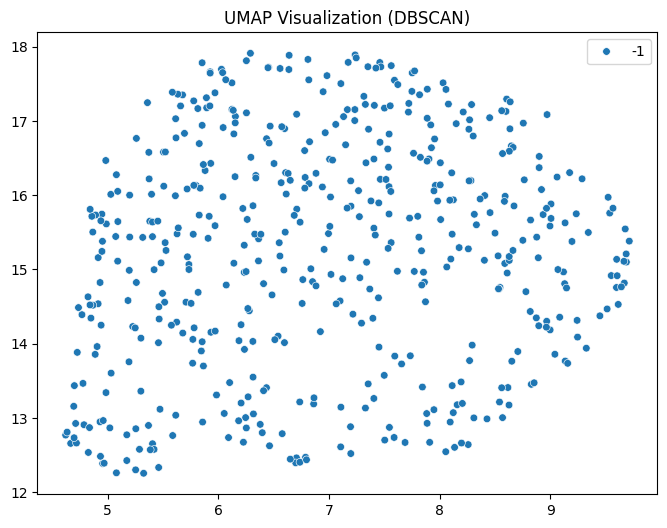


=== BERT + DBSCAN ===
Silhouette Score: None
Calinski–Harabasz Score: None
Davies–Bouldin Score: None


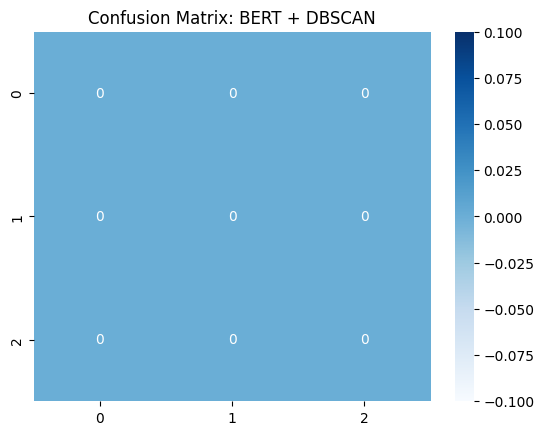



=== Processing with GPT-2 ===


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


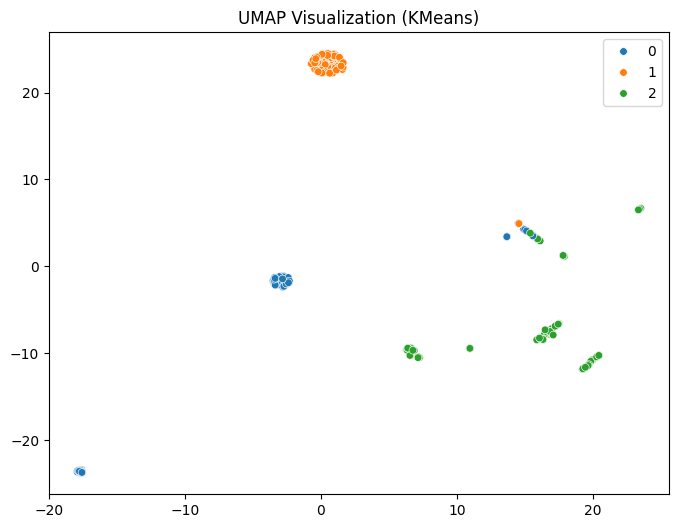


=== GPT-2 + KMeans ===
Silhouette Score: 0.7009952664375305
Calinski–Harabasz Score: 913.225830078125
Davies–Bouldin Score: 0.5974081209983138


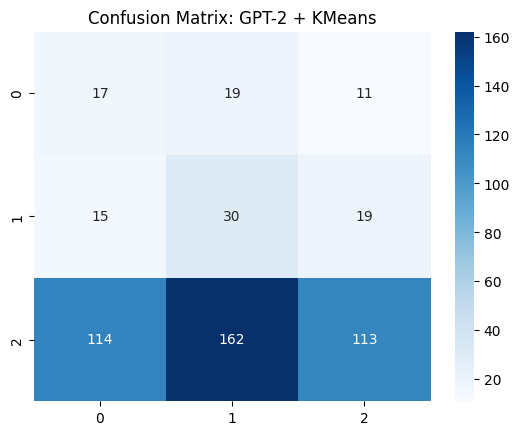

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


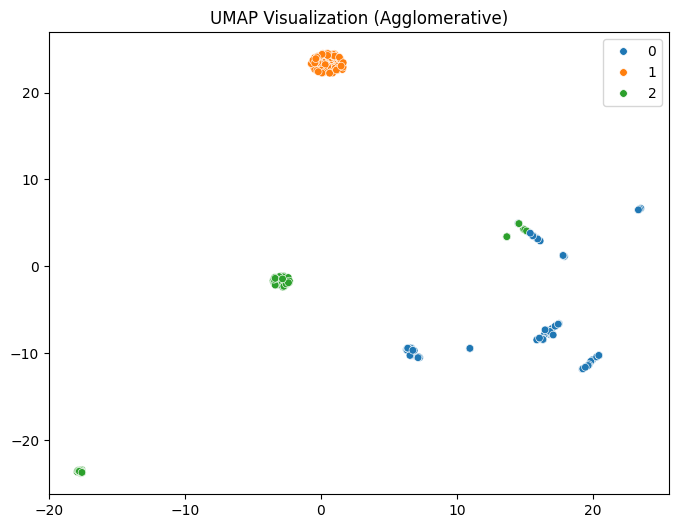


=== GPT-2 + Agglomerative ===
Silhouette Score: 0.7039060592651367
Calinski–Harabasz Score: 883.5217895507812
Davies–Bouldin Score: 0.5937297610536755


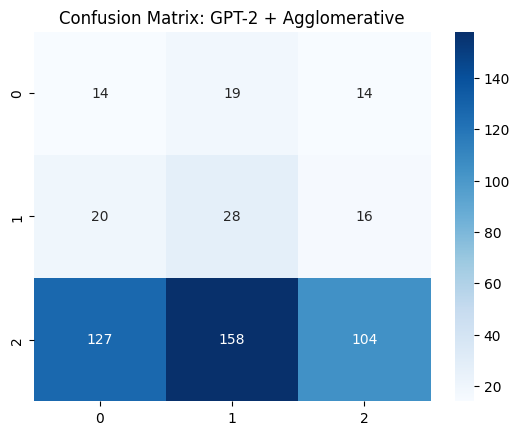

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


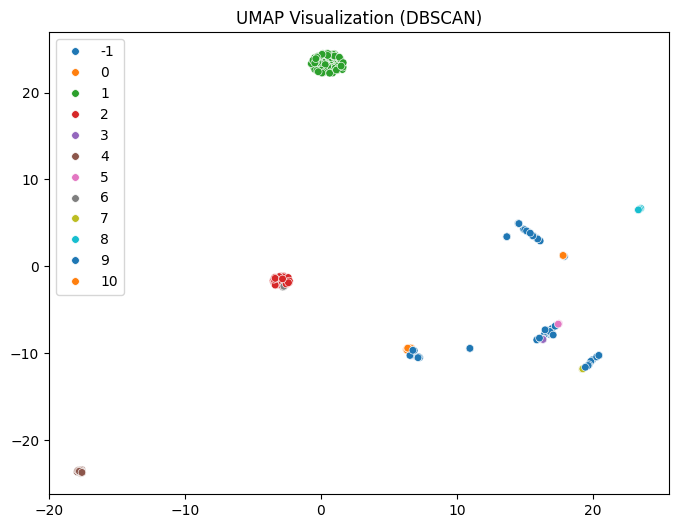


=== GPT-2 + DBSCAN ===
Silhouette Score: 0.6763636469841003
Calinski–Harabasz Score: 234.60995483398438
Davies–Bouldin Score: 1.066149550163567


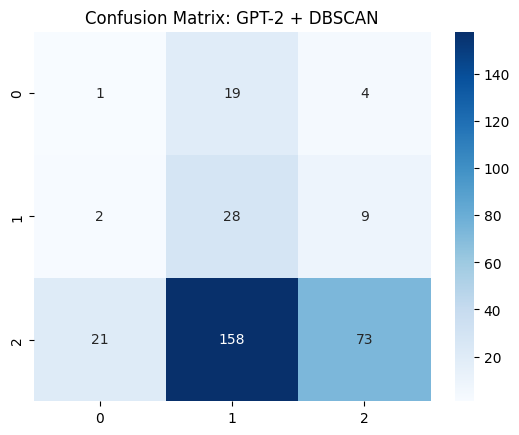



=== Processing with RoBERTa ===


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


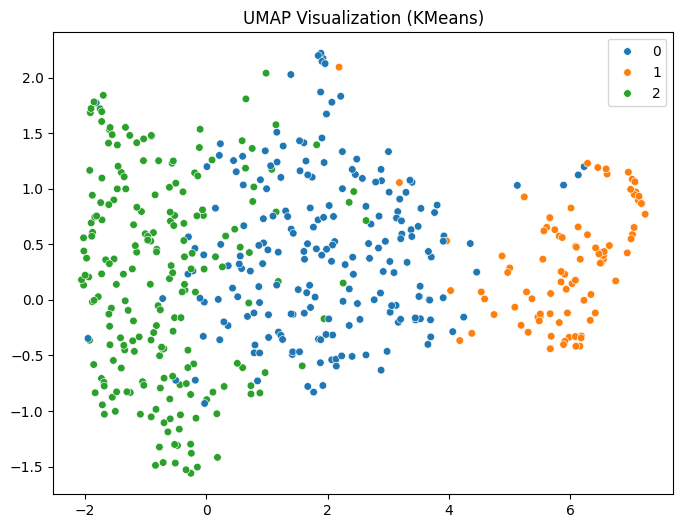


=== RoBERTa + KMeans ===
Silhouette Score: 0.1202092319726944
Calinski–Harabasz Score: 108.10348510742188
Davies–Bouldin Score: 2.245495096585153


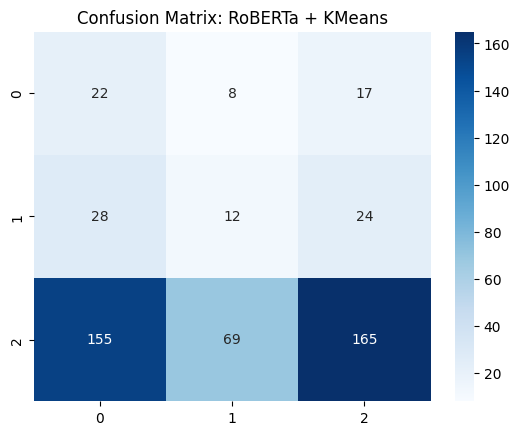

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


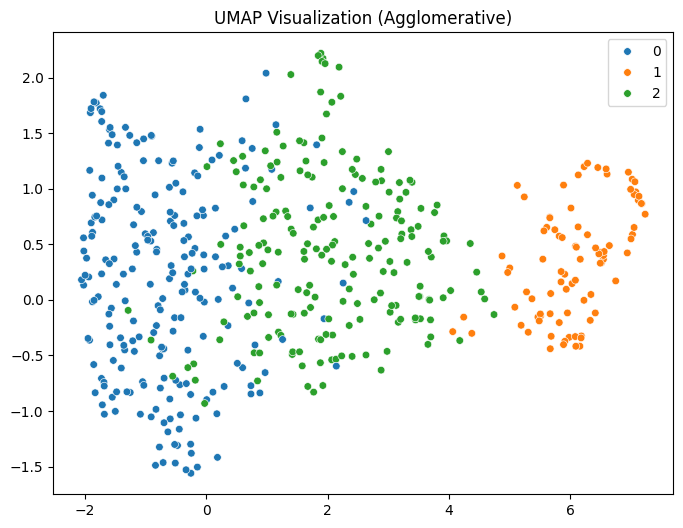


=== RoBERTa + Agglomerative ===
Silhouette Score: 0.11239434778690338
Calinski–Harabasz Score: 102.9270248413086
Davies–Bouldin Score: 2.273424293231032


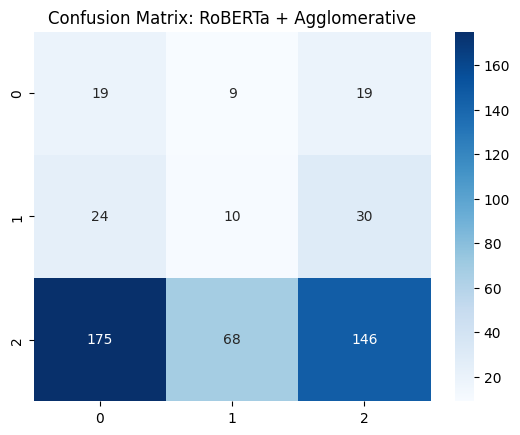

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


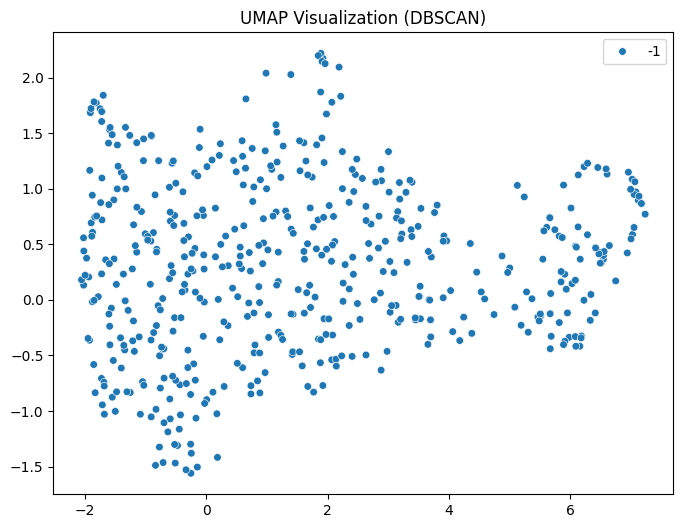


=== RoBERTa + DBSCAN ===
Silhouette Score: None
Calinski–Harabasz Score: None
Davies–Bouldin Score: None


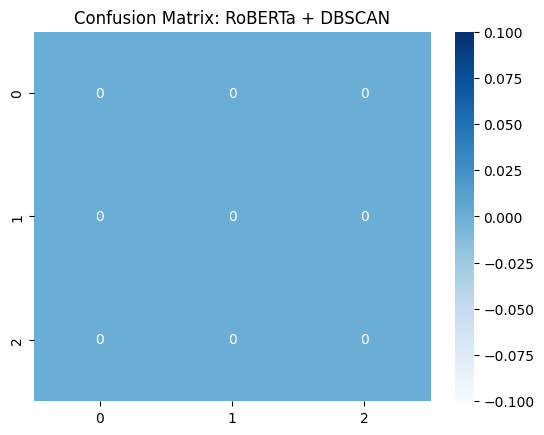



=== Processing with DistilBERT ===


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


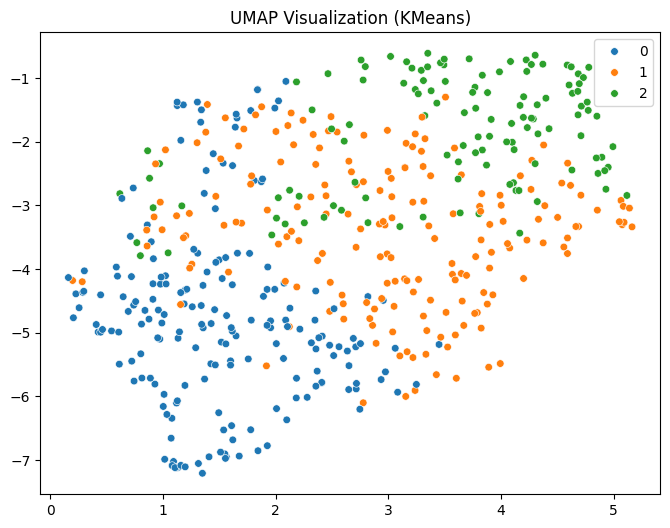


=== DistilBERT + KMeans ===
Silhouette Score: 0.0601017065346241
Calinski–Harabasz Score: 41.90850067138672
Davies–Bouldin Score: 3.3971851257915464


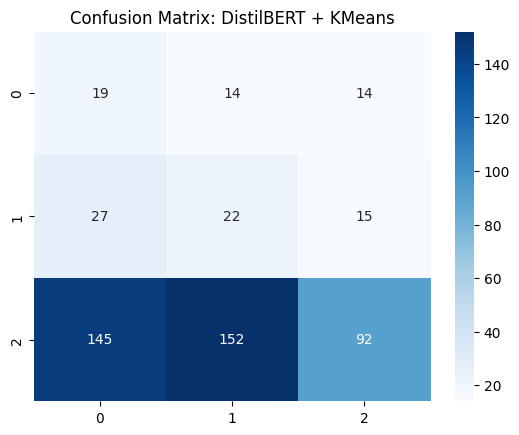

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


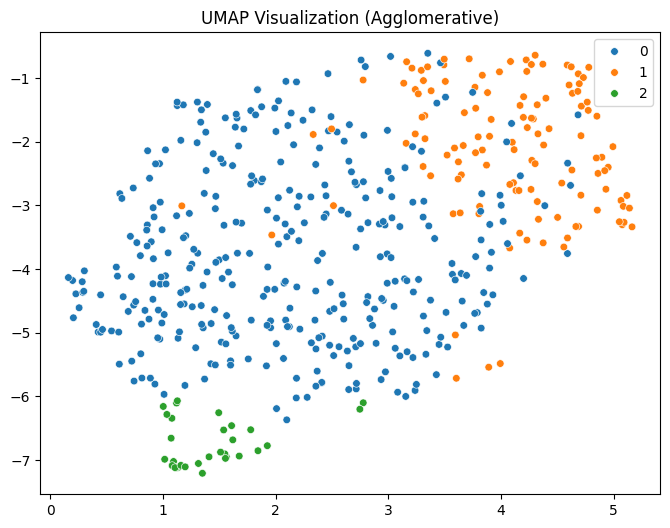


=== DistilBERT + Agglomerative ===
Silhouette Score: 0.0837232768535614
Calinski–Harabasz Score: 35.98732376098633
Davies–Bouldin Score: 2.680606542858986


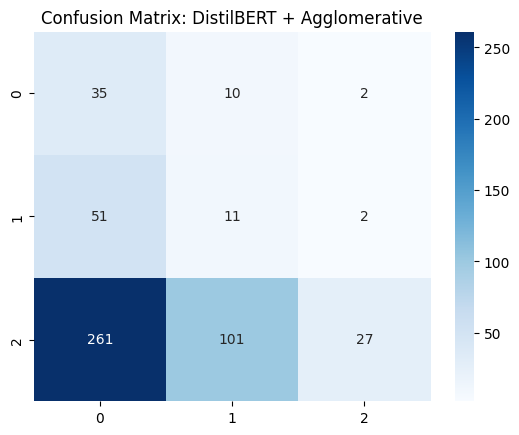

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


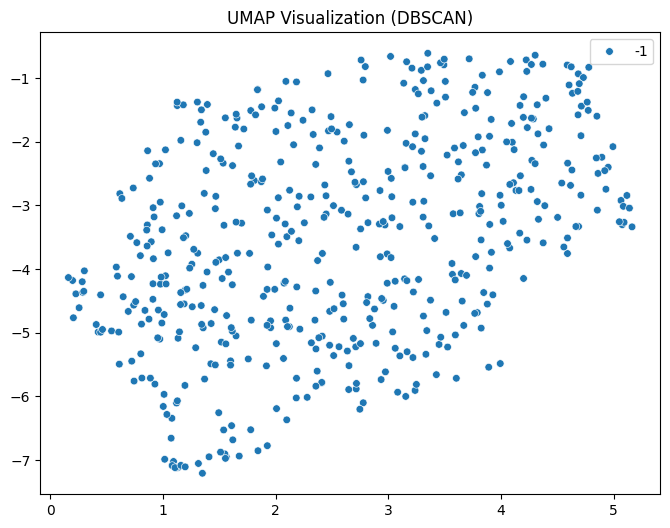


=== DistilBERT + DBSCAN ===
Silhouette Score: None
Calinski–Harabasz Score: None
Davies–Bouldin Score: None


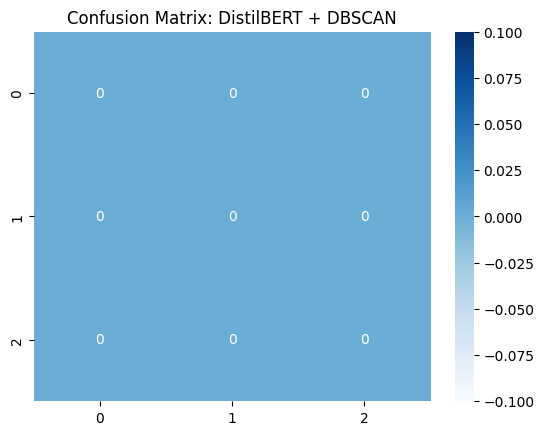



=== Processing with XLM ===


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


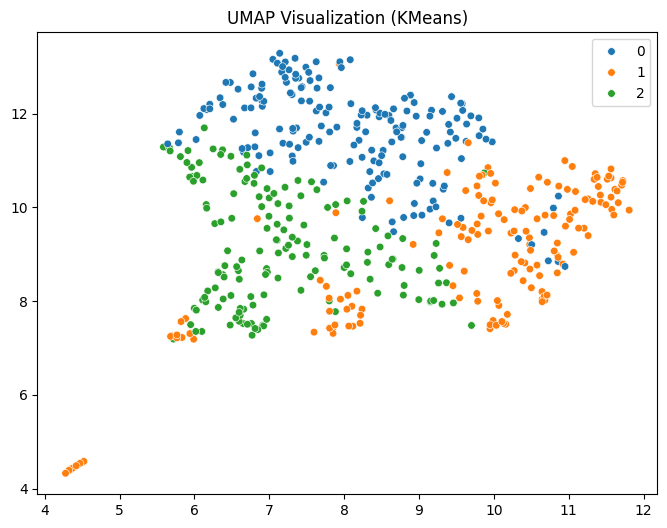


=== XLM + KMeans ===
Silhouette Score: 0.07672442495822906
Calinski–Harabasz Score: 42.48207473754883
Davies–Bouldin Score: 2.7785547762693095


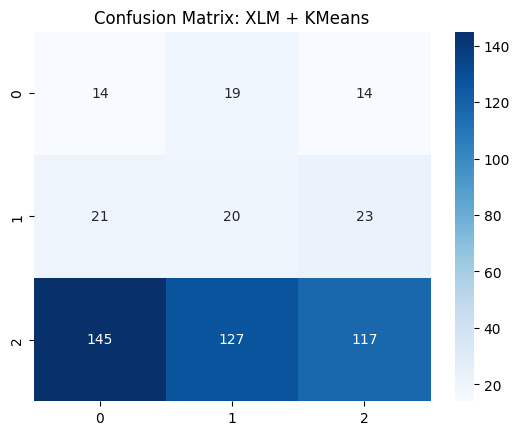

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


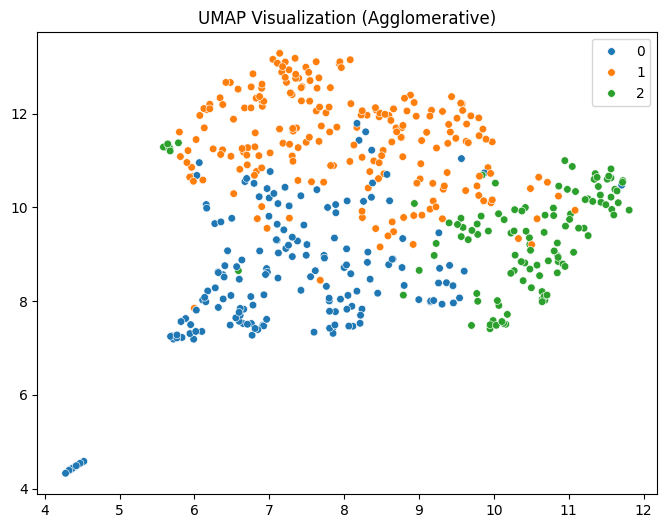


=== XLM + Agglomerative ===
Silhouette Score: 0.06847970932722092
Calinski–Harabasz Score: 36.88217544555664
Davies–Bouldin Score: 3.039905403046985


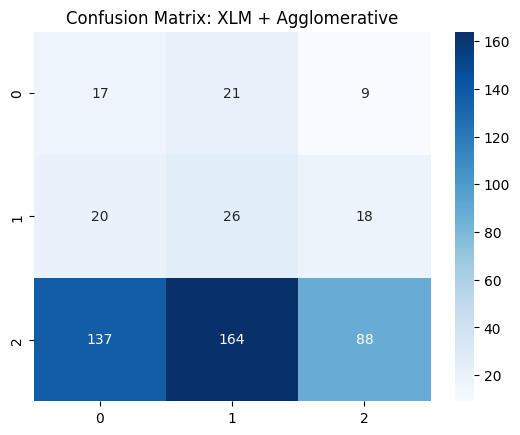

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


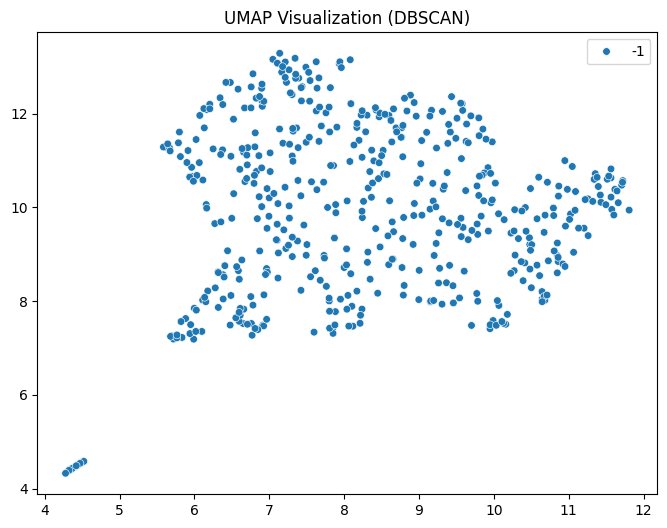


=== XLM + DBSCAN ===
Silhouette Score: None
Calinski–Harabasz Score: None
Davies–Bouldin Score: None


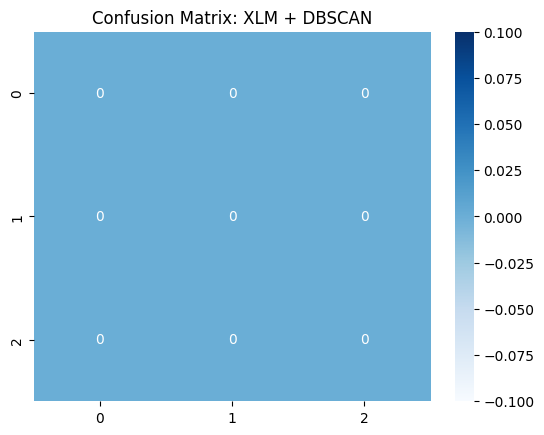



=== Processing with T5 ===


You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


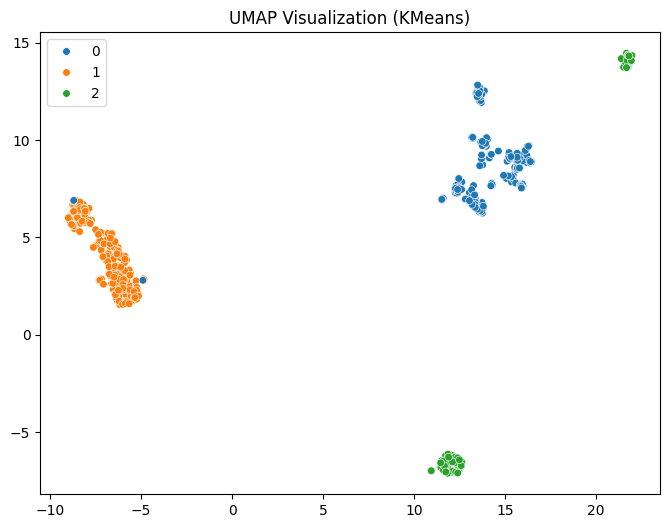


=== T5 + KMeans ===
Silhouette Score: 0.32522523403167725
Calinski–Harabasz Score: 171.12652587890625
Davies–Bouldin Score: 1.5574128422300308


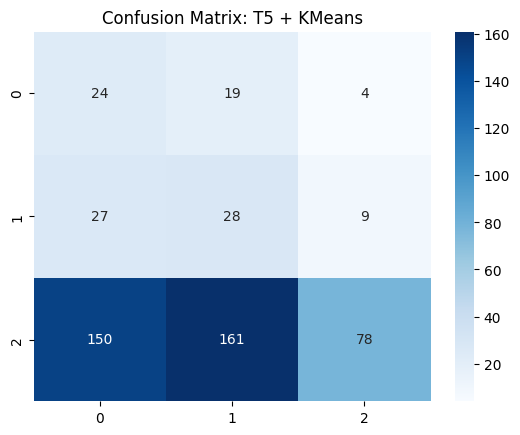

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


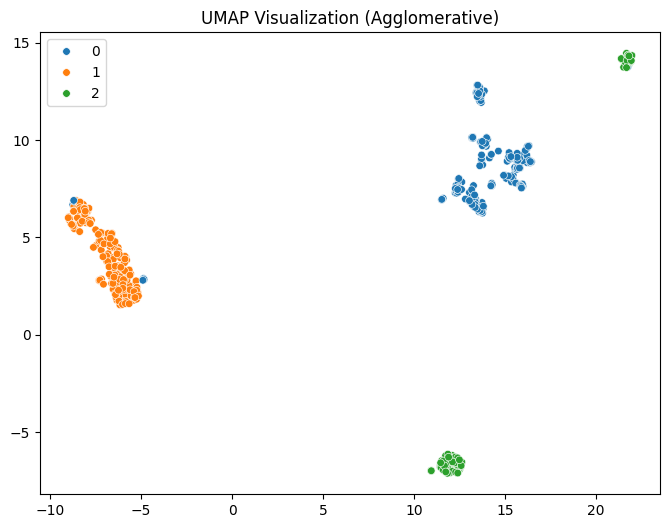


=== T5 + Agglomerative ===
Silhouette Score: 0.32392606139183044
Calinski–Harabasz Score: 170.60284423828125
Davies–Bouldin Score: 1.5580052334225485


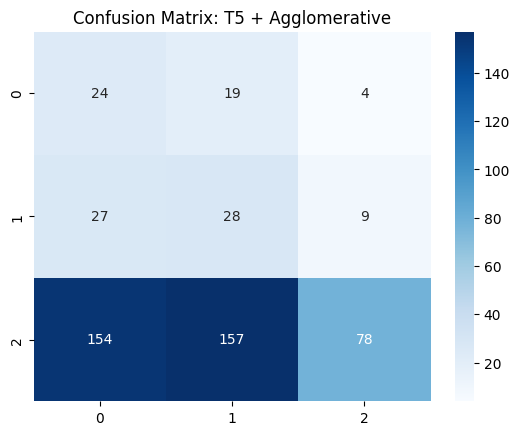

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


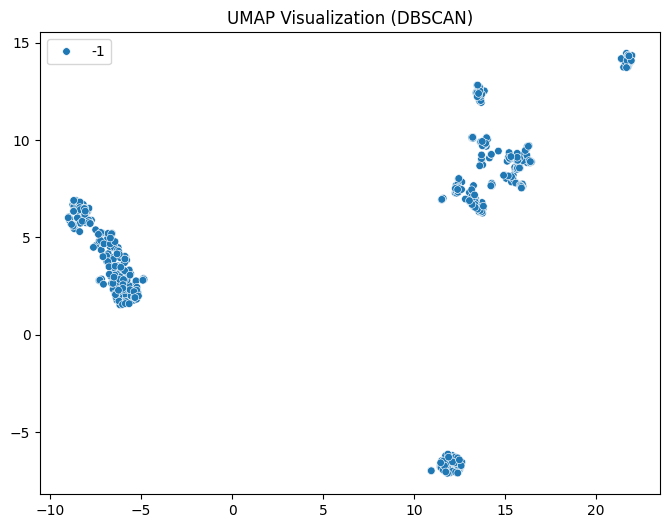


=== T5 + DBSCAN ===
Silhouette Score: None
Calinski–Harabasz Score: None
Davies–Bouldin Score: None


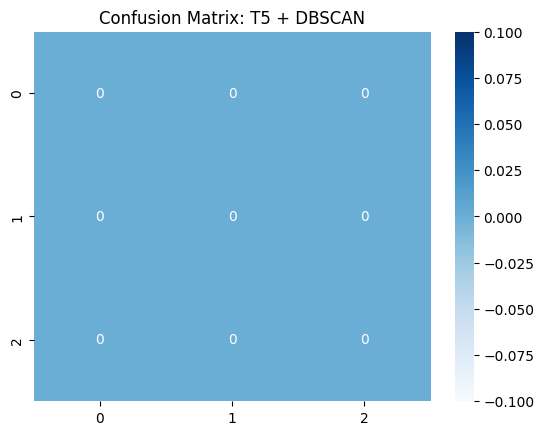



=== Processing with XLNet ===


pytorch_model.bin:   0%|          | 0.00/467M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/467M [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


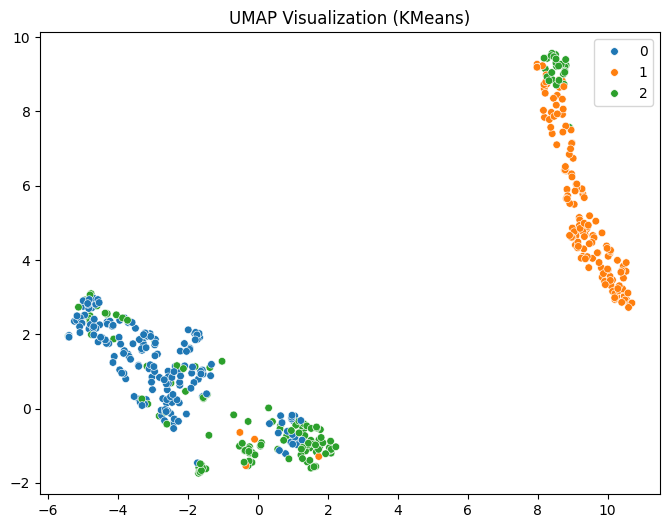


=== XLNet + KMeans ===
Silhouette Score: 0.35685211420059204
Calinski–Harabasz Score: 759.8405151367188
Davies–Bouldin Score: 1.0791778993449415


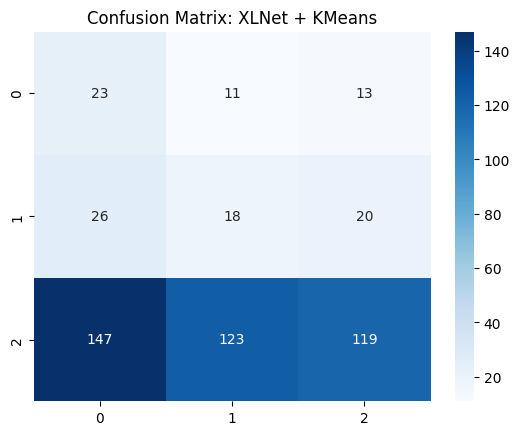

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


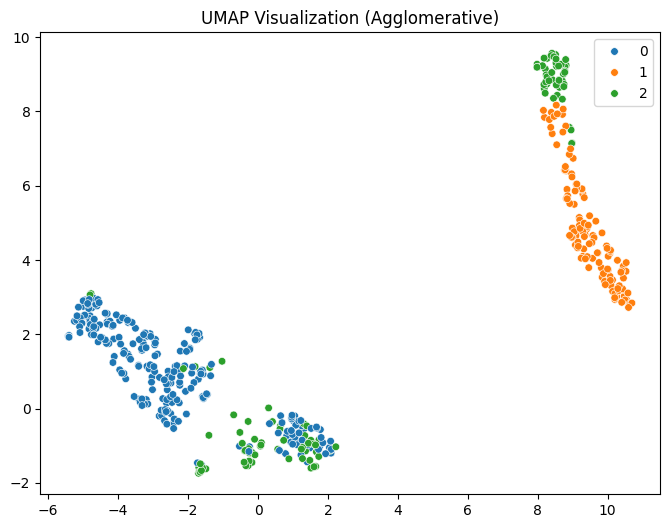


=== XLNet + Agglomerative ===
Silhouette Score: 0.3726060688495636
Calinski–Harabasz Score: 709.0798950195312
Davies–Bouldin Score: 1.0343975074991554


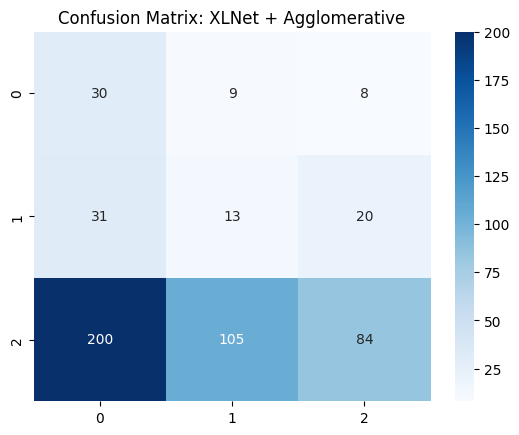

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


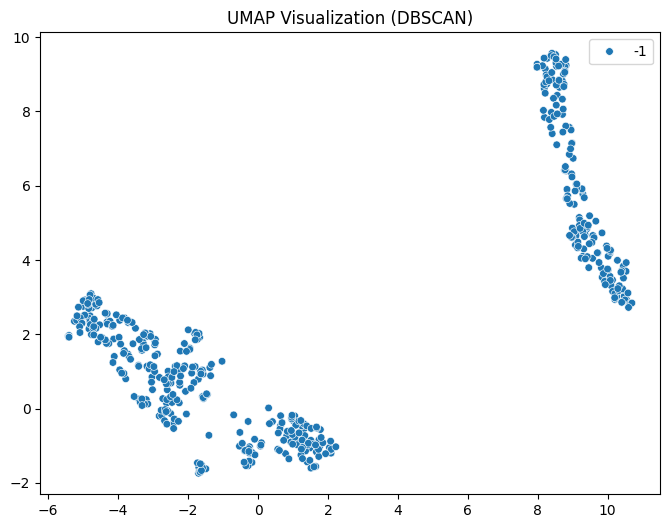


=== XLNet + DBSCAN ===
Silhouette Score: None
Calinski–Harabasz Score: None
Davies–Bouldin Score: None


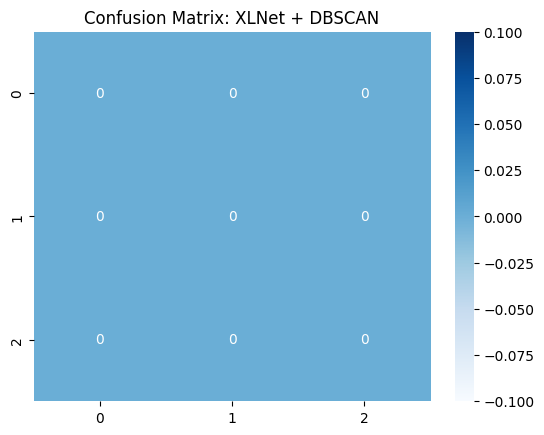



=== Processing with GPT ===


tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


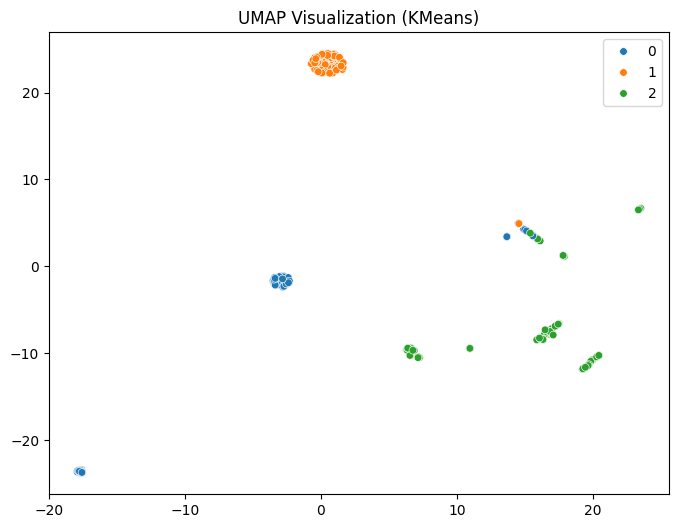


=== GPT + KMeans ===
Silhouette Score: 0.7009952664375305
Calinski–Harabasz Score: 913.225830078125
Davies–Bouldin Score: 0.5974081209983138


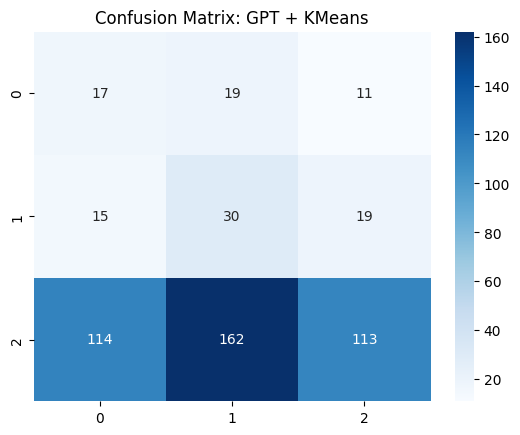

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


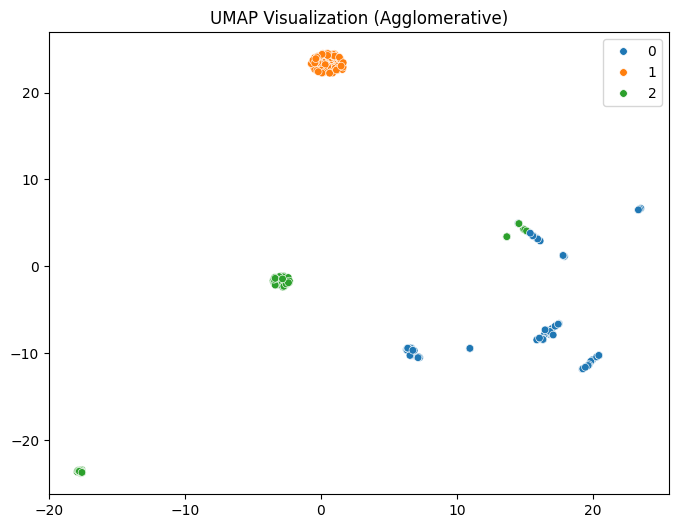


=== GPT + Agglomerative ===
Silhouette Score: 0.7039060592651367
Calinski–Harabasz Score: 883.5217895507812
Davies–Bouldin Score: 0.5937297610536755


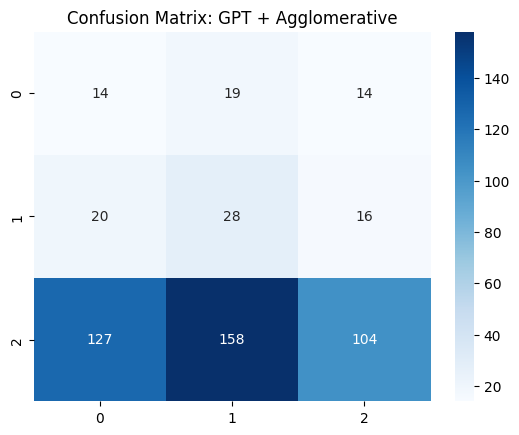

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


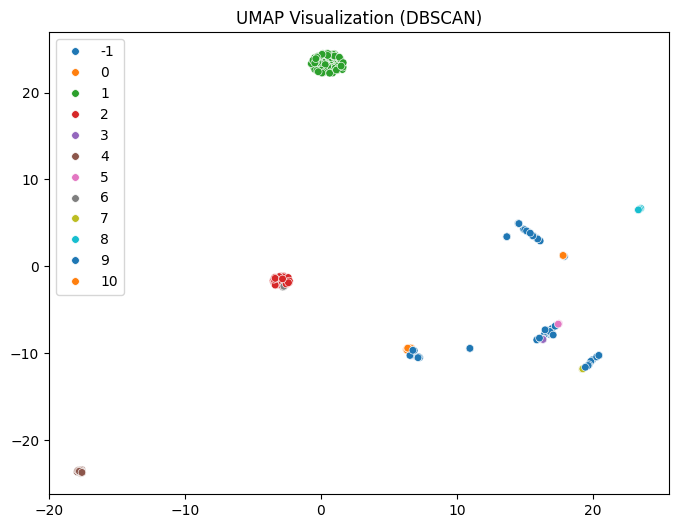


=== GPT + DBSCAN ===
Silhouette Score: 0.6763636469841003
Calinski–Harabasz Score: 234.60995483398438
Davies–Bouldin Score: 1.066149550163567


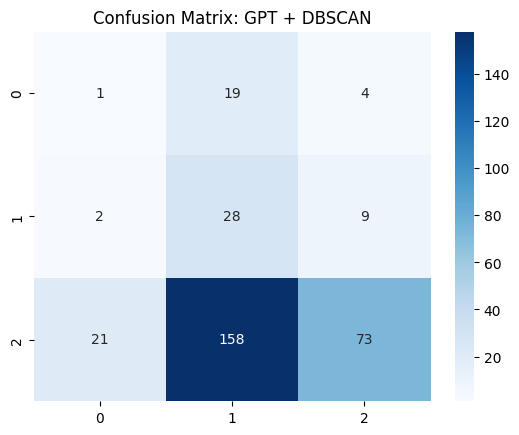

In [ ]:
# ============================================
# Comprehensive Clustering Pipeline
# ============================================

!pip install transformers umap-learn scikit-learn matplotlib seaborn

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import umap.umap_ as umap

from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder

from transformers import (
    BertTokenizer, BertModel,
    GPT2Tokenizer, GPT2Model,
    RobertaTokenizer, RobertaModel,
    DistilBertTokenizer, DistilBertModel,
    XLMTokenizer, XLMModel,
    T5Tokenizer, T5EncoderModel,
    CTRLTokenizer, CTRLModel,
    XLNetTokenizer, XLNetModel,
    AutoTokenizer, AutoModel
)

import torch

# ============================================
# Load Dataset
# ============================================

file_path = "/content/drive/MyDrive/Colab Notebooks/Womens Clothing E-Commerce Reviews.csv"
df = pd.read_csv(file_path)

# Ensure we have a text and sentiment column
text_column = "Review Text"
sentiment_column = "Rating"  # Or use your sentiment label if available

df = df.dropna(subset=[text_column])
texts = df[text_column].astype(str).tolist()

# Optional: Convert ratings to sentiment labels (Positive, Neutral, Negative)
def rating_to_sentiment(r):
    if r >= 4: return "Positive"
    elif r == 3: return "Neutral"
    else: return "Negative"

if sentiment_column in df.columns:
    df["Sentiment"] = df[sentiment_column].apply(rating_to_sentiment)
    true_labels = LabelEncoder().fit_transform(df["Sentiment"])
else:
    true_labels = None

# ============================================
# Tokenizers & Models
# ============================================

models = {
    "BERT": ("bert-base-uncased", BertTokenizer, BertModel),
    "GPT-2": ("gpt2", GPT2Tokenizer, GPT2Model),
    "RoBERTa": ("roberta-base", RobertaTokenizer, RobertaModel),
    "DistilBERT": ("distilbert-base-uncased", DistilBertTokenizer, DistilBertModel),
    "XLM": ("xlm-mlm-en-2048", XLMTokenizer, XLMModel),
    "T5": ("t5-small", T5Tokenizer, T5EncoderModel),
    "CTRL": ("ctrl", CTRLTokenizer, CTRLModel),
    "XLNet": ("xlnet-base-cased", XLNetTokenizer, XLNetModel),
    "GPT": ("openai-community/gpt2", AutoTokenizer, AutoModel)  # placeholder
}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def get_embeddings(model_name, tokenizer_class, model_class, texts, max_length=64):
    tokenizer = tokenizer_class.from_pretrained(model_name)
    model = model_class.from_pretrained(model_name).to(device)
    model.eval()

    # Add padding token for models that don't have one
    if tokenizer.pad_token is None:
        tokenizer.pad_token = tokenizer.eos_token

    embeddings = []
    for text in texts:
        inputs = tokenizer(text, return_tensors='pt', truncation=True, padding='max_length', max_length=max_length).to(device)
        with torch.no_grad():
            output = model(**inputs)
        if hasattr(output, "last_hidden_state"):
            cls_embedding = output.last_hidden_state[:, 0, :].cpu().numpy()
        else:
            cls_embedding = output[0][:, 0, :].cpu().numpy()
        embeddings.append(cls_embedding.squeeze())
    return np.vstack(embeddings)

# ============================================
# Clustering & Evaluation
# ============================================

def evaluate_clustering(X, labels, method_name, true_labels=None):
    sil = silhouette_score(X, labels) if len(set(labels)) > 1 else None
    ch = calinski_harabasz_score(X, labels) if len(set(labels)) > 1 else None
    db = davies_bouldin_score(X, labels) if len(set(labels)) > 1 else None

    print(f"\n=== {method_name} ===")
    print(f"Silhouette Score: {sil}")
    print(f"Calinski–Harabasz Score: {ch}")
    print(f"Davies–Bouldin Score: {db}")

    if true_labels is not None:
        cm = confusion_matrix(true_labels, labels, labels=np.unique(true_labels))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.title(f"Confusion Matrix: {method_name}")
        plt.show()

def cluster_and_visualize(X, method, n_clusters=3, eps=0.5, min_samples=5):
    if method == "KMeans":
        model = KMeans(n_clusters=n_clusters, random_state=42)
    elif method == "Agglomerative":
        model = AgglomerativeClustering(n_clusters=n_clusters)
    elif method == "DBSCAN":
        model = DBSCAN(eps=eps, min_samples=min_samples)
    else:
        raise ValueError("Unknown method")

    labels = model.fit_predict(X)

    reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='cosine', random_state=42)
    X_umap = reducer.fit_transform(X)

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=X_umap[:, 0], y=X_umap[:, 1], hue=labels, palette="tab10", s=30)
    plt.title(f"UMAP Visualization ({method})")
    plt.show()

    return labels

# ============================================
# Main Loop
# ============================================

for model_name, (name, tokenizer_class, model_class) in models.items():
    print(f"\n\n=== Processing with {model_name} ===")
    X = get_embeddings(name, tokenizer_class, model_class, texts[:500])  # limit to 500 for speed

    for method in ["KMeans", "Agglomerative", "DBSCAN"]:
        labels = cluster_and_visualize(X, method)
        evaluate_clustering(X, labels, f"{model_name} + {method}", true_labels=true_labels[:500] if true_labels is not None else None)

**Comprehensive Transformer-Based Text Clustering with Multi-Model Embeddings, Multi-Method Clustering, and UMAP Visualization**

This script performs a full-scale clustering analysis using embeddings from multiple transformer models (BERT, GPT-2, RoBERTa, XLNet, DistilBERT, T5, XLM, CTRL, and GPT). It applies three clustering methods—KMeans, Agglomerative, and DBSCAN—and evaluates them using Silhouette, Calinski–Harabasz, and Davies–Bouldin scores. UMAP is used for dimensionality reduction and 2D visualization of cluster structures, while optional ground-truth sentiment alignment allows confusion matrix comparison between true and predicted labels.



=== Processing with BERT ===


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


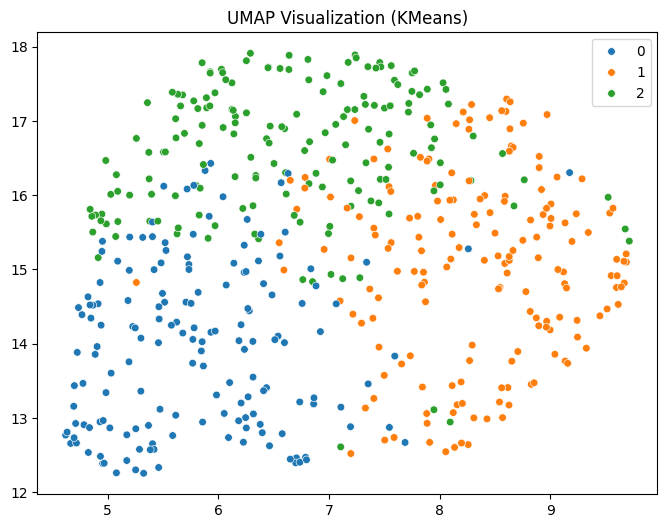


=== BERT + KMeans ===
Silhouette Score: 0.037897080183029175
Calinski–Harabasz Score: 27.492420196533203
Davies–Bouldin Score: 3.733794535353003


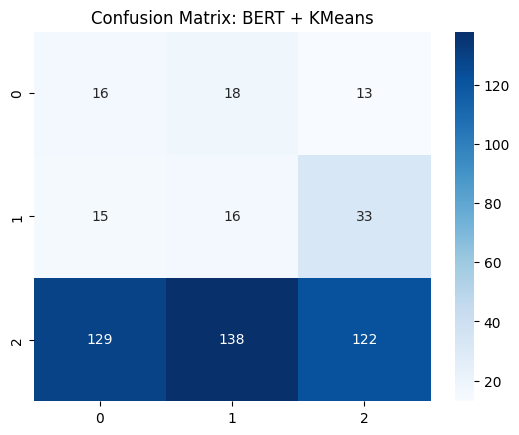

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


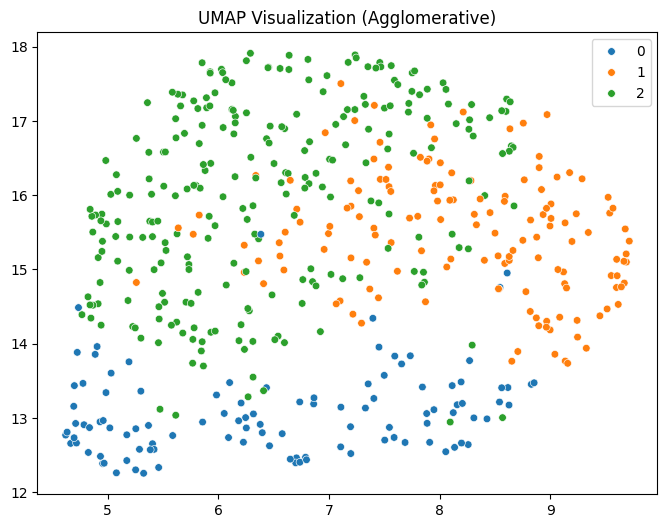


=== BERT + Agglomerative ===
Silhouette Score: 0.04101671278476715
Calinski–Harabasz Score: 21.22210121154785
Davies–Bouldin Score: 4.090467313394491


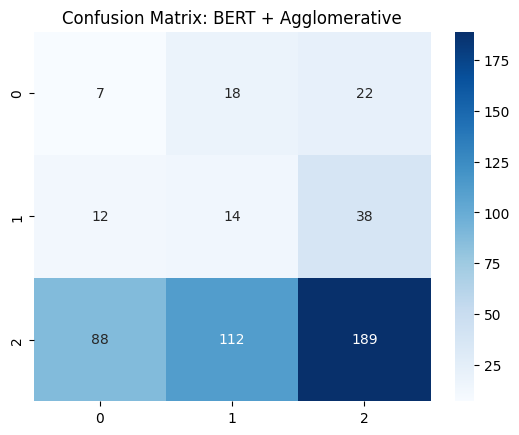

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


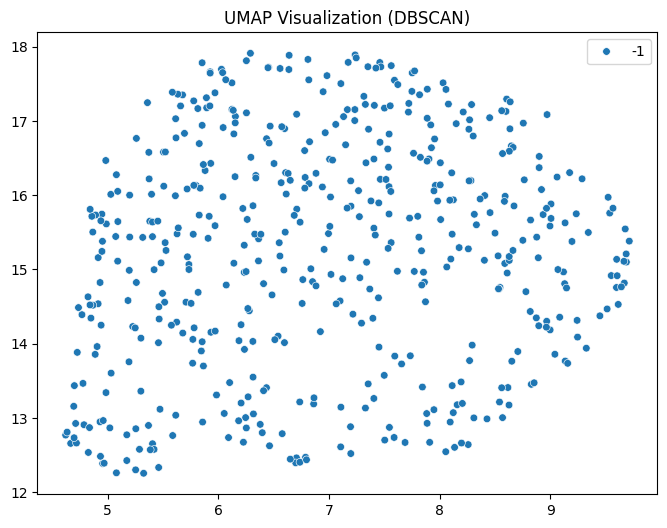


=== BERT + DBSCAN ===
Silhouette Score: None
Calinski–Harabasz Score: None
Davies–Bouldin Score: None


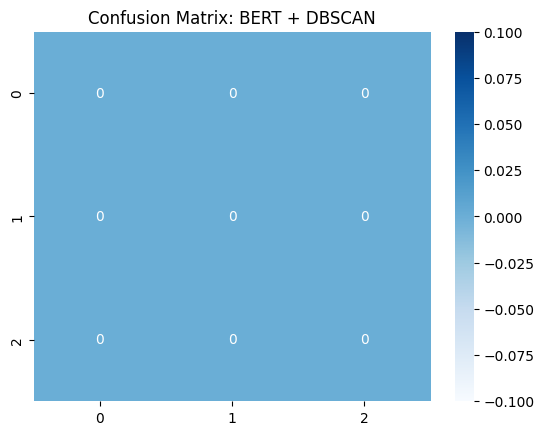



=== Processing with GPT-2 ===


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


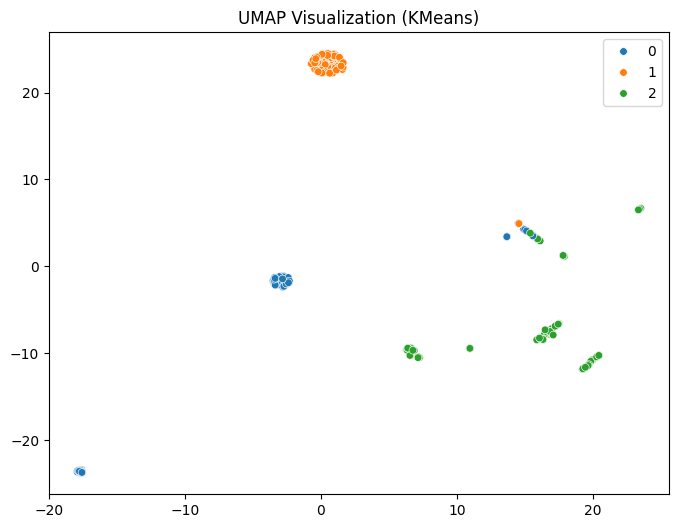


=== GPT-2 + KMeans ===
Silhouette Score: 0.7009952664375305
Calinski–Harabasz Score: 913.225830078125
Davies–Bouldin Score: 0.5974081209983138


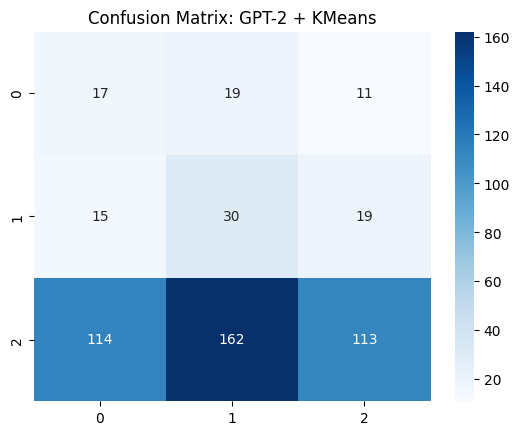

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


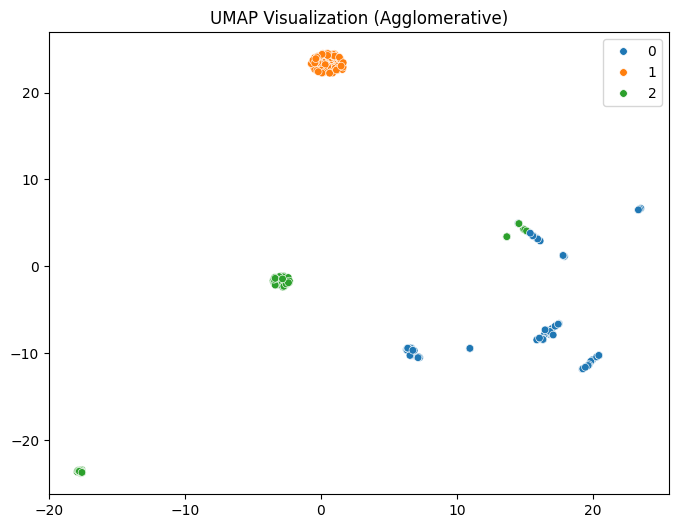


=== GPT-2 + Agglomerative ===
Silhouette Score: 0.7039060592651367
Calinski–Harabasz Score: 883.5217895507812
Davies–Bouldin Score: 0.5937297610536755


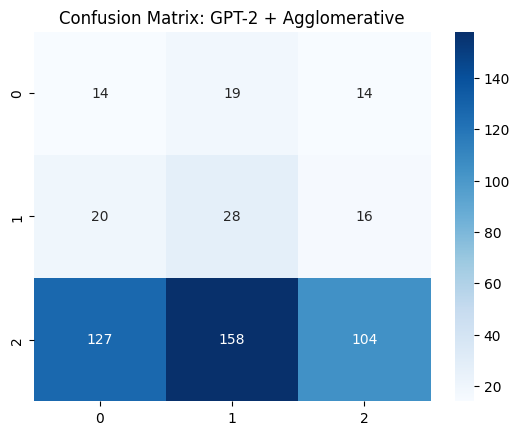

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


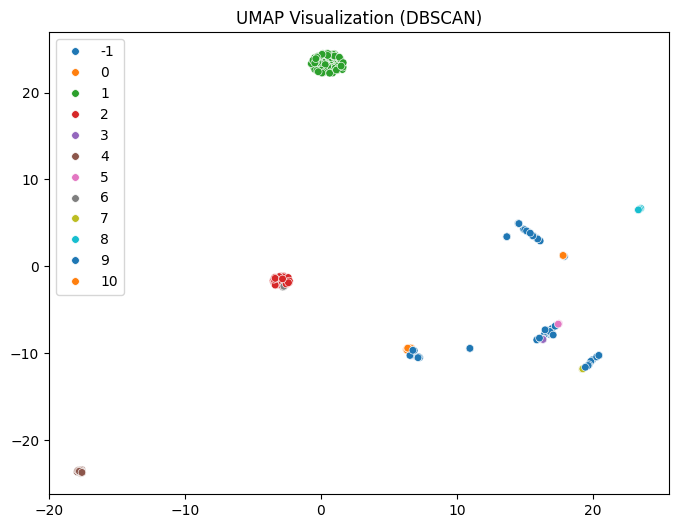


=== GPT-2 + DBSCAN ===
Silhouette Score: 0.6763636469841003
Calinski–Harabasz Score: 234.60995483398438
Davies–Bouldin Score: 1.066149550163567


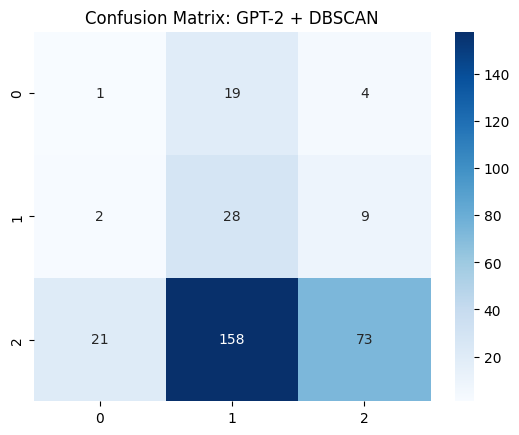



=== Processing with RoBERTa ===


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


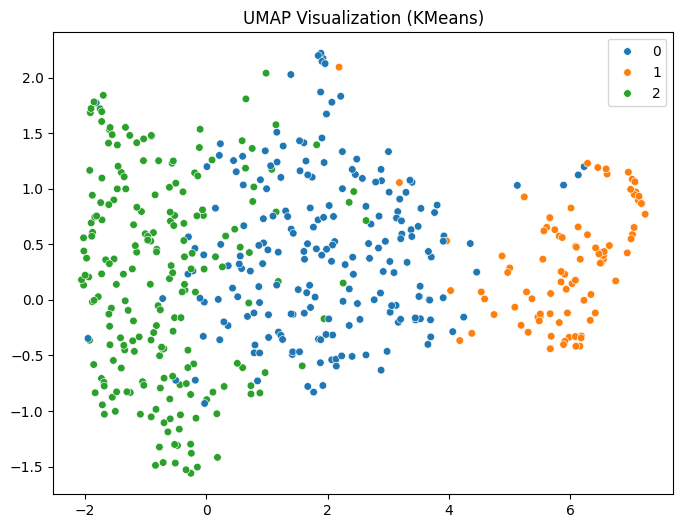


=== RoBERTa + KMeans ===
Silhouette Score: 0.1202092319726944
Calinski–Harabasz Score: 108.10348510742188
Davies–Bouldin Score: 2.245495096585153


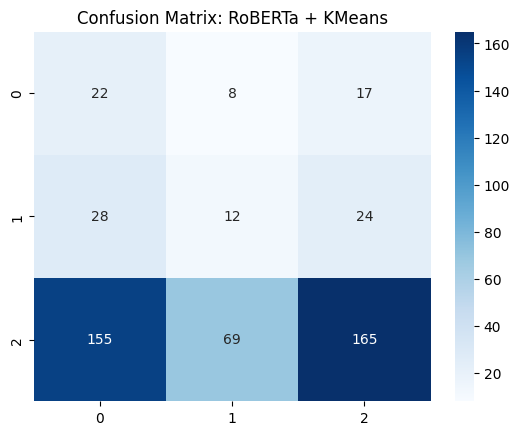

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


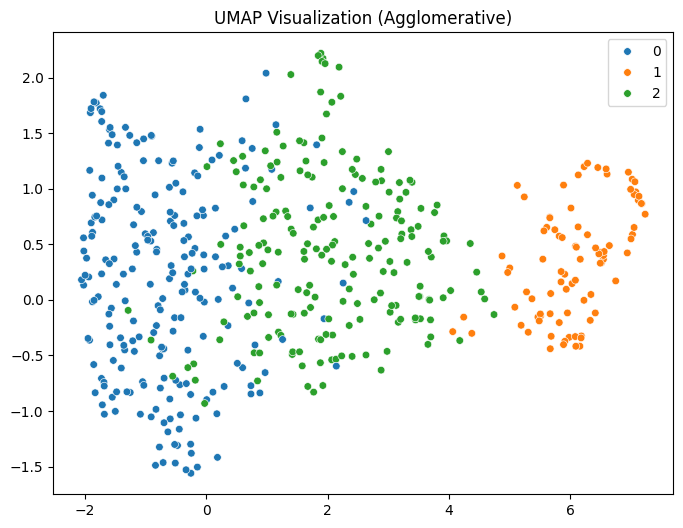


=== RoBERTa + Agglomerative ===
Silhouette Score: 0.11239434778690338
Calinski–Harabasz Score: 102.9270248413086
Davies–Bouldin Score: 2.273424293231032


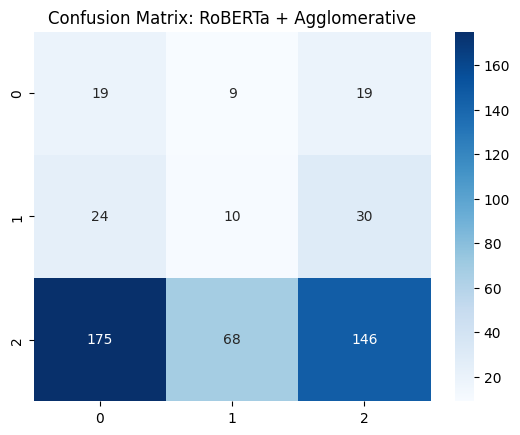

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


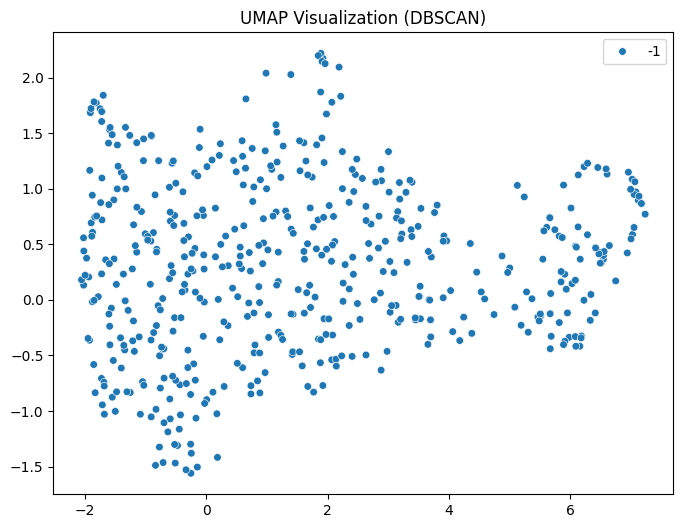


=== RoBERTa + DBSCAN ===
Silhouette Score: None
Calinski–Harabasz Score: None
Davies–Bouldin Score: None


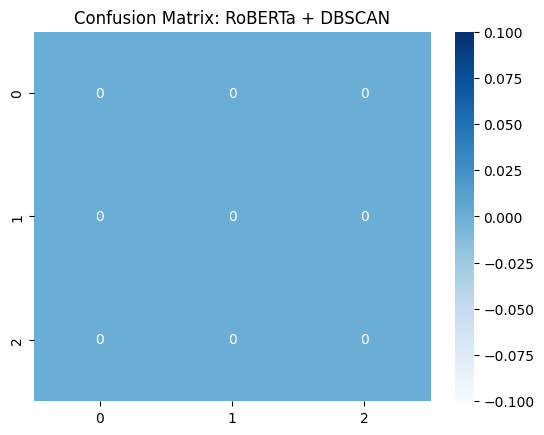



=== Processing with DistilBERT ===


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


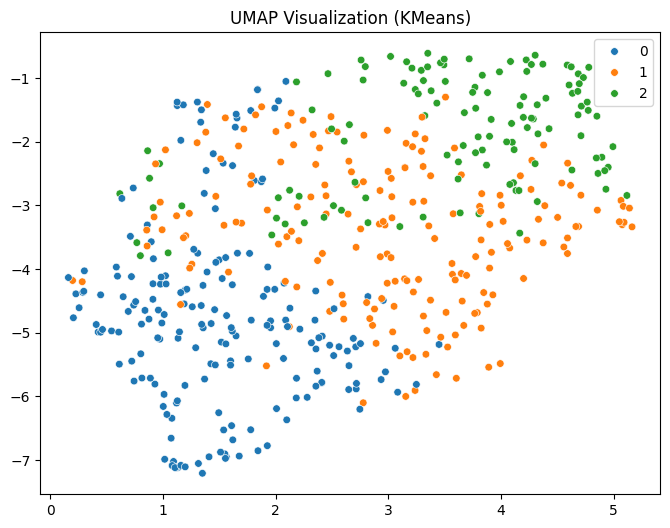


=== DistilBERT + KMeans ===
Silhouette Score: 0.0601017065346241
Calinski–Harabasz Score: 41.90850067138672
Davies–Bouldin Score: 3.3971851257915464


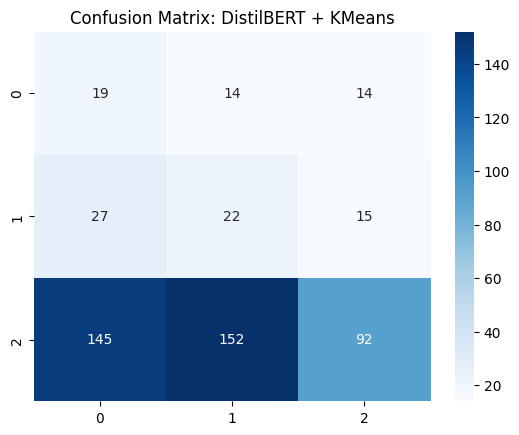

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


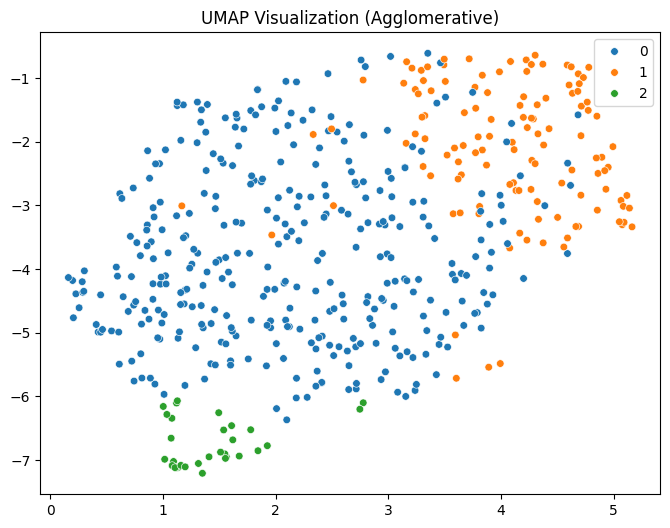


=== DistilBERT + Agglomerative ===
Silhouette Score: 0.0837232768535614
Calinski–Harabasz Score: 35.98732376098633
Davies–Bouldin Score: 2.680606542858986


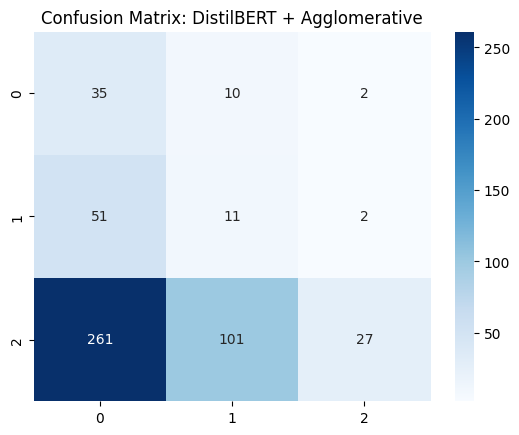

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


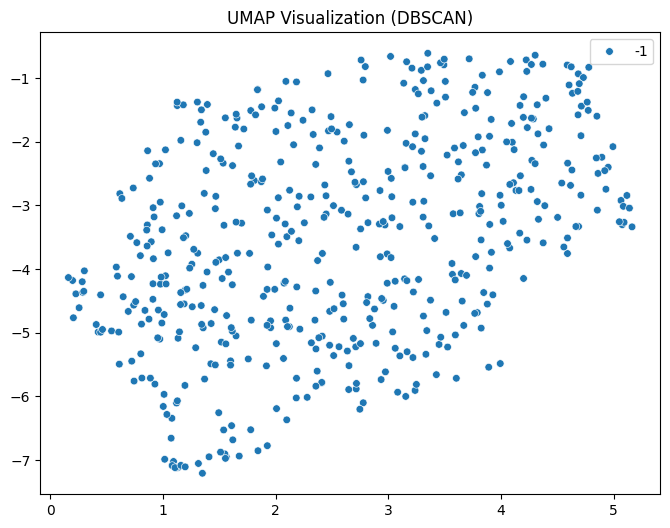


=== DistilBERT + DBSCAN ===
Silhouette Score: None
Calinski–Harabasz Score: None
Davies–Bouldin Score: None


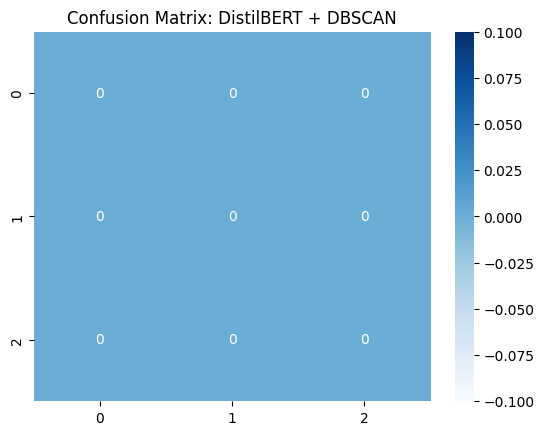



=== Processing with XLM ===


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


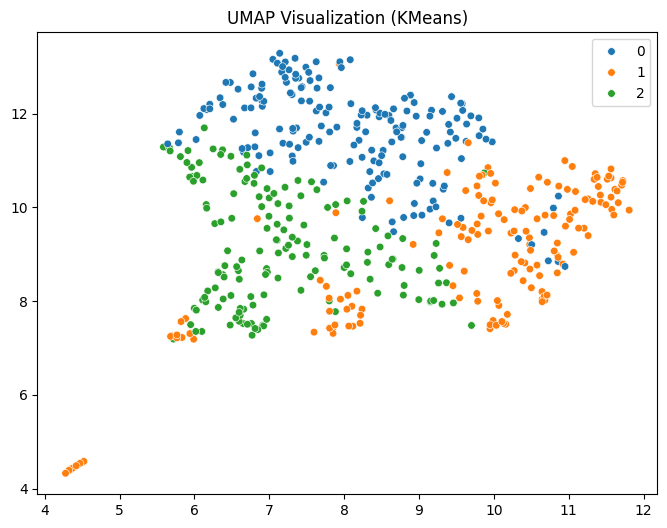


=== XLM + KMeans ===
Silhouette Score: 0.07672442495822906
Calinski–Harabasz Score: 42.48207473754883
Davies–Bouldin Score: 2.7785547762693095


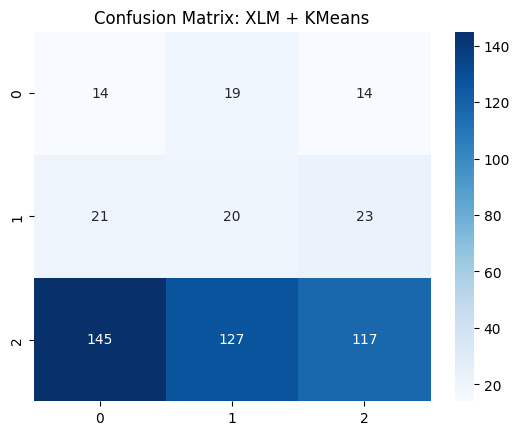

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


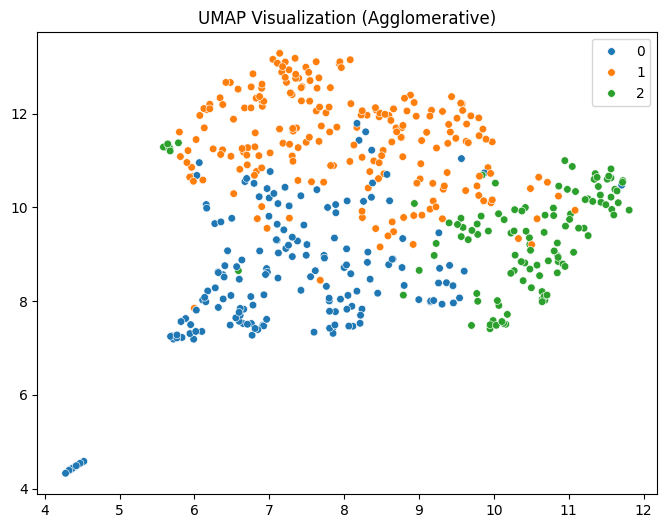


=== XLM + Agglomerative ===
Silhouette Score: 0.06847970932722092
Calinski–Harabasz Score: 36.88217544555664
Davies–Bouldin Score: 3.039905403046985


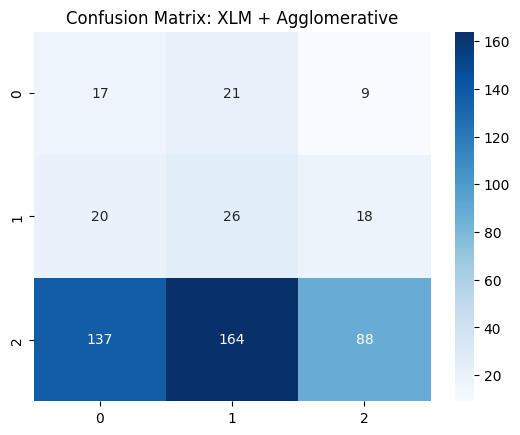

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


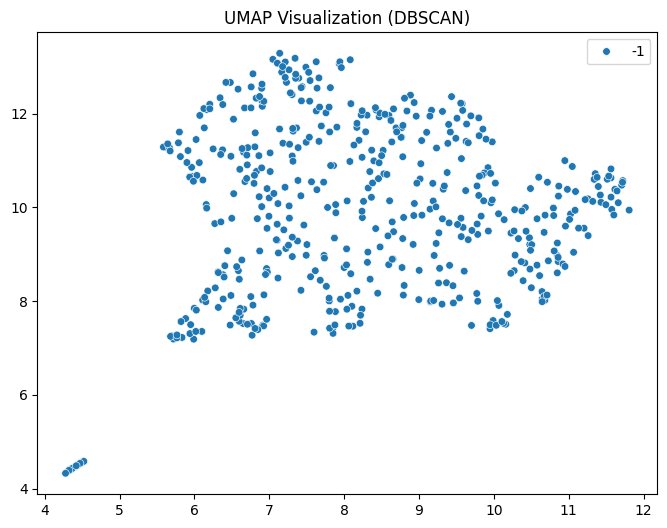


=== XLM + DBSCAN ===
Silhouette Score: None
Calinski–Harabasz Score: None
Davies–Bouldin Score: None


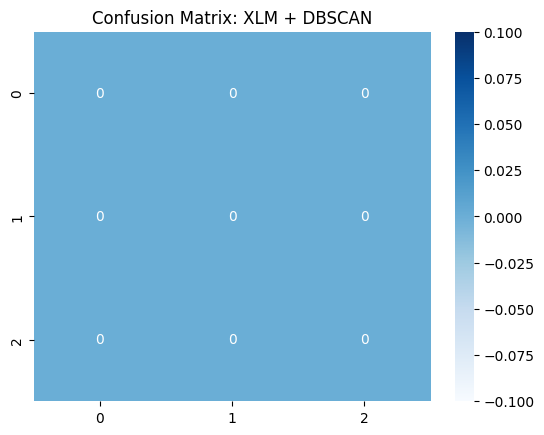



=== Processing with T5 ===


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


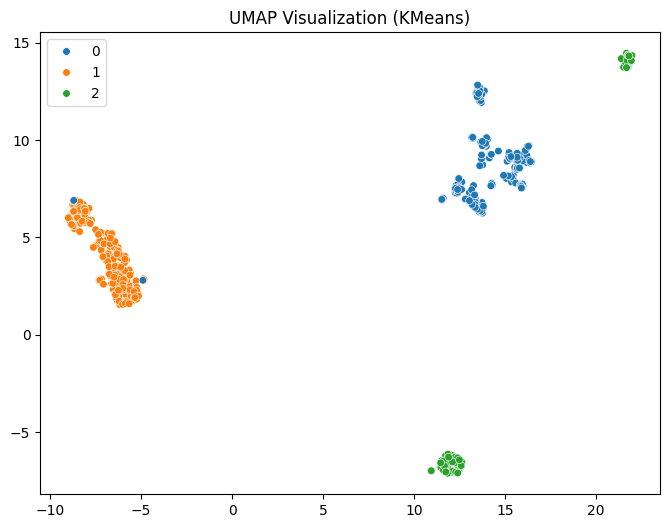


=== T5 + KMeans ===
Silhouette Score: 0.32522523403167725
Calinski–Harabasz Score: 171.12652587890625
Davies–Bouldin Score: 1.5574128422300308


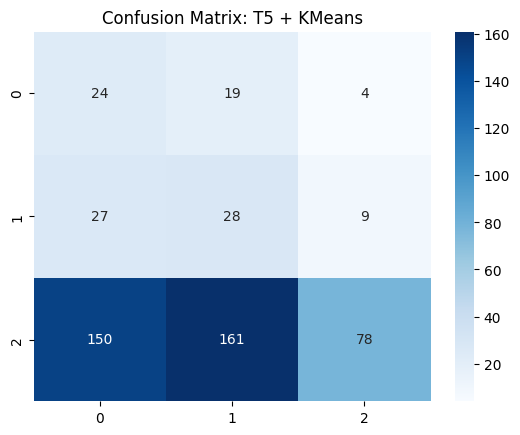

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


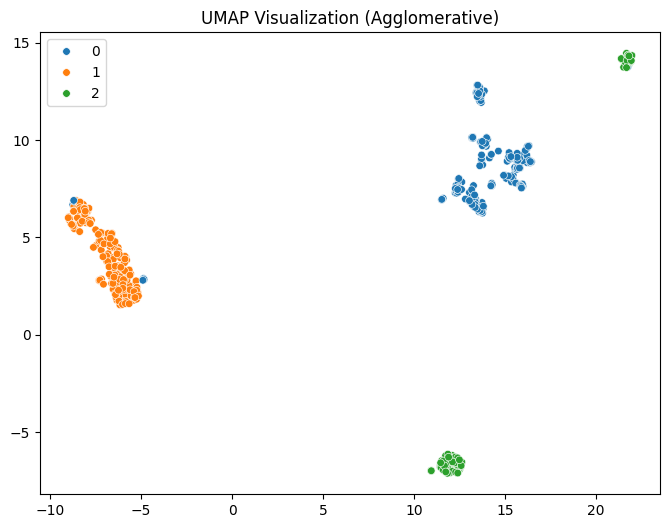


=== T5 + Agglomerative ===
Silhouette Score: 0.32392606139183044
Calinski–Harabasz Score: 170.60284423828125
Davies–Bouldin Score: 1.5580052334225485


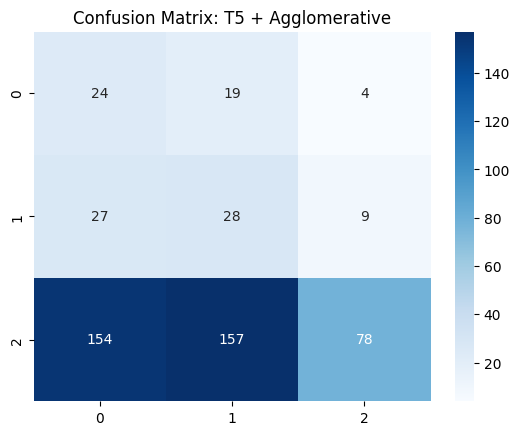

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


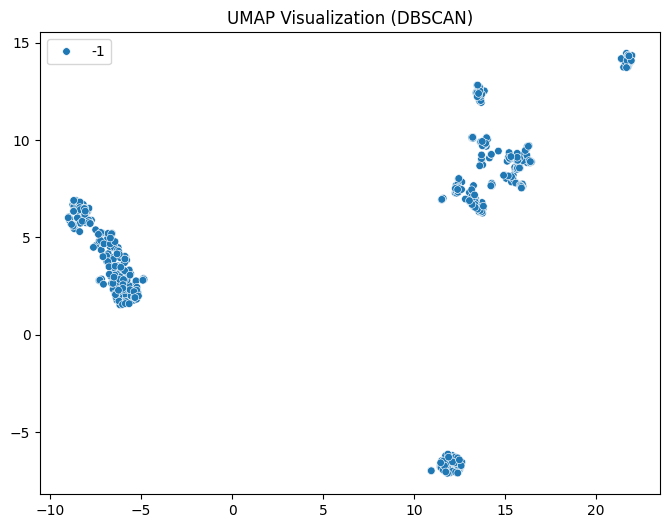


=== T5 + DBSCAN ===
Silhouette Score: None
Calinski–Harabasz Score: None
Davies–Bouldin Score: None


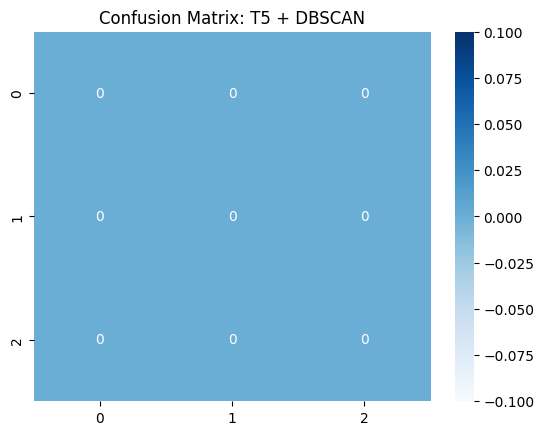



=== Processing with XLNet ===


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


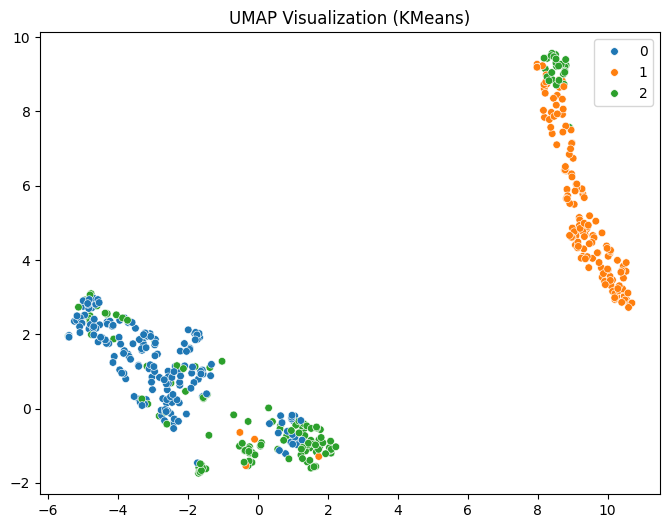


=== XLNet + KMeans ===
Silhouette Score: 0.35685211420059204
Calinski–Harabasz Score: 759.8405151367188
Davies–Bouldin Score: 1.0791778993449415


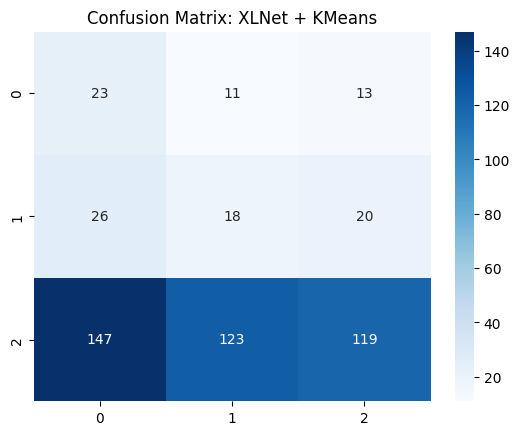

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


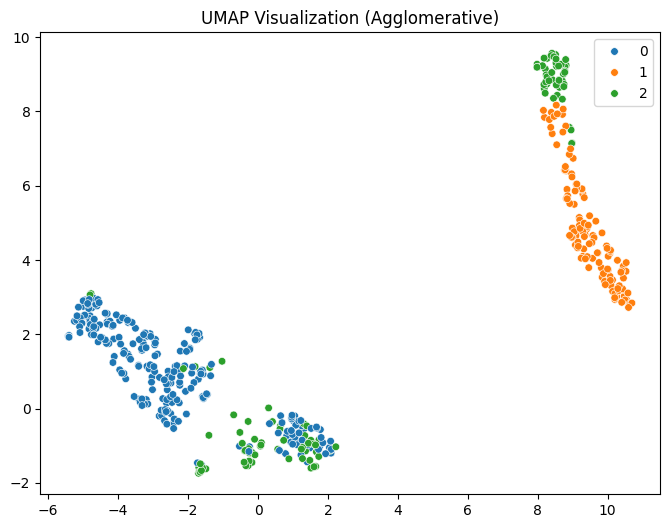


=== XLNet + Agglomerative ===
Silhouette Score: 0.3726060688495636
Calinski–Harabasz Score: 709.0798950195312
Davies–Bouldin Score: 1.0343975074991554


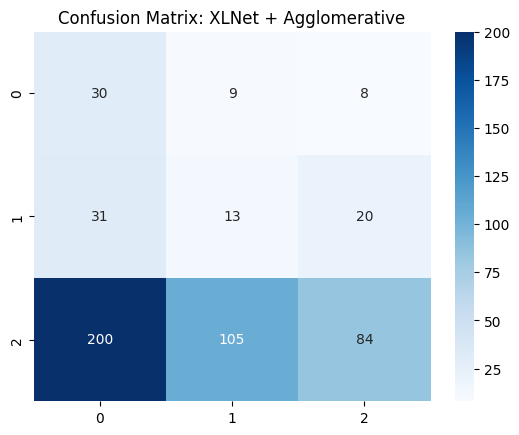

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


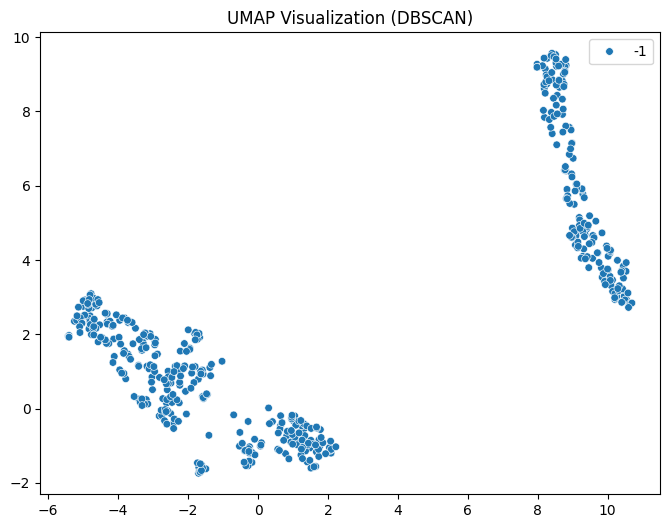


=== XLNet + DBSCAN ===
Silhouette Score: None
Calinski–Harabasz Score: None
Davies–Bouldin Score: None


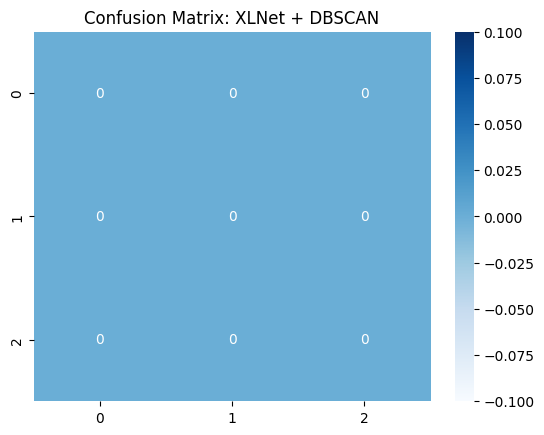



=== Processing with GPT ===


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


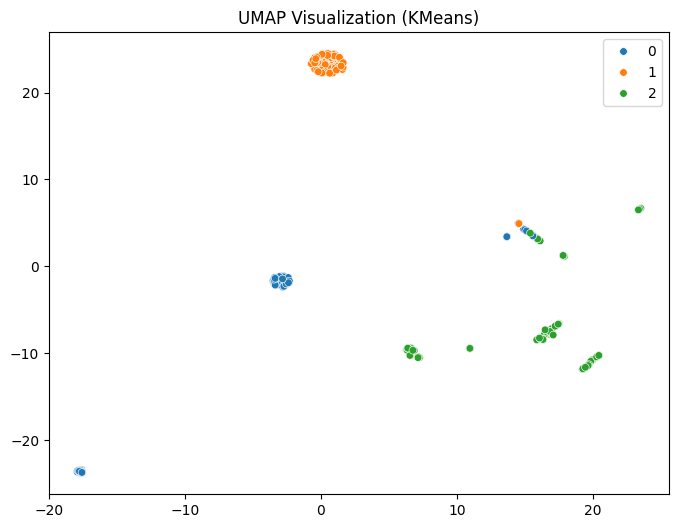


=== GPT + KMeans ===
Silhouette Score: 0.7009952664375305
Calinski–Harabasz Score: 913.225830078125
Davies–Bouldin Score: 0.5974081209983138


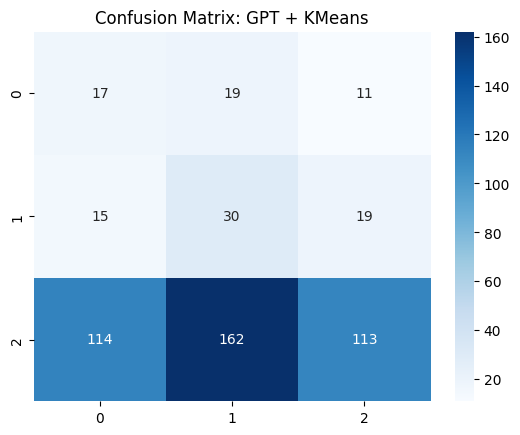

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


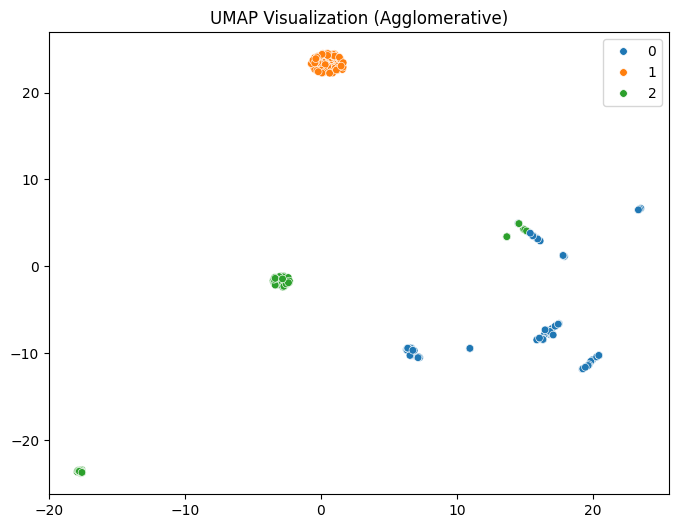


=== GPT + Agglomerative ===
Silhouette Score: 0.7039060592651367
Calinski–Harabasz Score: 883.5217895507812
Davies–Bouldin Score: 0.5937297610536755


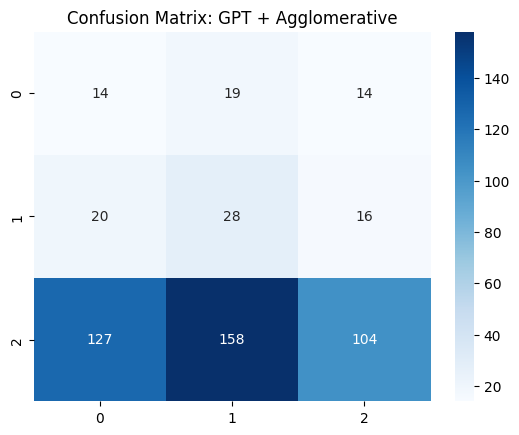

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


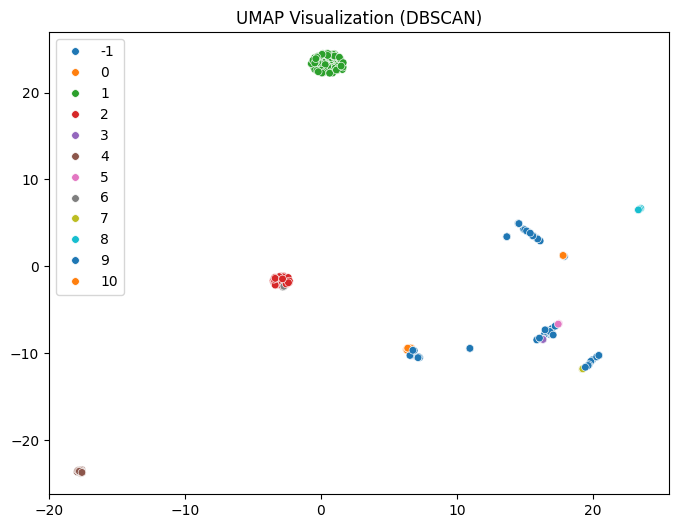


=== GPT + DBSCAN ===
Silhouette Score: 0.6763636469841003
Calinski–Harabasz Score: 234.60995483398438
Davies–Bouldin Score: 1.066149550163567


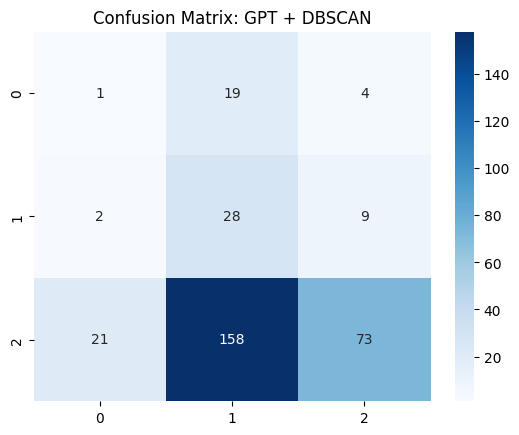

In [ ]:
# ============================================
# Comprehensive Clustering Pipeline
# ============================================

!pip install transformers umap-learn scikit-learn matplotlib seaborn

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import umap.umap_ as umap

from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder

from transformers import (
    BertTokenizer, BertModel,
    GPT2Tokenizer, GPT2Model,
    RobertaTokenizer, RobertaModel,
    DistilBertTokenizer, DistilBertModel,
    XLMTokenizer, XLMModel,
    T5Tokenizer, T5EncoderModel,
    CTRLTokenizer, CTRLModel,
    XLNetTokenizer, XLNetModel,
    AutoTokenizer, AutoModel
)

import torch

# ============================================
# Load Dataset
# ============================================

file_path = "/content/drive/MyDrive/Colab Notebooks/Womens Clothing E-Commerce Reviews.csv"
df = pd.read_csv(file_path)

# Ensure we have a text and sentiment column
text_column = "Review Text"
sentiment_column = "Rating"  # Or use your sentiment label if available

df = df.dropna(subset=[text_column])
texts = df[text_column].astype(str).tolist()

# Optional: Convert ratings to sentiment labels (Positive, Neutral, Negative)
def rating_to_sentiment(r):
    if r >= 4: return "Positive"
    elif r == 3: return "Neutral"
    else: return "Negative"

if sentiment_column in df.columns:
    df["Sentiment"] = df[sentiment_column].apply(rating_to_sentiment)
    true_labels = LabelEncoder().fit_transform(df["Sentiment"])
else:
    true_labels = None

# ============================================
# Tokenizers & Models
# ============================================

models = {
    "BERT": ("bert-base-uncased", BertTokenizer, BertModel),
    "GPT-2": ("gpt2", GPT2Tokenizer, GPT2Model),
    "RoBERTa": ("roberta-base", RobertaTokenizer, RobertaModel),
    "DistilBERT": ("distilbert-base-uncased", DistilBertTokenizer, DistilBertModel),
    "XLM": ("xlm-mlm-en-2048", XLMTokenizer, XLMModel),
    "T5": ("t5-small", T5Tokenizer, T5EncoderModel),
    "CTRL": ("ctrl", CTRLTokenizer, CTRLModel),
    "XLNet": ("xlnet-base-cased", XLNetTokenizer, XLNetModel),
    "GPT": ("openai-community/gpt2", AutoTokenizer, AutoModel)  # placeholder
}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def get_embeddings(model_name, tokenizer_class, model_class, texts, max_length=64):
    tokenizer = tokenizer_class.from_pretrained(model_name)
    model = model_class.from_pretrained(model_name).to(device)
    model.eval()

    # Add padding token for models that don't have one
    if tokenizer.pad_token is None:
        tokenizer.pad_token = tokenizer.eos_token

    embeddings = []
    for text in texts:
        inputs = tokenizer(text, return_tensors='pt', truncation=True, padding='max_length', max_length=max_length).to(device)
        with torch.no_grad():
            output = model(**inputs)
        if hasattr(output, "last_hidden_state"):
            cls_embedding = output.last_hidden_state[:, 0, :].cpu().numpy()
        else:
            cls_embedding = output[0][:, 0, :].cpu().numpy()
        embeddings.append(cls_embedding.squeeze())
    return np.vstack(embeddings)

# ============================================
# Clustering & Evaluation
# ============================================

def evaluate_clustering(X, labels, method_name, true_labels=None):
    sil = silhouette_score(X, labels) if len(set(labels)) > 1 else None
    ch = calinski_harabasz_score(X, labels) if len(set(labels)) > 1 else None
    db = davies_bouldin_score(X, labels) if len(set(labels)) > 1 else None

    print(f"\n=== {method_name} ===")
    print(f"Silhouette Score: {sil}")
    print(f"Calinski–Harabasz Score: {ch}")
    print(f"Davies–Bouldin Score: {db}")

    if true_labels is not None:
        cm = confusion_matrix(true_labels, labels, labels=np.unique(true_labels))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.title(f"Confusion Matrix: {method_name}")
        plt.show()

def cluster_and_visualize(X, method, n_clusters=3, eps=0.5, min_samples=5):
    if method == "KMeans":
        model = KMeans(n_clusters=n_clusters, random_state=42)
    elif method == "Agglomerative":
        model = AgglomerativeClustering(n_clusters=n_clusters)
    elif method == "DBSCAN":
        model = DBSCAN(eps=eps, min_samples=min_samples)
    else:
        raise ValueError("Unknown method")

    labels = model.fit_predict(X)

    reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='cosine', random_state=42)
    X_umap = reducer.fit_transform(X)

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=X_umap[:, 0], y=X_umap[:, 1], hue=labels, palette="tab10", s=30)
    plt.title(f"UMAP Visualization ({method})")
    plt.show()

    return labels

# ============================================
# Main Loop
# ============================================

for model_name, (name, tokenizer_class, model_class) in models.items():
    print(f"\n\n=== Processing with {model_name} ===")
    X = get_embeddings(name, tokenizer_class, model_class, texts[:500])  # limit to 500 for speed

    for method in ["KMeans", "Agglomerative", "DBSCAN"]:
        labels = cluster_and_visualize(X, method)
        evaluate_clustering(X, labels, f"{model_name} + {method}", true_labels=true_labels[:500] if true_labels is not None else None)